#### Dependencies

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from hmmlearn.hmm import GaussianHMM
from tqdm import tqdm
import seaborn as sns
from scipy.stats import chisquare
import sys
from scipy.stats import norm
from scipy.optimize import curve_fit
import matplotlib as mpl
import joblib
from sklearn.model_selection import KFold
from matplotlib.colors import LogNorm
from scipy.interpolate import PchipInterpolator
from scipy.stats import ttest_ind
from scipy.stats import linregress
import warnings
import matplotlib.cm as cm
from sklearn.mixture import GaussianMixture
import os

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
plt.rcParams.update({
    'font.family': 'Arial',       # Set default font to Arial
    'font.size': 12,               # Set default font size to 2
    'figure.figsize': (4, 4),     # Set default figure size to 4x4 inches
    'axes.labelweight': 'bold',   # Make axis labels bold
    'axes.titleweight': 'bold',   # Make title bold
    'axes.titlesize': 12,          # Set title size to 2
    'axes.labelsize': 12,          # Set axis label size to 2
    'xtick.labelsize': 12,         # Set x-tick label size to 2
    'ytick.labelsize': 12,         # Set y-tick label size to 2
    'xtick.major.width': 0.9,     # Increase tick width
    'ytick.major.width': 0.9,     # Increase tick width
    'xtick.major.size': 3,        # Increase tick size
    'ytick.major.size': 3,        # Increase tick size
    'axes.linewidth': 1.1,        # Set axis line width
    'font.weight': 'bold',        # Make all text bold
})

mpl.rcParams['pdf.fonttype'] = 42

#### Functions

In [3]:
def bin_size(data, binwidth):
    return np.arange(min(data), max(data) + binwidth, binwidth)

In [4]:
def downsample(df, downsampling):
    df['time_delta'] = pd.to_timedelta(df['time (seconds)'], unit='s')
    df.set_index('time_delta', inplace=True)

    # Downsample data to the specified interval
    downsampled_df = df.resample(downsampling).mean()  # e.g., '500000U' represents 500,000 microseconds (0.5 seconds)

    # Optionally, drop any rows with NaN values that might have been introduced
    downsampled_df.dropna(inplace=True)

    # Calculate the original temporal resolution in Hz
    original_resolution_s = (df['time (seconds)'].iloc[1] - df['time (seconds)'].iloc[0])
    original_resolution_hz = 1 / original_resolution_s

    # Calculate the downsample factor
    downsample_interval = pd.to_timedelta(downsampling).total_seconds()
    downsample_factor = downsample_interval / original_resolution_s

    # Calculate the new temporal resolution in Hz
    new_resolution_hz = 1 / downsample_interval

    print(f"Downsample factor: {downsample_factor:.2f}")
    print(f"Original temporal resolution: {original_resolution_hz:.2f} Hz")
    print(f"New temporal resolution: {new_resolution_hz:.2f} Hz")

    return downsampled_df


In [5]:
def smooth_and_shift_trace(df, start_time, end_time, window_size=20000, target_intercept=12.00):
    # Assuming your DataFrame is already loaded as df (df['time (seconds)'], df['force (pN)'])
    time = df['time (seconds)'].values
    force = df['force (pN)'].values

    # Step 1: Apply extreme smoothing to the force data
    force_smooth = pd.Series(force).rolling(window=window_size, min_periods=1, center=True).mean().values

    # Step 2: Select the range of the trace for fitting
    mask = (time >= start_time) & (time <= end_time)
    time_fit = time[mask]
    force_smooth_fit = force_smooth[mask]

    # Step 3: Fit a linear line (linear regression) to the smoothed data in the selected range
    slope, intercept = np.polyfit(time_fit, force_smooth_fit, 1)

    # Step 4: Calculate the linear drift component using the fitted line from the selected range
    fitted_line_fit_range = slope * time_fit + intercept

    # Step 5: Shift the entire force trace so that the fitted line intercepts at the target intercept (e.g., 12.00)
    intercept_adjustment = target_intercept - intercept
    force_corrected = force + intercept_adjustment

    # Step 6: Refit the corrected data to check the new slope and intercept (over the fitting range only)
    final_corrected_slope, final_corrected_intercept = np.polyfit(time_fit, force_corrected[mask], 1)
    corrected_fitted_line_fit_range = final_corrected_slope * time_fit + final_corrected_intercept

    # Step 7: Plot the original force data, smoothed data, the fitted line in the fit range, and the corrected force data
    fig, ax = plt.subplots(3, 1, figsize=(6, 7))

    # Plot the original force data and smoothed data
    ax[0].plot(time, force, label="Original Force", color='lightsteelblue', alpha=1)
    ax[0].plot(time, force_smooth, label=f"Smoothed Force (window={window_size})", color='black', lw=1.5)
    #ax[0].set_title("Original Force with Smoothing")
    ax[0].set_xlabel('Time (seconds)')
    ax[0].set_ylabel('Force (pN)')
    ax[0].set_ylim(8,15)
    #ax[0].set_xlim(75,160)
    ax[0].legend(frameon=False)

    # Plot the fitted line only within the selected fitting range
    ax[1].plot(time, force, label="Original Force", color='lightsteelblue', alpha=1)
    ax[1].plot(time_fit, fitted_line_fit_range, label=f"Fitted Line in Fit Range (y = {slope:.3f}x + {intercept:.2f})", color='purple', lw=2)
    ax[1].axvspan(start_time, end_time, color='yellow', alpha=0.2, label="Fit Range")  # Highlight fitting range
    #ax[1].set_title("Linear Fit in Selected Range")
    ax[1].set_xlabel('Time (seconds)')
    ax[1].set_ylabel('Force (pN)')
    ax[1].set_ylim(8,15)
    #ax[1].set_xlim(75,160)
    ax[1].legend(frameon=False)


    # Plot the corrected force data over the entire trace with the final fit (zero slope and intercept at target intercept)
    ax[2].plot(time, force_corrected, label=f"Corrected Force (Intercept at {target_intercept})", color='lightgrey')
    ax[2].plot(time, np.full_like(time, target_intercept), label=f"Expected Baseline (y = {target_intercept})", color='purple', lw=2, linestyle='--')
    #ax[2].set_title("Corrected Force over Entire Trace")
    ax[2].set_xlabel('Time (seconds)')
    ax[2].set_ylabel('Force (pN)')
    ax[2].set_ylim(8,15)
    #ax[2].set_xlim(75,160)
    ax[2].legend(frameon=False)


    # # Plot the corrected data fit in the same fitting range to confirm zero slope
    # ax[3].plot(time_fit, force_corrected[mask], label="Corrected Force (Fit Range)", color='blue', alpha=0.5)
    # ax[3].plot(time_fit, corrected_fitted_line_fit_range, label=f"Fit to Corrected Data (y = {final_corrected_slope:.3f}x + {final_corrected_intercept:.2f})", color='purple', lw=2)
    # ax[3].axhline(target_intercept, color='orange', linestyle='--', label=f"Target Intercept at {target_intercept}")
    # ax[3].set_title("Fit to Corrected Data in Fit Range (Expecting Zero Slope)")
    # ax[3].set_xlabel('Time (seconds)')
    # ax[3].set_ylabel('Force (pN)')
    # ax[3].legend()

    #plt.suptitle(f'Force Over Time with Linear Drift Correction (Intercept at {target_intercept})')
    plt.tight_layout()
    plt.savefig('/Users/emily/Desktop/output.pdf', format='pdf')
    plt.show()

    # Optionally: Add the corrected force data back into the DataFrame
    df['force_corrected (pN)'] = force_corrected

    return df


In [6]:
def linear_correction(df, window_size=5000):
    # Assuming your DataFrame is already loaded as df (df['time (seconds)'], df['force (pN)'])
    time = df['time (seconds)'].values
    force = df['force (pN)'].values

    # Step 1: Apply a rolling window to smooth the force data
    force_smooth = pd.Series(force).rolling(window=window_size, min_periods=1, center=True).mean().values

    # Step 2: Fit a linear line (linear regression) to the smoothed data
    slope, intercept = np.polyfit(time, force_smooth, 1)

    # Step 3: Calculate the linear drift component using the fitted line from smoothed data
    fitted_line = slope * time + intercept

    # Step 4: Correct the original force data (not the smoothed one) while keeping the intercept at 12
    initial_force_corrected = force[0]  # Starting force value of the original data
    force_corrected = force - (fitted_line - initial_force_corrected)

    # Step 5: Adjust the corrected force data so that its fitted line has an intercept at exactly 12
    corrected_slope, corrected_intercept = np.polyfit(time, force_corrected, 1)
    intercept_adjustment = 12.00 - corrected_intercept
    force_corrected += intercept_adjustment

    # Step 6: Refit the corrected data to check the new intercept
    final_corrected_slope, final_corrected_intercept = np.polyfit(time, force_corrected, 1)
    corrected_fitted_line = final_corrected_slope * time + final_corrected_intercept

    # Step 7: Plot the original force data, smoothed data, the fitted linear trend, and the corrected force data
    fig, ax = plt.subplots(3, 1, figsize=(6, 7))

    # Plot the original force data
    ax[0].plot(time, force, label="Original force", color='lightsteelblue', alpha=1)

    # Plot the smoothed force data
    ax[0].plot(time, force_smooth, label=f"Smoothed force", color='black', lw=1.5)

    # Plot the fitted linear trend
    ax[1].plot(time, force, label="Original force", color='lightsteelblue', alpha=1)
    ax[1].plot(time, fitted_line, label=f"Linear fit (y = {slope:.3f}x + {intercept:.2f})", color='purple', lw=2, linestyle='--')

    # Plot the corrected force data with its final fit
    ax[2].plot(time, force_corrected, label="Corrected force", color='lightgrey', alpha=1)
    ax[2].plot(time, corrected_fitted_line, label=f"Linear fit (y = {final_corrected_slope:.3f}x + {final_corrected_intercept:.2f})", color='purple', lw=2, linestyle='--')

    # Customize the plots
    ax[0].set_xlabel('Time (seconds)')
    ax[0].set_ylabel('Force (pN)')
    ax[0].set_ylim(8,15)
    ax[0].set_xlim(10,200)
    ax[0].legend(frameon=False)

    ax[1].set_xlabel('Time (seconds)')
    ax[1].set_ylabel('Force (pN)')
    ax[1].set_ylim(8,15)
    ax[1].set_xlim(10,200)
    ax[1].legend(frameon=False)

    ax[2].set_xlabel('Time (seconds)')
    ax[2].set_ylabel('Force (pN)')
    ax[2].set_ylim(8,15)
    ax[2].set_xlim(10,200)
    ax[2].legend(frameon=False)

    #plt.suptitle('Force Over Time with Linear Drift Correction Using Smoothed Data')
    plt.tight_layout()
    plt.savefig('/Users/emily/Desktop/output.pdf', format='pdf')
    plt.show()

    # Optionally: Add the corrected force data back into the DataFrame
    df['force_corrected (pN)'] = force_corrected

    return df

In [7]:
def HMM_predict_force(traces, model_filepath):
    # Load the pre-trained model from the specified file path
    model = joblib.load(model_filepath)
    print(f"Model loaded from {model_filepath}")

    # Process the traces
    all_force_data = np.concatenate([trace['force_corrected (pN)'].values for trace in traces])

    all_time_data = []
    for trace in traces:
        time = trace['time (seconds)'].values
        all_time_data.append(time)
    combined_time = np.concatenate(all_time_data)

    X = all_force_data.reshape(-1, 1)

    # Predict hidden states using the pre-trained model
    hidden_states = model.predict(X)

    # Calculate the fraction of time spent in each state
    n_components = model.n_components
    total_lifetimes = np.zeros(n_components)

    for i in range(n_components):
        in_state = (hidden_states == i)
        total_lifetimes[i] = np.sum(np.diff(combined_time) * in_state[:-1])

    total_time = np.sum(total_lifetimes)
    state_fractions = total_lifetimes / total_time

    # Create a dictionary to store fractions for each state
    state_fraction_dict = {f'State {state}': fraction for state, fraction in enumerate(state_fractions)}

    print(f"Fraction of time spent in each state: {state_fraction_dict}")

    return X, hidden_states, all_time_data, all_force_data, combined_time, state_fraction_dict


In [8]:
def HMM_predict_force_raw(traces, model_filepath):
    # Load the pre-trained model from the specified file path
    model = joblib.load(model_filepath)
    print(f"Model loaded from {model_filepath}")

    # Process the traces
    all_force_data = np.concatenate([trace['force (pN)'].values for trace in traces])

    all_time_data = []
    for trace in traces:
        time = trace['time (seconds)'].values
        all_time_data.append(time)
    combined_time = np.concatenate(all_time_data)

    X = all_force_data.reshape(-1, 1)

    # Predict hidden states using the pre-trained model
    hidden_states = model.predict(X)

    # Calculate the fraction of time spent in each state
    n_components = model.n_components
    total_lifetimes = np.zeros(n_components)

    for i in range(n_components):
        in_state = (hidden_states == i)
        total_lifetimes[i] = np.sum(np.diff(combined_time) * in_state[:-1])

    total_time = np.sum(total_lifetimes)
    state_fractions = total_lifetimes / total_time

    # Create a dictionary to store fractions for each state
    state_fraction_dict = {f'State {state}': fraction for state, fraction in enumerate(state_fractions)}

    print(f"Fraction of time spent in each state: {state_fraction_dict}")

    return X, hidden_states, all_time_data, all_force_data, combined_time, state_fraction_dict


In [9]:
def HMM_predict_bp(traces, model_filepath):
    # Load the pre-trained model from the specified file path
    model = joblib.load(model_filepath)
    print(f"Model loaded from {model_filepath}")

    # Process the traces
    all_force_data = np.concatenate([trace['bp_corrected'].values for trace in traces])

    all_time_data = []
    for trace in traces:
        time = trace['time'].values
        all_time_data.append(time)
    combined_time = np.concatenate(all_time_data)

    X = all_force_data.reshape(-1, 1)

    # Predict hidden states using the pre-trained model
    hidden_states = model.predict(X)

    # Calculate the fraction of time spent in each state
    n_components = model.n_components
    total_lifetimes = np.zeros(n_components)

    for i in range(n_components):
        in_state = (hidden_states == i)
        total_lifetimes[i] = np.sum(np.diff(combined_time) * in_state[:-1])

    total_time = np.sum(total_lifetimes)
    state_fractions = total_lifetimes / total_time

    # Create a dictionary to store fractions for each state
    state_fraction_dict = {f'State {state}': fraction for state, fraction in enumerate(state_fractions)}

    print(f"Fraction of time spent in each state: {state_fraction_dict}")

    return X, hidden_states, all_time_data, all_force_data, combined_time, state_fraction_dict


In [10]:
def plot_transition_and_HMM_force(hmm_result, traces, n_components, trans_savepath,
                                  do_bootstrap=True, n_boot=5000, ci=95, random_state=0,
                                  occupancy_csv=None):  # NEW
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd  # NEW
    from matplotlib.colors import LogNorm

    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    # Calculate mean force for each hidden state
    state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])

    # Sort states in order of decreasing mean force
    sorted_indices = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[hidden_states == old_label] = new_label

    state_means_sorted = state_means[sorted_indices]

    # ---------- per-trace transition probabilities (exclude self), then mean±std across traces ----------
    trace_lengths = [len(t) for t in traces]
    starts = np.cumsum([0] + trace_lengths[:-1])
    ends   = np.cumsum(trace_lengths)

    n_traces = len(traces)
    per_trace_probs  = np.full((n_traces, n_components, n_components), np.nan, dtype=float)
    per_trace_counts = np.zeros((n_traces, n_components, n_components), dtype=float)

    for ti, (s, e) in enumerate(zip(starts, ends)):
        hs = sorted_hidden_states[s:e]
        if len(hs) < 2:
            continue
        counts = np.zeros((n_components, n_components), dtype=float)
        a, b = hs[:-1], hs[1:]
        mask = a != b
        a, b = a[mask], b[mask]
        if a.size > 0:
            for i_from, i_to in zip(a, b):
                counts[i_from, i_to] += 1.0
        per_trace_counts[ti] = counts

        # Row-normalize excluding self transitions to get probs per trace
        for i in range(n_components):
            row = counts[i].copy()
            row[i] = 0.0
            denom = row.sum()
            if denom > 0:
                probs = row / denom
                per_trace_probs[ti, i] = probs
                per_trace_probs[ti, i, i] = 0.0  # keep diag = 0

    mean_probs = np.nanmean(per_trace_probs, axis=0)
    std_probs  = np.nanstd(per_trace_probs, axis=0)

    # Total transition counts
    transition_counts = np.sum(per_trace_counts, axis=0)
    transition_numbers = transition_counts.round(0).astype(int)

    # --- Plots (unchanged) ---
    fig, ax = plt.subplots(1, 2, figsize=(9.1, 4))
    state_labels = [f'{i+1}' for i in range(n_components)]

    mean_plot = mean_probs * 100.0
    std_plot  = std_probs * 100.0
    display_mat = np.where(np.isnan(mean_plot), 0.0, mean_plot)
    vmax_left = np.nanmax(mean_plot) if np.isfinite(np.nanmax(mean_plot)) else 1.0

    hm_probs = sns.heatmap(display_mat, annot=False, cmap='Blues', fmt='.1f', ax=ax[0],
                           xticklabels=state_labels, yticklabels=state_labels,
                           vmin=0, vmax=vmax_left,
                           cbar_kws={'label': 'Transition Probabilities (%)'})
    ax[0].set_title("Transition Probabilities (mean ± std)")
    ax[0].set_xlabel('To state'); ax[0].set_ylabel('From state')

    threshold = 0.5 * vmax_left
    for i in range(n_components):
        for j in range(n_components):
            if i == j or np.isnan(mean_plot[i, j]):
                txt = "–"
            else:
                txt = f"{mean_plot[i, j]:.2f}\n±{std_plot[i, j]:.2f}"
            val = display_mat[i, j]
            ax[0].text(j + 0.5, i + 0.5, txt, ha="center", va="center",
                       fontsize=12, color=('white' if val > threshold else 'black'))

    vmax_counts = np.max(transition_numbers)
    vmin_counts = 1 if vmax_counts > 0 else 1
    heatmap = sns.heatmap(transition_numbers, annot=True, cmap='Reds', fmt='d', ax=ax[1],
                          norm=LogNorm(vmin=vmin_counts, vmax=max(vmin_counts, vmax_counts)),
                          cbar_kws={'label': 'Log(N)'},
                          xticklabels=state_labels, yticklabels=state_labels, annot_kws={"size": 12})
    ax[1].set_title("Transition Counts (N)")
    ax[1].set_xlabel('To state'); ax[1].set_ylabel('From state')

    for t in heatmap.texts:
        value = int(t.get_text())
        t.set_color("white" if value > 50 else "black")

    plt.tight_layout()
    plt.savefig(trans_savepath, format='pdf')
    plt.show()

    # -------- Force + HMM per trace and occupancies --------
    all_fraction_times = []
    kept_trace_indices = []  # NEW: keep mapping to original trace idx
    start_idx = 0
    for trace_index, trace in enumerate(traces):
        trace_length = len(trace)
        trace_time = all_time_data[trace_index]
        trace_force = trace['force_corrected (pN)'].values

        trace_hidden_states = sorted_hidden_states[start_idx:start_idx + trace_length]
        start_idx += trace_length

        total_lifetimes = np.zeros(n_components)
        in_state = np.zeros_like(trace_hidden_states, dtype=bool)
        dt = np.diff(trace_time)
        for i in range(n_components):
            in_state[:] = (trace_hidden_states == i)
            total_lifetimes[i] = np.sum(dt * in_state[:-1])

        total_time = np.sum(total_lifetimes)
        if total_time > 0:
            fraction_time_in_states = total_lifetimes / total_time
            all_fraction_times.append(fraction_time_in_states)
            kept_trace_indices.append(trace_index)  # NEW

    all_fraction_times = np.array(all_fraction_times)  # (n_kept_traces, n_states)

    # ---- NEW: print + optional CSV of per-trace occupancies ----
    trace_ids = [f"trace_{i+1:03d}" for i in kept_trace_indices]
    per_trace_df = pd.DataFrame(all_fraction_times,
                                index=trace_ids,
                                columns=[f"state_{i+1}" for i in range(n_components)])

    print("\n=== Per-trace occupancies (fractions) ===")
    print(per_trace_df.to_string(float_format=lambda x: f"{x:.4f}"))

    if occupancy_csv is not None:
        per_trace_df.to_csv(occupancy_csv, index=True)
        print(f"\nSaved per-trace occupancies to: {occupancy_csv}")

    # ---- Summary across traces (as before) ----
    mean_fraction_time = np.mean(all_fraction_times, axis=0)
    std_fraction_time  = np.std(all_fraction_times, axis=0, ddof=0)

    if do_bootstrap and len(all_fraction_times) > 0:
        rng = np.random.default_rng(random_state)
        n, k = all_fraction_times.shape
        boot_means = np.empty((n_boot, k), dtype=float)
        for b in range(n_boot):
            idx = rng.integers(0, n, size=n)  # resample traces with replacement
            boot_means[b] = all_fraction_times[idx].mean(axis=0)

        boot_sd = boot_means.std(axis=0, ddof=1)
        alpha = (100 - ci) / 2
        lo = np.percentile(boot_means, alpha, axis=0)
        hi = np.percentile(boot_means, 100 - alpha, axis=0)

        print("\n=== Occupancy (per state) ===")
        print("state  mean(frac)  SD_across_traces  boot_SD_of_mean  CI_lo  CI_hi")
        for i in range(n_components):
            print(f"{i+1:>5}  {mean_fraction_time[i]:10.4f}  {std_fraction_time[i]:17.4f}  "
                  f"{boot_sd[i]:15.4f}  {lo[i]:6.4f}  {hi[i]:6.4f}")
    else:
        boot_sd = None
        lo = hi = None

    # ---- Plot bar of occupancies (unchanged) ----
    state_labels2 = [f'{i+1}' for i in range(n_components)]
    plt.figure(figsize=(3.5, 3.3))
    plt.bar(range(1, n_components + 1), mean_fraction_time,
            yerr=std_fraction_time, color='purple', alpha=0.7,
            edgecolor='black', capsize=5)
    plt.ylabel('Occupancy (fraction)')
    plt.xticks(range(1, n_components + 1), state_labels2)
    plt.ylim(0, 0.88)
    plt.tight_layout()
    plt.savefig('/Users/emily/Desktop/occupancy.pdf', format='pdf')
    plt.show()

    print(f"\nMean fraction of time in each state: {mean_fraction_time}")
    print(f"SD across traces:                    {std_fraction_time}")
    if do_bootstrap and len(all_fraction_times) > 0:
        print(f"Bootstrap SD of the mean:            {boot_sd}")
        print(f"{ci}% CI (percentile):               lo={lo}, hi={hi}")

    # Keep the original return signature so nothing breaks:
    return sorted_hidden_states, mean_fraction_time, std_fraction_time, all_fraction_times


In [11]:
def plot_transition_and_HMM_bp(hmm_result, traces, n_components, trans_savepath): # can also take 4!!!
    X, hidden_states, all_time_data, all_force_data, combined_time = hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]

    # Calculate mean force for each hidden state
    state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])

    # Sort states in order of decreasing mean force
    sorted_indices = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[hidden_states == old_label] = new_label

    state_means_sorted = state_means[sorted_indices]

    # Calculate transition matrix excluding self-transitions and count number of transitions
    transition_counts = np.zeros((n_components, n_components))
    transition_numbers = np.zeros((n_components, n_components))

    for i in range(1, len(sorted_hidden_states)):
        prev_state = sorted_hidden_states[i-1]
        curr_state = sorted_hidden_states[i]
        if prev_state != curr_state:
            transition_counts[prev_state, curr_state] += 1
            transition_numbers[prev_state, curr_state] += 1

    # Normalize the transition counts to obtain probabilities
    transition_matrix_no_self = np.zeros_like(transition_counts)
    for i in range(n_components):
        if transition_counts[i].sum() > 0:
            transition_matrix_no_self[i] = transition_counts[i] / transition_counts[i].sum() * 100

    # Round transition numbers for displaying absolute values in heatmap
    transition_numbers = transition_numbers.round(0).astype(int)

    # Prepare and plot two matrices: one for transition probabilities (percentages) and one for N values
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))

    # Define labels for states dynamically based on n_components
    state_labels = [f'{i+1}' for i in range(n_components)]
    #state_labels = ['State I', 'State II']

    # Plot heatmap for transition probabilities (display percentages)
    sns.heatmap(transition_matrix_no_self, annot=True, cmap='Blues', fmt='.1f', ax=ax[0],
                xticklabels=state_labels,
                yticklabels=state_labels, annot_kws={"size": 12})
    ax[0].set_title("Transition Probabilities (%)")
    ax[0].set_xlabel('To state')
    ax[0].set_ylabel('From state')

    # Plot heatmap for transition counts (absolute N values, with annotations) with log scale
    heatmap = sns.heatmap(transition_numbers, annot=True, cmap='Reds', fmt='d', ax=ax[1],
                          norm=LogNorm(vmin=1, vmax=np.max(transition_numbers)),  # Log scale for color bar
                          cbar_kws={'label': 'Log(N)'},
                          xticklabels=state_labels,
                          yticklabels=state_labels, annot_kws={"size": 12})
    ax[1].set_title("Transition Counts (N)")
    ax[1].set_xlabel('To state')
    ax[1].set_ylabel('From state')

    # Changing the annotation font color manually for the transition counts (N values)
    for t in heatmap.texts:
        value = int(t.get_text())
        if value > 50:
            t.set_color("white")  # Example of setting font color based on value
        else:
            t.set_color("black")

    plt.tight_layout()
    plt.savefig(trans_savepath, format='pdf')
    plt.show()

    # Initialize storage for total lifetime fractions per trace
    all_fraction_times = []

    # Plot original force data and HMM states for each trace separately
    start_idx = 0
    for trace_index, trace in enumerate(traces):
        trace_length = len(trace)
        trace_time = all_time_data[trace_index]
        trace_force = trace['bp_corrected'].values
        
        # Get the portion of hidden states for this trace
        trace_hidden_states = sorted_hidden_states[start_idx:start_idx + trace_length]
        start_idx += trace_length

        # Calculate total lifetimes for each state for this trace
        total_lifetimes = np.zeros(n_components)
        for i in range(n_components):
            in_state = (trace_hidden_states == i)
            total_lifetimes[i] = np.sum(np.diff(trace_time) * in_state[:-1])

        total_time = np.sum(total_lifetimes)
        fraction_time_in_states = total_lifetimes / total_time
        all_fraction_times.append(fraction_time_in_states)

        step_function = np.zeros_like(trace_force)
        for i in range(n_components):
            step_function[trace_hidden_states == i] = state_means_sorted[i]

        plt.figure(figsize=(7, 3))
        plt.plot(trace_time, trace_force, label=f"Trace {trace_index + 1} Force (pN)", alpha=0.7, color='dimgrey', lw=0.5)
        plt.step(trace_time, step_function, where='mid', label="HMM State Levels", lw=1, color='red')
        plt.xlabel('Time (seconds)')
        plt.ylabel('Force (pN)')
        plt.legend()
        plt.show()

    # Convert fraction times to numpy array for easy computation
    all_fraction_times = np.array(all_fraction_times)

    # Calculate mean and standard deviation for fraction of time spent in each state
    mean_fraction_time = np.mean(all_fraction_times, axis=0)
    std_fraction_time = np.std(all_fraction_times, axis=0)

    state_labels2 = [f'{i+1}' for i in range(n_components)]

    # Plot bar plot of fraction of time spent in each state with error bars (standard deviation)
    plt.figure(figsize=(5, 4.8))
    plt.bar(range(1, n_components + 1), mean_fraction_time, yerr=std_fraction_time, color='purple', alpha=0.7, edgecolor='black', capsize=5)
    plt.ylabel('Fraction of Time Spent')
    plt.xticks(range(1, n_components + 1), state_labels2)
    plt.ylim(0, 0.88)
    plt.tight_layout()
    plt.savefig('/Users/emily/Desktop/occupancy.pdf', format='pdf')
    plt.show()

    print(f"Mean fraction of time spent in each state: {mean_fraction_time}")
    print(f"Standard deviation of time spent in each state: {std_fraction_time}")

    return sorted_hidden_states, mean_fraction_time, std_fraction_time, all_fraction_times


In [12]:
def exponential_pdf(x, b):
    return b * np.exp(-b * x)

def chi_square_gof(observed, expected):
    observed_sum = np.sum(observed)
    expected_sum = np.sum(expected)
    
    # Normalize expected values to match the sum of observed values
    expected = expected * (observed_sum / expected_sum)
    
    # Calculate chi-square
    chi2_stat, p_value = chisquare(f_obs=observed, f_exp=expected)
    return chi2_stat, p_value

In [13]:
def plot_force_statistics(n_components, sorted_hidden_states, hmm_result):
    all_force_data, combined_time = hmm_result[3], hmm_result[4]

    # Initialize a list to store force values per state
    force_data_records = []

    # Plot setup: 2 columns (force histogram and cumulative frequency)
    fig, axs = plt.subplots(n_components, 2, figsize=(6, n_components * 3))

    for i in range(n_components):
        # Get force data for current state
        state_forces = all_force_data[sorted_hidden_states == i]
        
        # Store forces in the list with state labels
        force_data_records.extend([{"state": i+1, "force_pN": f} for f in state_forces])

        # Plot histogram of forces for each state
        hist, bin_edges = np.histogram(state_forces, bins=25, density=True)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        axs[i, 0].hist(state_forces, bins=25, color='dimgrey', edgecolor='black', alpha=0.7, density=True)
        axs[i, 0].set_title(f'Force Distribution for State {i+1}')
        axs[i, 0].set_xlabel('Force (pN)')
        axs[i, 0].set_ylabel('Density')

        # Fit Gaussian to the force distribution
        mu, std = norm.fit(state_forces)
        p_gauss = norm.pdf(bin_centers, mu, std)
        
        # Calculate chi-square for the force distribution fit
        chi2_stat_force, p_value_force = chi_square_gof(hist, p_gauss * np.diff(bin_edges))
        
        # Plot Gaussian fit
        axs[i, 0].plot(
            bin_centers, p_gauss, 'k', linewidth=2,
            label=(
                f'Gaussian Fit\n'
                f'$\mu={mu:.2f}$,\n'
                f'$\sigma={std:.2f}$\n'
                f'$\chi^2={chi2_stat_force:.1e}$'
            )
        )
        axs[i, 0].legend(loc='upper left')

        # Merge timepoints across all traces, removing duplicates
        unique_times, unique_indices = np.unique(combined_time, return_index=True)
        unique_states = sorted_hidden_states[unique_indices]

        # Calculate cumulative counts of the state over unique timepoints
        cumulative_time_in_state = np.cumsum([1 if unique_states[j] == i else 0 for j in range(len(unique_states))])
        normalized_cumulative_time = cumulative_time_in_state / max(cumulative_time_in_state)

        # Plot cumulative frequency over time
        axs[i, 1].plot(unique_times, normalized_cumulative_time, color='green')
        axs[i, 1].set_title(f'Cumulative Frequency for State {i+1}')
        axs[i, 1].set_xlabel('Time (seconds)')
        axs[i, 1].set_ylabel('Cumulative Frequency')

    plt.savefig('/Users/emily/Desktop/force_statistics.pdf', format='pdf')
    plt.tight_layout()
    plt.show()

    # Convert to DataFrame and return
    force_df = pd.DataFrame(force_data_records)
    return force_df


In [14]:
def plot_cdf_lifetime(n_components, sorted_hidden_states, hmm_result, xmin, xmax, savepath):
    combined_time = hmm_result[4]

    # Define an exponential cumulative distribution function (CDF)
    def exponential_cdf(x, b):
        return 1 - np.exp(-b * x)

    # Function to calculate the empirical CDF from binned data
    def calculate_empirical_cdf(hist, bin_edges):
        cdf = np.cumsum(hist) / np.sum(hist)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        return bin_centers, cdf

    # Prepare to collect lifetimes for each state
    results = {"state_lifetimes": [], "bin_centers": [], "empirical_cdfs": [], "fitted_cdfs": [], "taus": [], "tau_errors": []}

    # Iterate over each state to collect lifetimes
    state_lifetimes_lists = []
    for i in range(n_components):
        state_lifetimes = []
        in_state = False
        start_time = None

        for j in range(len(sorted_hidden_states)):
            if sorted_hidden_states[j] == i and not in_state:
                start_time = combined_time[j]
                in_state = True
            elif sorted_hidden_states[j] != i and in_state:
                if start_time is not None:
                    duration = combined_time[j] - start_time
                    if duration >= 0:
                        state_lifetimes.append(duration)
                    start_time = None
                in_state = False

        # Handle remaining state at the end of the trace
        if in_state and start_time is not None:
            duration = combined_time[-1] - start_time
            if duration >= 0:
                state_lifetimes.append(duration)

        state_lifetimes_lists.append(np.array(state_lifetimes))

    # Initialize the main CDF plot
    fig, ax_cdf = plt.subplots(figsize=(4, 4))

    # Colors and labels for different states
    colors = ['steelblue', 'black', 'crimson', 'dimgrey']
    labels = [f'{i+1}' for i in range(n_components)]

    taus = []
    taus_errors = []

    # Iterate over each state
    for i, state_lifetimes in enumerate(state_lifetimes_lists):
        # Filter lifetimes to be below 5 seconds for consistency
        filtered_lifetimes = state_lifetimes[state_lifetimes < 5]

        # Ensure there are lifetimes to fit
        if len(filtered_lifetimes) > 0:
            # Create a histogram for the lifetimes to compute a binned empirical CDF
            num_bins = min(50, int(np.sqrt(len(filtered_lifetimes))))
            hist, bin_edges = np.histogram(filtered_lifetimes, bins=num_bins, density=False)
            bin_centers, empirical_cdf = calculate_empirical_cdf(hist, bin_edges)
            
            # Add (0, 0) to the empirical CDF
            bin_centers = np.insert(bin_centers, 0, 0)
            empirical_cdf = np.insert(empirical_cdf, 0, 0)

            # Use histogram values as weights for fitting
            weights = 1 / np.sqrt(hist + 1e-10)
            weights = np.insert(weights, 0, weights[0])  # Extend weights to match CDF length

            # Fit the exponential CDF to the binned empirical CDF using weights
            try:
                popt, pcov = curve_fit(exponential_cdf, bin_centers, empirical_cdf, p0=(1,), sigma=weights, absolute_sigma=True)
                b = popt[0]
                tau = 1 / b * 1000  # Calculate tau in milliseconds
                tau_error = np.sqrt(np.diag(pcov))[0] / (b**2) * 1000  # Calculate uncertainty in tau

                taus.append(tau)
                taus_errors.append(tau_error)

                # Generate CDF data from the fit for plotting
                fitted_cdf = exponential_cdf(bin_centers, b)
                
                # Store the results for each state
                results["state_lifetimes"].append(filtered_lifetimes)
                results["bin_centers"].append(bin_centers * 1000)  # Convert to ms
                results["empirical_cdfs"].append(empirical_cdf)
                results["fitted_cdfs"].append(fitted_cdf)
                results["taus"].append(tau)
                results["tau_errors"].append(tau_error)

                # Plot the empirical CDF as a solid line
                ax_cdf.plot(bin_centers * 1000, empirical_cdf, color=colors[i], linewidth=1.5, alpha=0.7)

                # Plot the fitted exponential CDF as a dashed line
                ax_cdf.plot(bin_centers * 1000, fitted_cdf, '--', color=colors[i], linewidth=2)

            except (RuntimeError, ValueError):
                print(f"Fit failed for state {i}. Skipping...")

    # Filter valid taus and tau_errors
    valid_indices = [i for i, (tau, error) in enumerate(zip(taus, taus_errors)) if np.isfinite(tau) and np.isfinite(error)]
    taus = [taus[i] for i in valid_indices]
    taus_errors = [taus_errors[i] for i in valid_indices]

    # Customize the CDF plot
    ax_cdf.set_xlim(0, 40)
    ax_cdf.set_xlabel('Lifetime (ms)')
    ax_cdf.set_ylabel('Cumulative distribution')
    ax_cdf.set_xlim(xmin, xmax)

    # Handle cases with valid taus
    if taus and taus_errors:
        max_tau_error = max(taus_errors)
        ax_bar = fig.add_axes([0.42, 0.23, 0.49, 0.49])  # Add inset bar plot
        bars = ax_bar.bar(range(len(taus)), taus, yerr=taus_errors, capsize=2.5, color=colors[:len(taus)], alpha=0.7, edgecolor='black')
        ax_bar.set_ylabel('τ (ms)')
        ax_bar.set_xticks(range(len(taus)))
        ax_bar.set_xticklabels([labels[i] for i in valid_indices], rotation=0, fontsize=12)
        ax_bar.set_ylim(0, max(taus) + max_tau_error * 2.5)

        # Add tau values on top of the bars
        for bar, tau, error in zip(bars, taus, taus_errors):
            height = bar.get_height()
            ax_bar.text(bar.get_x() + bar.get_width() / 2, height + max_tau_error * 1.2,
                        f'{tau:.2f}', ha='center', va='bottom', fontsize=11)
    else:
        print("No valid lifetimes to display. Skipping bar plot.")

    # Adjust layout and save the figure
    plt.tight_layout()
    plt.savefig(savepath, format='pdf')
    plt.show()
    print('taus = ', taus)
    print('tau errors = ', taus_errors)

    return results


In [15]:
def check_if_extra_state(force_df):
    # Filter to state == 1 data
    force_data = force_df[force_df.state == 1]['force_pN'].values.reshape(-1, 1)

    # Range of components to test
    n_components_range = range(1, 3)
    aic_values, bic_values = [], []

    # Fit models and compute AIC/BIC
    for n in n_components_range:
        gmm = GaussianMixture(n_components=n, covariance_type='full', random_state=42)
        gmm.fit(force_data)
        aic_values.append(gmm.aic(force_data))
        bic_values.append(gmm.bic(force_data))

    # Plot AIC/BIC trends
    plt.figure(figsize=(4, 3))
    plt.plot(n_components_range, aic_values, marker='o', label='AIC', color='steelblue')
    plt.plot(n_components_range, bic_values, marker='o', label='BIC', color='firebrick')
    plt.xlabel('Number of Gaussian Components')
    plt.ylabel('Criterion Value')
    plt.title('AIC and BIC vs. Number of Components')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ---- Fit the best model based on BIC (lowest) ----
    best_n = n_components_range[np.argmin(bic_values)]
    print(f"Best number of components (BIC): {best_n}")

    best_gmm = GaussianMixture(n_components=best_n, covariance_type='full', random_state=42)
    best_gmm.fit(force_data)

    total_points = len(force_data)

    # Report fractions and counts for each component
    print("\nComponent stats:")
    for i, w in enumerate(best_gmm.weights_, start=1):
        N = int(round(w * total_points))
        print(f"  Component {i}: fraction={w:.4f} ({w*100:.1f}%), N={N}")

    # Prepare x-axis for smooth curves
    x = np.linspace(force_data.min(), force_data.max(), 500).reshape(-1, 1)
    log_prob = best_gmm.score_samples(x)
    pdf_total = np.exp(log_prob)

    # Plot histogram + total fit + components
    plt.figure(figsize=(4, 3))
    plt.hist(force_data, bins=25, density=True, color='steelblue', alpha=0.6,
             edgecolor='black', label='Data')
    plt.plot(x, pdf_total, color='black', linewidth=2, label='Total GMM fit')

    # Plot each component separately with μ, σ, frac, N in legend
    for i, (weight, mean, cov) in enumerate(
            zip(best_gmm.weights_,
                best_gmm.means_.flatten(),
                best_gmm.covariances_.flatten()), start=1):
        std = np.sqrt(cov)
        component_pdf = (weight *
                         np.exp(-0.5 * ((x - mean) ** 2) / cov) /
                         (np.sqrt(2 * np.pi * cov)))
        N = int(round(weight * total_points))
        plt.plot(
            x, component_pdf, linestyle='--', linewidth=2,
            label=f'Comp {i}: μ={mean:.2f}, σ={std:.2f}, N={N}'
        )

    plt.xlabel('Force (pN)')
    plt.ylabel('Density')
    plt.legend()
    plt.title(f'{best_n}-Component Gaussian Mixture Fit (BIC Optimal)')
    plt.tight_layout()
    plt.savefig('/Users/emily/Desktop/more_state_I.pdf', format='pdf')
    plt.show()


In [16]:
def apply_rolling_average_bp(df, window_size):
    """
    Apply a rolling average to the 'bp_corrected' column of the DataFrame df.
    Hidden states are not averaged; they are kept as is for state alignment.
    """
    df['bp_corrected'] = df['bp_corrected'].rolling(window=window_size, center=True).mean()
    df.dropna(inplace=True)  # Drop rows with NaN values introduced by rolling
    return df

def plot_rolling_force_distribution_bp(hmm_result, traces, n_components, window_size=5,
                                       binwidth=3,
                                       save_individual='/Users/emily/Desktop/bp_states_fitting_separate.pdf',
                                       save_combined='/Users/emily/Desktop/bp_states_fitting_combined.pdf'):
    """
    Plot bp distributions for each hidden state after applying a rolling average to the force data,
    with states sorted in increasing order of mean force.
    Uses consistent binwidth across all histograms and fits Gaussians for each state.

    Parameters:
        hmm_result: tuple output from HMM_predict_force
        traces: list of dataframes with 'bp_corrected'
        n_components: number of hidden states
        window_size: rolling average window size
        binwidth: width of histogram bins in bp
        save_individual: path to save per-state histogram
        save_combined: path to save combined histogram
    """
    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    combined_forces = []
    combined_hidden_states = []

    # Track index offset for hidden_states array
    start_idx = 0

    for trace_index, trace in enumerate(traces):
        trace_length = len(trace)
        trace_time = all_time_data[trace_index]
        trace_force = trace['bp_corrected'].values
        trace_hidden_states = hidden_states[start_idx:start_idx + trace_length]

        # Combine into a DataFrame
        df_trace = pd.DataFrame({
            'time': trace_time,
            'bp_corrected': trace_force,
            'hidden_states': trace_hidden_states
        })

        # Apply rolling average
        df_trace = apply_rolling_average_bp(df_trace, window_size)

        # Append
        combined_forces.extend(df_trace['bp_corrected'].values)
        combined_hidden_states.extend(df_trace['hidden_states'].values)

        start_idx += trace_length

    combined_forces = np.array(combined_forces)
    combined_hidden_states = np.array(combined_hidden_states)

    # Sort states by mean force
    state_means = np.array([combined_forces[combined_hidden_states == i].mean() for i in range(n_components)])
    sorted_indices = np.argsort(state_means)
    sorted_hidden_states = np.zeros_like(combined_hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[combined_hidden_states == old_label] = new_label

    # Define common bin edges
    global_min = combined_forces.min()
    global_max = combined_forces.max()
    bins = np.arange(global_min, global_max + binwidth, binwidth)

    # ---- Plot per-state histograms ----
    plt.figure(figsize=(3.6, 3))
    colors = ['steelblue', 'black', 'crimson', 'dimgrey']
    fit_params = []

    for i in range(n_components):
        state_forces = combined_forces[sorted_hidden_states == i]
        if len(state_forces) > 0:
            plt.hist(state_forces, bins=bins, color=colors[i % len(colors)], edgecolor='black',
                     alpha=0.6, density=True, label=f'State {i+1}')

            # Gaussian fit
            mu, std = norm.fit(state_forces)
            fit_params.append((mu, std, len(state_forces)))

            x_vals = np.linspace(global_min, global_max, 200)
            p_gauss = norm.pdf(x_vals, mu, std)
            plt.plot(x_vals, p_gauss, lw=1.5, color='black')
            print(mu, '+/-', std, ', N = ', len(state_forces))

    plt.xlim(-50, 50)
    plt.xlabel('Distance from motif center (bp)')
    plt.ylabel('Density')
    plt.legend(frameon=False)
    plt.tight_layout()
    plt.savefig(save_individual, format='pdf')
    plt.show()

    # ---- Plot combined histogram with scaled Gaussians ----
    plt.figure(figsize=(4, 3.6))
    plt.hist(combined_forces, bins=bins, color='lightgrey', edgecolor='black', alpha=0.6, density=True)

    total_points = len(combined_forces)
    for i, (mu, std, num_points_in_state) in enumerate(fit_params):
        x_vals = np.linspace(global_min, global_max, 200)
        p_gauss = norm.pdf(x_vals, mu, std)
        p_gauss_scaled = p_gauss * (num_points_in_state / total_points)
        plt.plot(x_vals, p_gauss_scaled, color=colors[i % len(colors)], lw=2, label=f'State {i+1}')
        
        # Add vertical line at mu
        plt.axvline(mu, color=colors[i % len(colors)], linestyle='--', lw=1)

    plt.xlabel('bp')
    plt.ylabel('Density')
    plt.legend(frameon=False)
    plt.xlim(-50, 50)
    plt.tight_layout()
    plt.savefig(save_combined, format='pdf')
    plt.show()



In [17]:
def plot_rolling_force_distribution_bp_cterm(hmm_result, traces, n_components, window_size=5,
                                             binwidth=3,
                                             save_individual='/Users/emily/Desktop/bp_states_fitting_separate.pdf',
                                             save_combined='/Users/emily/Desktop/bp_states_fitting_combined.pdf'):
    """
    Plot bp distributions for each hidden state after applying a rolling average to the force data,
    with states sorted in increasing order of mean force.
    Visualization is flipped around zero (positive <-> negative) but calculations remain unchanged.
    Uses consistent binwidth across histograms and Gaussian fits.
    """
    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    combined_forces = []
    combined_hidden_states = []

    # Track start index for hidden_states array
    start_idx = 0

    for trace_index, trace in enumerate(traces):
        trace_length = len(trace)
        trace_time = all_time_data[trace_index]
        trace_force = trace['bp_corrected'].values
        trace_hidden_states = hidden_states[start_idx:start_idx + trace_length]

        # Combine into DataFrame
        df_trace = pd.DataFrame({
            'time': trace_time,
            'bp_corrected': trace_force,
            'hidden_states': trace_hidden_states
        })

        # Apply rolling average
        df_trace = apply_rolling_average_bp(df_trace, window_size)

        # Append data
        combined_forces.extend(df_trace['bp_corrected'].values)
        combined_hidden_states.extend(df_trace['hidden_states'].values)

        start_idx += trace_length

    combined_forces = np.array(combined_forces)
    combined_hidden_states = np.array(combined_hidden_states)

    # Sort states by mean force
    state_means = np.array([combined_forces[combined_hidden_states == i].mean() for i in range(n_components)])
    sorted_indices = np.argsort(state_means)
    sorted_hidden_states = np.zeros_like(combined_hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[combined_hidden_states == old_label] = new_label

    # Flip forces for visualization
    flipped_combined_forces = -combined_forces

    # Define common bin edges
    global_min = flipped_combined_forces.min()
    global_max = flipped_combined_forces.max()
    bins = np.arange(global_min, global_max + binwidth, binwidth)

    # ---- Plot per-state histograms ----
    plt.figure(figsize=(3.6, 3))
    colors = ['steelblue', 'black', 'crimson', 'dimgrey']
    fit_params = []

    for i in range(n_components):
        # Flip state forces for visualization
        state_forces = -combined_forces[sorted_hidden_states == i]
        if len(state_forces) > 0:
            plt.hist(state_forces, bins=bins, color=colors[i % len(colors)], edgecolor='black',
                     alpha=0.6, density=True, label=f'State {i+1}')

            # Gaussian fit
            mu, std = norm.fit(state_forces)
            fit_params.append((mu, std, len(state_forces)))

            x_vals = np.linspace(global_min, global_max, 200)
            p_gauss = norm.pdf(x_vals, mu, std)
            plt.plot(x_vals, p_gauss, lw=1.5, color='black')

    # Print results for all states
    print("\n=== Gaussian fit parameters per state ===")
    for i, (mu, std, N) in enumerate(fit_params, start=1):
        print(f"State {i}: mu = {mu:.2f}, std = {std:.2f}, N = {N}")

    plt.xlim(-50, 50)
    plt.xlabel('bp (flipped)')
    plt.ylabel('Density')
    plt.legend(frameon=False)
    plt.tight_layout()
    plt.savefig(save_individual, format='pdf')
    plt.show()

    # ---- Plot combined histogram with scaled Gaussian fits ----
    plt.figure(figsize=(4, 3.6))
    plt.hist(flipped_combined_forces, bins=bins, color='lightgrey', edgecolor='black', alpha=0.6, density=True)

    total_points = len(flipped_combined_forces)
    for i, (mu, std, num_points_in_state) in enumerate(fit_params):
        x_vals = np.linspace(global_min, global_max, 200)
        p_gauss = norm.pdf(x_vals, mu, std)
        p_gauss_scaled = p_gauss * (num_points_in_state / total_points)
        plt.plot(x_vals, p_gauss_scaled, color=colors[i % len(colors)], lw=2, label=f'State {i+1}')

    plt.xlabel('bp (flipped)')
    plt.ylabel('Density')
    plt.legend(frameon=False)
    plt.tight_layout()
    plt.savefig(save_combined, format='pdf')
    plt.show()


In [18]:
def apply_rolling_average(df, window_size):
    """
    Apply a rolling average to the 'force_corrected (pN)' column of the DataFrame df.
    Hidden states are not averaged; they are kept as is for state alignment.
    """
    df['force_corrected (pN)'] = df['force_corrected (pN)'].rolling(window=window_size, center=True).mean()
    df.dropna(inplace=True)  # Drop rows with NaN values introduced by rolling
    return df


In [19]:
def apply_rolling_average_raw(df, window_size):
    """
    Apply a rolling average to the 'force (pN)' column of the DataFrame df.
    Hidden states are not averaged; they are kept as is for state alignment.
    """
    df['force (pN)'] = df['force (pN)'].rolling(window=window_size, center=True).mean()
    df.dropna(inplace=True)  # Drop rows with NaN values introduced by rolling
    return df


In [20]:
def plot_rolling_force_distribution_raw(hmm_result, traces, n_components, savepath, window_size=1):
    """
    Plot state-wise force distributions with areas proportional to the number of points
    in each state (i.e., mixture weights estimated from counts).
    """
    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    combined_forces = []
    combined_hidden_states = []

    # Track the start index for each trace within the hidden states
    start_idx = 0
    for trace_index, trace in enumerate(traces):
        trace_length = len(trace)
        trace_time = all_time_data[trace_index]
        trace_force = trace['force (pN)'].values
        trace_hidden = hidden_states[start_idx:start_idx + trace_length]

        df_trace = pd.DataFrame({
            'time (seconds)': trace_time,
            'force (pN)': trace_force,
            'hidden_states': trace_hidden
        })

        df_trace = apply_rolling_average_raw(df_trace, window_size)

        combined_forces.extend(df_trace['force (pN)'].values)
        combined_hidden_states.extend(df_trace['hidden_states'].values)

        start_idx += trace_length

    combined_forces = np.asarray(combined_forces)
    combined_hidden_states = np.asarray(combined_hidden_states)

    # Means per state, then sort states by descending mean
    state_means = np.array([
        combined_forces[combined_hidden_states == i].mean()
        if np.any(combined_hidden_states == i) else -np.inf
        for i in range(n_components)
    ])
    sorted_indices = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(combined_hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[combined_hidden_states == old_label] = new_label

    # Global binning so comparisons are fair
    # If you have a bin_size() util, you can still use it; otherwise use fixed width
    global_min = np.nanmin(combined_forces)
    global_max = np.nanmax(combined_forces)
    bin_width = 0.1
    bins = np.arange(global_min, global_max + bin_width, bin_width)

    # Total count for weighting
    N_total = np.sum(~np.isnan(combined_forces))

    plt.figure(figsize=(4, 3.6))
    colors = ['steelblue', 'black', 'crimson', 'dimgrey']

    for i in range(n_components):
        state_forces = combined_forces[sorted_hidden_states == i]
        state_forces = state_forces[~np.isnan(state_forces)]
        n_i = len(state_forces)
        if n_i == 0:
            continue

        # Each sample contributes 1/N_total so the histogram area = n_i / N_total
        weights = np.full(n_i, 1.0 / N_total)

        # Histogram with proportional area (no per-hist density normalization)
        plt.hist(
            state_forces, bins=bins, weights=weights, density=False,
            color=colors[i % len(colors)], edgecolor='white', alpha=0.4,
            label=f'State {i+1} (n={n_i}, {n_i / N_total:.2%})'
        )

        # Gaussian overlay scaled by the same fraction
        mu, std = norm.fit(state_forces)
        x_vals = np.linspace(global_min, global_max, 400)

        # fix — match histogram (mass per bin)
        frac = n_i / N_total
        bin_w = np.diff(bins)[0]               # use the same bins array you passed to plt.hist
        p_gauss = frac * norm.pdf(x_vals, mu, std) * bin_w


        plt.plot(
            x_vals, p_gauss,
            color=colors[i % len(colors)], lw=2,
            label=f'State {i+1} Fit (μ={mu:.2f}, σ={std:.2f})'
        )

    plt.xlabel('Force (pN)')
    plt.ylabel('Proportion per pN')  # y-axis is now proportional density over entire dataset
    plt.xlim(9.1, 13.4)
    plt.legend()
    plt.tight_layout()
    plt.savefig(savepath, format='pdf')
    plt.show()


In [21]:
def aic_bic_hmm_states_convergence_minmax_bp(
    traces,
    min_no_states=1,
    max_no_states=6,
    cross_val=False,
    n_splits=1,
    convergence_threshold=0.01,
    max_iter=300,
    n_jobs=-1,
    save_dir="models/hmm_results"
):
    # --- Prepare data & create save directory ---
    combined = np.concatenate([
        t['bp_corrected'].values for t in traces
    ])
    X = combined[~np.isnan(combined)].reshape(-1, 1)
    os.makedirs(save_dir, exist_ok=True)

    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42) if cross_val else None

    states = list(range(min_no_states, max_no_states + 1))
    aic_vals, bic_vals, ll_vals, ll_ratios = [], [], [], []
    fold_lls = {}
    prev_bic = None
    prev_ll = None

    for n in states:
        print(f"\n▶ Starting fit for {n} states…")

        # Fit HMM
        if cross_val:
            ll_folds, aics, bics = [], [], []
            for fold, (train_i, test_i) in enumerate(kf.split(X), start=1):
                print(f"   • fold {fold}/{n_splits}")
                model = GaussianHMM(
                    n_components=n,
                    covariance_type="full",
                    n_iter=max_iter,
                    tol=convergence_threshold,
                    verbose=True,
                    random_state=42
                ).fit(X[train_i])

                ll = model.score(X[test_i])
                p = n ** 2 + 2 * n * X.shape[1] - 1
                ll_folds.append(ll)
                aics.append(2 * p - 2 * ll)
                bics.append(np.log(len(test_i)) * p - 2 * ll)

            mean_ll = np.mean(ll_folds)
            mean_aic = np.mean(aics)
            mean_bic = np.mean(bics)
            fold_lls[n] = ll_folds

        else:
            # Track log-likelihood at each iteration
            model = GaussianHMM(
                n_components=n,
                covariance_type="full",
                n_iter=max_iter,
                tol=convergence_threshold,
                verbose=True,
                random_state=42
            )
            model.fit(X)

            # Save log-likelihood per iteration
            ll_per_iter = model.monitor_.history
            csv_path = os.path.join(save_dir, f"loglikelihood_{n}_states.csv")
            pd.DataFrame({"iteration": range(1, len(ll_per_iter) + 1),
                          "log_likelihood": ll_per_iter}).to_csv(csv_path, index=False)
            print(f"   Log-likelihood history saved: {csv_path}")

            mean_ll = model.score(X)
            p = n ** 2 + 2 * n * X.shape[1] - 1
            mean_aic = 2 * p - 2 * mean_ll
            mean_bic = np.log(len(X)) * p - 2 * mean_ll
            fold_lls[n] = None

        # Save model
        model_path = os.path.join(save_dir, f"model_{n}_states.pkl")
        joblib.dump(model, model_path)
        print(f"✔ Model saved to {model_path}")

        # Append metrics
        aic_vals.append(mean_aic)
        bic_vals.append(mean_bic)
        ll_vals.append(mean_ll)
        ll_ratios.append(mean_ll - prev_ll if prev_ll is not None else np.nan)
        prev_ll = mean_ll

        print(f"✔ Done {n} states: AIC={mean_aic:.1f}, BIC={mean_bic:.1f}, LL={mean_ll:.1f}")

        # Early stopping on BIC convergence
        if prev_bic is not None:
            diff = abs(prev_bic - mean_bic)
            if diff < convergence_threshold:
                print(f"⏸ BIC improvement {diff:.4f} < threshold "
                      f"{convergence_threshold}, stopping at {n} states.")
                break
        prev_bic = mean_bic

    # Plot results
    fitted_states = states[:len(aic_vals)]

    plt.figure(figsize=(6, 4))
    plt.plot(fitted_states, aic_vals, marker='o', linestyle='--', color='dimgrey', label='AIC')
    plt.plot(fitted_states, bic_vals, marker='o', linestyle='--', color='firebrick', label='BIC')
    plt.xticks(fitted_states)
    plt.xlabel('States'); plt.ylabel('Criterion'); plt.legend(frameon=False)
    plt.tight_layout(); plt.show()

    plt.figure(figsize=(6, 4))
    plt.plot(fitted_states, ll_vals, marker='o', linestyle='--', color='darkgreen', label='Log-Likelihood')
    plt.xticks(fitted_states)
    plt.xlabel('States'); plt.ylabel('Log-Likelihood'); plt.legend(frameon=False)
    plt.tight_layout(); plt.show()

    plt.figure(figsize=(6, 4))
    plt.plot(fitted_states, ll_ratios, marker='o', linestyle='--', color='blue', label='LL-Ratio (ΔLL)')
    plt.xticks(fitted_states)
    plt.xlabel('States'); plt.ylabel('Δ Log-Likelihood'); plt.legend(frameon=False)
    plt.tight_layout(); plt.show()

    # Save AIC, BIC, LL summary to CSV
    summary_df = pd.DataFrame({
        "states": fitted_states,
        "AIC": aic_vals,
        "BIC": bic_vals,
        "LogLikelihood": ll_vals,
        "LL_Ratio": ll_ratios
    })
    summary_path = os.path.join(save_dir, "aic_bic_ll_summary.csv")
    summary_df.to_csv(summary_path, index=False)
    print(f"Summary saved to {summary_path}")

    return {
        "aic": aic_vals,
        "bic": bic_vals,
        "ll": ll_vals,
        "ll_ratio": ll_ratios,
        "fold_lls": fold_lls
    }


In [22]:
def HMM_fit_bp(traces, random_state, no_states, no_iterations, savepath, convergence_threshold=0.005):
    np.random.seed(random_state)
    all_force_data = np.concatenate([trace['bp_corrected'].values for trace in traces])

    # Remove any NaN values from the combined force data
    valid_indices = ~np.isnan(all_force_data)
    all_force_data = all_force_data[valid_indices]

    all_time_data = []
    for trace in traces:
        time = trace['time'].values
        all_time_data.append(time)
    combined_time = np.concatenate(all_time_data)

    X = all_force_data.reshape(-1, 1)

    # Initialize the HMM with specified number of states and fixed initial parameters
    model = GaussianHMM(n_components=no_states, covariance_type="full", random_state=random_state,
                        tol=convergence_threshold, init_params="")

    model.startprob_ = np.full(no_states, 1.0 / no_states)  # Uniform distribution for initial state probabilities
    model.transmat_ = np.full((no_states, no_states), 1.0 / no_states)  # Uniform transition matrix
    model.means_ = np.linspace(np.min(X), np.max(X), no_states).reshape(-1, 1)  # Spread means across data range
    model.covars_ = np.tile(np.var(X) / no_states, (no_states, 1, 1))  # Covariances for each state

    log_likelihoods = []
    converged = False

    # Custom training loop to monitor convergence
    for i in range(no_iterations):
        model.fit(X)
        log_likelihood = model.score(X)  # Log likelihood of the fitted model
        log_likelihoods.append(log_likelihood)

        # Check for convergence
        if i > 0 and abs(log_likelihoods[-1] - log_likelihoods[-2]) / abs(log_likelihoods[-2]) < convergence_threshold:
            converged = True
            print(f"Converged at {i + 1} iterations")
            break

    if not converged:
        print(f"Max iterations ({no_iterations}) reached without convergence")

    hidden_states = model.predict(X)

    # Save the model to the specified path
    joblib.dump(model, savepath)
    print(f"Model saved to {savepath}")

    return X, hidden_states, all_time_data, all_force_data, combined_time


In [23]:
def plot_energy_landscape(
    lifetimes,
    transition_probabilities,
    savepath,
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath=None
):
    """
    Plot the energy landscape for a single condition and optionally save well/barrier energies to CSV.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.interpolate import PchipInterpolator
    import pandas as pd

    # 1) Build rate matrix
    num_states = len(lifetimes)
    rate_matrix = np.zeros_like(transition_probabilities, dtype=float)
    for i in range(num_states):
        for j in range(num_states):
            if i != j:
                rate_matrix[i, j] = transition_probabilities[i, j] / lifetimes[i]

    # 2) Free energies between adjacent states
    forward_rates = np.diag(rate_matrix, k=1)
    reverse_rates = np.diag(rate_matrix, k=-1)
    K_eq = forward_rates / reverse_rates
    ΔG = -kBT * np.log(K_eq)

    energies = [0.0]
    for dg in ΔG:
        energies.append(energies[-1] + dg)
    energies = np.array(energies)

    # 3) Barrier heights
    barrier_pos = []
    barrier_h = []
    for i in range(num_states - 1):
        rf = rate_matrix[i, i+1]
        rr = rate_matrix[i+1, i]
        Hf = -kBT * np.log(rf)
        barrier_h.append(energies[i] + Hf)
        barrier_pos.append(i + 1.5)

    # 4) Artificial edge points
    states = np.arange(1, num_states+1)
    x_pts = np.concatenate([
        [states[0]-0.5, states[0]-0.2],
        states,
        barrier_pos,
        [states[-1]+0.2, states[-1]+0.5]
    ])
    y_pts = np.concatenate([
        [energies[0]+25, energies[0]+7],
        energies,
        barrier_h,
        [energies[-1]+7, energies[-1]+25]
    ])

    # 5) Interpolate
    idx = np.argsort(x_pts)
    interp = PchipInterpolator(x_pts[idx], y_pts[idx])

    # 6) Plot
    x_fine = np.linspace(states[0]-0.5, states[-1]+0.5, 500)
    y_fine = interp(x_fine)

    plt.figure(figsize=(3.9, 4))
    plt.plot(x_fine, y_fine, linestyle=linestyle, lw=1.2, color=color,
             label=label)
    plt.plot(states, energies, 'o', markersize=5, color=color)
    plt.plot(barrier_pos, barrier_h, 'x', markersize=5, color=color)

    plt.yticks([])
    plt.xticks(states, ['I', 'II', 'III', 'IV'])
    plt.xlabel('States')
    plt.ylabel(r'$\Delta G$')
    plt.xlim(states[0]-0.5, states[-1]+0.5)
    plt.ylim(-8.2, 9)
    if label:
        plt.legend(frameon=False)
    plt.tight_layout()
    plt.savefig(savepath, format='pdf')
    plt.show()

    # 7) Save energies to CSV
    if csvpath:
        # Wells
        wells_df = pd.DataFrame({
            'type': 'well',
            'index': np.arange(1, num_states+1),
            'energy': energies
        })
        # Barriers
        barriers_df = pd.DataFrame({
            'type': 'barrier',
            'index': np.arange(1, num_states),  # barrier between state i and i+1
            'energy': barrier_h
        })
        out_df = pd.concat([wells_df, barriers_df], ignore_index=True)
        out_df.to_csv(csvpath, index=False)


In [24]:
def calculate_transition_probabilities(hmm_result, n_components):
    """
    Calculate the Transition Probabilities Matrix (including self-transitions) 
    based on HMM results and traces.

    Parameters:
    hmm_result (tuple): HMM results containing hidden states, time data, and more.
    traces (list): List of traces (time and force) data.
    n_components (int): Number of hidden states (components).

    Returns:
    transition_matrix (np.array): Transition probabilities matrix (n_components x n_components)
    """

    # Extract data from hmm_result
    X, hidden_states = hmm_result[0], hmm_result[1]

    # Calculate mean force for each hidden state
    state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])

    # Sort states in order of decreasing mean force
    sorted_indices = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[hidden_states == old_label] = new_label

    # Initialize transition count matrix
    transition_counts = np.zeros((n_components, n_components))

    # Loop through hidden states to count transitions
    for i in range(1, len(sorted_hidden_states)):
        prev_state = sorted_hidden_states[i-1]
        curr_state = sorted_hidden_states[i]
        transition_counts[prev_state, curr_state] += 1

    # Normalize the transition counts to obtain probabilities
    transition_matrix = transition_counts / transition_counts.sum(axis=1, keepdims=True)

    # Return the transition probabilities matrix
    return transition_matrix

In [25]:
def exponential_cdf(x, b):
    """Exponential CDF function used for curve fitting."""
    return 1 - np.exp(-b * x)

def calculate_empirical_cdf(hist, bin_edges):
    """Calculate the empirical CDF from histogram data."""
    cdf = np.cumsum(hist) / np.sum(hist)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    return bin_centers, cdf

def get_lifetime_taus(n_components, sorted_hidden_states, hmm_result):
    """
    Calculate taus and tau errors for lifetimes in each state from one condition.
    
    Args:
        n_components: Number of states.
        sorted_hidden_states: Sorted hidden states array.
        hmm_result: The HMM result, including the combined time.
    
    Returns:
        A dictionary containing the taus and tau errors for each state.
    """
    combined_time = hmm_result[4]
    state_lifetimes_lists = []
    results = {"taus": [], "tau_errors": []}

    # Loop through each state
    for i in range(n_components):
        state_lifetimes = []
        in_state = False
        start_time = None

        # Extract lifetimes for each state based on hidden states
        for j in range(len(sorted_hidden_states)):
            if sorted_hidden_states[j] == i and not in_state:
                start_time = combined_time[j]
                in_state = True
            elif sorted_hidden_states[j] != i and in_state:
                if start_time is not None:
                    duration = combined_time[j] - start_time
                    if duration >= 0:
                        state_lifetimes.append(duration)
                    start_time = None
                in_state = False

        if in_state and start_time is not None:
            duration = combined_time[-1] - start_time
            if duration >= 0:
                state_lifetimes.append(duration)

        state_lifetimes_lists.append(np.array(state_lifetimes))

    # Process each state's lifetimes and fit to an exponential CDF
    for i, state_lifetimes in enumerate(state_lifetimes_lists):
        filtered_lifetimes = state_lifetimes[state_lifetimes < 5]  # Filter out lifetimes longer than 5 seconds

        if len(filtered_lifetimes) > 0:
            num_bins = min(50, int(np.sqrt(len(filtered_lifetimes))))
            hist, bin_edges = np.histogram(filtered_lifetimes, bins=num_bins, density=False)
            bin_centers, empirical_cdf = calculate_empirical_cdf(hist, bin_edges)

            # Ensure proper array shapes for fitting
            bin_centers = np.insert(bin_centers, 0, 0)
            empirical_cdf = np.insert(empirical_cdf, 0, 0)
            weights = 1 / np.sqrt(hist + 1e-10)
            weights = np.insert(weights, 0, weights[0])

            # Fit the data to the exponential CDF
            popt, pcov = curve_fit(exponential_cdf, bin_centers, empirical_cdf, p0=(1,), sigma=weights, absolute_sigma=True)
            b = popt[0]
            tau = 1 / b * 1000  # Tau (in milliseconds)
            tau_error = np.sqrt(np.diag(pcov))[0] / (b**2) * 1000  # Error in tau

            # Save the results
            results["taus"].append(tau)
            results["tau_errors"].append(tau_error)

    return results


In [26]:
def plot_single_trace_HMM_step(hmm_result, trace, n_components, savepath, xmin=None, xmax=None):
    """
    Plot a single trace with the HMM step function.

    Parameters:
    - hmm_result: HMM result containing hidden states, time data, etc.
    - trace: A single trace DataFrame with time and force data.
    - n_components: Number of hidden states (components).
    - xmin: Minimum x-axis limit for plotting.
    - xmax: Maximum x-axis limit for plotting.
    """
    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    # Calculate mean force for each hidden state
    state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])

    # Sort states in order of decreasing mean force
    sorted_indices = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[hidden_states == old_label] = new_label

    state_means_sorted = state_means[sorted_indices]

    # Extract data for the specified trace
    trace_time = trace['time (seconds)'].values
    trace_force = trace['force_corrected (pN)'].values
    trace_hidden_states = sorted_hidden_states[:len(trace_time)]

    # Prepare the HMM step function based on the sorted hidden states
    step_function = np.zeros_like(trace_force)
    for i in range(n_components):
        step_function[trace_hidden_states == i] = state_means_sorted[i]

    # Plot the trace with the HMM step function
    plt.figure(figsize=(5, 3))
    plt.plot(trace_time, trace_force, label="Signal", color='dimgrey', alpha=1, lw=1.4)
    plt.step(trace_time, step_function, where='mid', label="HMM states", color='red', lw=2)
    plt.xlabel('Time (seconds)')
    plt.ylabel('Force (pN)')
    plt.legend(frameon=False)

    # Set x-axis limits if provided
    if xmin is not None and xmax is not None:
        plt.xlim(xmin, xmax)

    plt.ylim(9.2,14.5)
    plt.tight_layout()
    plt.savefig(savepath, format='pdf')
    plt.show()


In [27]:
def plot_single_trace_HMM_step_raw(hmm_result, trace, n_components, savepath, xmin=None, xmax=None):
    """
    Plot a single trace with the HMM step function.

    Parameters:
    - hmm_result: HMM result containing hidden states, time data, etc.
    - trace: A single trace DataFrame with time and force data.
    - n_components: Number of hidden states (components).
    - xmin: Minimum x-axis limit for plotting.
    - xmax: Maximum x-axis limit for plotting.
    """
    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    # Calculate mean force for each hidden state
    state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])

    # Sort states in order of decreasing mean force
    sorted_indices = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[hidden_states == old_label] = new_label

    state_means_sorted = state_means[sorted_indices]

    # Extract data for the specified trace
    trace_time = trace['time (seconds)'].values
    trace_force = trace['force (pN)'].values
    trace_hidden_states = sorted_hidden_states[:len(trace_time)]

    # Prepare the HMM step function based on the sorted hidden states
    step_function = np.zeros_like(trace_force)
    for i in range(n_components):
        step_function[trace_hidden_states == i] = state_means_sorted[i]

    # Plot the trace with the HMM step function
    plt.figure(figsize=(4, 4))
    plt.plot(trace_time, trace_force, label="Signal", color='dimgrey', alpha=0.6, lw=1.5)
    plt.step(trace_time, step_function, where='mid', label="HMM states", color='red', lw=1.5)
    plt.xlabel('Time (seconds)')
    plt.ylabel('Force (pN)')
    plt.legend(frameon=False)

    # Set x-axis limits if provided
    if xmin is not None and xmax is not None:
        plt.xlim(xmin, xmax)

    plt.ylim(9.1,13.4)
    plt.tight_layout()
    plt.savefig(savepath, format='pdf')
    plt.show()


In [28]:
def plot_lifetimes_and_force_statistics_individual(n_components, sorted_hidden_states, hmm_result):
    all_force_data, combined_time = hmm_result[3], hmm_result[4]
    
    # Set up the main figure for the combined force distribution with separate histograms for each state
    fig_combined, ax_combined = plt.subplots(figsize=(3.2, 2.95))  # Taller figure to accommodate rotated plot

    colors = ['steelblue', 'black', 'crimson', 'dimgrey']  # Colors for each state (extend if needed)
    
    for i in range(n_components):
        # Get force data for the current state
        state_forces = all_force_data[sorted_hidden_states == i]
        
        # Plot histogram of forces for each state (without density=True)
        bins = np.histogram_bin_edges(state_forces, bins=bin_size(state_forces, 0.1))
        ax_combined.hist(state_forces, bins=bins, orientation='horizontal', color=colors[i % len(colors)], 
                         edgecolor='white', alpha=0.5)  # Horizontal histogram
        
        # Fit Gaussian to the force distribution and plot it
        mu, std = norm.fit(state_forces)
        bin_centers = (bins[:-1] + bins[1:]) / 2
        p_gauss = norm.pdf(bin_centers, mu, std) * np.diff(bins).mean() * len(state_forces)  # Adjust for bin width and count
        
        # Plot Gaussian fit, rotated to match horizontal histogram
        ax_combined.plot(p_gauss, bin_centers, color=colors[i % len(colors)], linewidth=2.5)
        
    # Set titles and labels
    ax_combined.set_ylabel('Force (pN)')
    ax_combined.set_xlabel('Counts')
    ax_combined.legend(['I', 'II', 'III', 'IV'], frameon=False)
    ax_combined.set_xticks([])
    ax_combined.set_yticks([10, 11, 12, 13])
    ax_combined.set_ylim(9.5, 13.8)  # Adjust y-axis range for Force (pN)

    # Adjust layout and save the figure
    plt.tight_layout()
    plt.savefig('/Users/emily/Desktop/force_distribution_by_state_combined_rotated.pdf', format='pdf')
    plt.show()

# Example to call the function
# plot_lifetimes_and_force_statistics_individual(n_components, sorted_hidden_states, hmm_result)


In [29]:
def plot_single_trace_HMM_step_bp(hmm_result, trace, n_components, savepath, xmin=None, xmax=None):
    """
    Plot a single trace with the HMM step function.

    Parameters:
    - hmm_result: HMM result containing hidden states, time data, etc.
    - trace: A single trace DataFrame with time and force data.
    - n_components: Number of hidden states (components).
    - xmin: Minimum x-axis limit for plotting.
    - xmax: Maximum x-axis limit for plotting.
    """
    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    # Calculate mean force for each hidden state
    state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])

    # Sort states in order of decreasing mean force
    sorted_indices = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[hidden_states == old_label] = new_label

    state_means_sorted = state_means[sorted_indices]

    # Extract data for the specified trace
    trace_time = trace['time'].values
    trace_force = trace['bp_corrected'].values
    trace_hidden_states = sorted_hidden_states[:len(trace_time)]

    # Prepare the HMM step function based on the sorted hidden states
    step_function = np.zeros_like(trace_force)
    for i in range(n_components):
        step_function[trace_hidden_states == i] = state_means_sorted[i]

    # Plot the trace with the HMM step function
    plt.figure(figsize=(3, 3))
    plt.plot(trace_time, trace_force, label="Signal", color='dimgrey', alpha=0.6, lw=2)
    plt.step(trace_time, step_function, where='mid', label="HMM states", color='red', lw=2)
    plt.xlabel('Time (seconds)')
    plt.ylabel('bp from center of motif')
    plt.legend(frameon=False)

    # Set x-axis limits if provided
    if xmin is not None and xmax is not None:
        plt.xlim(xmin, xmax)

    plt.ylim(-75,60)
    plt.tight_layout()
    plt.savefig(savepath, format='pdf')
    plt.show()


In [30]:
def plot_lifetimes_and_force_statistics_complete(n_components, sorted_hidden_states, hmm_result):
    all_force_data, combined_time = hmm_result[3], hmm_result[4]
    # Updated code with additional scatter plot for lifetime at each occurrence
    fig, axs = plt.subplots(n_components, 4, figsize=(12, n_components * 3))  # Added an additional column for cumulative plot

    for i in range(n_components):
        # Get force data for current state
        state_forces = all_force_data[sorted_hidden_states == i]
        
        # Plot histogram of forces for each state
        hist, bin_edges = np.histogram(state_forces, bins=35, density=True)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        axs[i, 0].hist(state_forces, bins=35, color='dimgrey', edgecolor='black', alpha=0.7, density=True)
        axs[i, 0].set_title(f'Force Distribution for State {i+1}')
        axs[i, 0].set_xlabel('Force (pN)')
        axs[i, 0].set_ylabel('Density')

        # Fit Gaussian to the force distribution
        mu, std = norm.fit(state_forces)
        p_gauss = norm.pdf(bin_centers, mu, std)
        
        # Calculate chi-square for the force distribution fit
        chi2_stat_force, p_value_force = chi_square_gof(hist, p_gauss * np.diff(bin_edges))
        
        # Plot the Gaussian fit with mu and sigma
        axs[i, 0].plot(bin_centers, p_gauss, 'k', linewidth=2, label=f'Gaussian Fit\n$\mu={mu:.2f}$,\n$\sigma={std:.2f}$\n$\chi^2={chi2_stat_force:.2f}$')
        axs[i, 0].legend(loc='upper left')

        # Calculate lifetimes for each state
        state_lifetimes = []
        occurrence_times = []  # Track time of each occurrence for the scatter plot
        in_state = False
        start_time = None  # Initialize start time as None to track when state starts

        for j in range(len(sorted_hidden_states)):
            if sorted_hidden_states[j] == i and not in_state:
                # Entering a new state
                start_time = combined_time[j]
                in_state = True
            elif sorted_hidden_states[j] != i and in_state:
                # Leaving the state
                if start_time is not None:  # Ensure start_time was properly set
                    duration = combined_time[j] - start_time
                    if duration >= 0:  # Only add non-negative durations
                        state_lifetimes.append(duration)
                        occurrence_times.append(start_time)  # Track the time of this state occurrence
                    start_time = None  # Reset start time
                in_state = False

        # Handle any remaining state at the end of the data
        if in_state and start_time is not None:
            duration = combined_time[-1] - start_time
            if duration >= 0:  # Only add non-negative durations
                state_lifetimes.append(duration)
                occurrence_times.append(start_time)

        # Convert the list to a NumPy array and filter the lifetimes
        state_lifetimes_array = np.array(state_lifetimes)
        filtered_lifetimes = state_lifetimes_array[state_lifetimes_array < 5]
        filtered_lifetimes = filtered_lifetimes.tolist()

        # Plot histogram of lifetimes for each state
        hist, bin_edges = np.histogram(filtered_lifetimes, bins=500, density=True)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        axs[i, 1].hist(filtered_lifetimes, bins=120, color='salmon', edgecolor='black', alpha=0.7, density=True)
        axs[i, 1].set_title(f'Lifetime Distribution for State {i+1}')
        axs[i, 1].set_xlabel('Lifetime (seconds)')
        axs[i, 1].set_ylabel('Density')

        # Fit exponential to the lifetime distribution
        if len(filtered_lifetimes) > 0:
            popt, pcov = curve_fit(exponential_pdf, bin_centers, hist, p0=(1,))
            b = popt[0]
            tau = 1 / b *1000  # Lifetime (tau) in milliseconds
            tau_std_error = np.sqrt(np.diag(pcov))[0] / (b**2) * 1000  # Standard error on tau
            
            # Generate expected values for the exponential fit and calculate chi-square
            p_exp = exponential_pdf(bin_centers, b)
            chi2_stat_lifetime, p_value_lifetime = chi_square_gof(hist, p_exp * np.diff(bin_edges))

            # Plot the exponential fit with tau and standard error
            axs[i, 1].plot(bin_centers, p_exp, 'r-', label=f'Exponential Fit\n$\\tau={tau:.2f} \\pm {tau_std_error:.2f}$')
            axs[i, 1].legend()
            axs[i, 1].set_xlim(0, max(filtered_lifetimes) * 0.2)

        # Plot scatter plot for the lifetime of each state at each occurrence
        axs[i, 2].scatter(occurrence_times, state_lifetimes, color='blue', alpha=0.7, s=1)
        axs[i, 2].set_title(f'Lifetime Scatter for State {i+1}')
        axs[i, 2].set_xlabel('Time (seconds)')
        axs[i, 2].set_ylabel('Lifetime (seconds)')

        # Merge timepoints across all traces, removing duplicates
        unique_times, unique_indices = np.unique(combined_time, return_index=True)
        unique_states = sorted_hidden_states[unique_indices]

        # Calculate cumulative counts of the state over unique timepoints
        cumulative_time_in_state = np.cumsum([1 if unique_states[j] == i else 0 for j in range(len(unique_states))])
        normalized_cumulative_time = cumulative_time_in_state / max(cumulative_time_in_state)  # Normalize to 0-1 range

        # Plot cumulative frequency over time
        axs[i, 3].plot(unique_times, normalized_cumulative_time, color='green')
        axs[i, 3].set_title(f'Cumulative Frequency for State {i+1}')
        axs[i, 3].set_xlabel('Time (seconds)')
        axs[i, 3].set_ylabel('Cumulative Frequency')

    plt.savefig('/Users/emily/Desktop/lifetime_and_force_statistics.pdf', format='pdf')
    plt.tight_layout()
    plt.show()


In [31]:
def total_recorded_time(traces):
    """
    Calculate total recorded time from a list of trace DataFrames.
    Assumes 'time (seconds)' column exists in each trace.

    Parameters:
        traces (list of pd.DataFrame): List of traces.

    Returns:
        float: Total recorded time in seconds.
    """
    total_time = 0.0
    for i, trace in enumerate(traces):
        if "time (seconds)" not in trace.columns:
            raise ValueError(f"Trace {i} is missing 'time (seconds)' column.")
        duration = trace["time (seconds)"].max() - trace["time (seconds)"].min()
        total_time += duration
    return total_time


In [32]:
def calculate_transitions_to_states(hmm_result, n_components):
    """
    Calculate the total number of transitions between states (excluding self-transitions)
    and the number of transitions to each state.
    
    Parameters:
        hmm_result: tuple
            HMM result containing hidden states and related data.
        n_components: int
            Number of hidden states in the HMM model.
    
    Returns:
        total_transitions: int
            Total number of transitions between states, excluding self-transitions.
        transitions_to: dict
            A dictionary containing the number of transitions to each state.
    """
    # Extract the hidden states from the HMM result
    hidden_states = hmm_result[1]

    # Sort hidden states by mean force or other criteria if needed
    state_means = np.array([hmm_result[0][hidden_states == i].mean() for i in range(n_components)])
    sorted_indices = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[hidden_states == old_label] = new_label

    # Initialize counters
    total_transitions = 0
    transitions_to = {state: 0 for state in range(n_components)}

    # Count transitions
    for i in range(1, len(sorted_hidden_states)):
        prev_state = sorted_hidden_states[i-1]
        curr_state = sorted_hidden_states[i]
        if prev_state != curr_state:
            total_transitions += 1
            transitions_to[curr_state] += 1

    # Print results
    print(f"Total number of transitions between states (excluding self-transitions): {total_transitions}")
    print("Transitions to each state:")
    for state in range(n_components):
        print(f"State {state + 1}: To = {transitions_to[state]}")

    return total_transitions, transitions_to


In [33]:
def compute_transition_rates_ms_bootstrap(hmm_result, n_components=None, n_boot=1000, random_state=42):
    """
    Estimate transition rates k_{i->j} in ms^-1 with bootstrap standard errors across traces.

    Args:
        hmm_result: tuple from HMM_predict_force(...)
        n_components: optional int; inferred from hidden_states if None.
        n_boot: number of bootstrap replicates.
        random_state: random seed for reproducibility.

    Returns:
        rates_df: pd.DataFrame with columns ['from','to','rate_ms^-1_mean','rate_ms^-1_se']
    """
    _, hidden_states, all_time_data, _, _, _ = hmm_result
    rng = np.random.default_rng(random_state)

    # If not provided, infer number of states
    if n_components is None:
        n_components = int(np.max(hidden_states)) + 1

    # Split into per-trace segments
    trace_segments = []
    idx = 0
    for t in all_time_data:
        n = len(t)
        seg_states = hidden_states[idx:idx+n]
        seg_time   = t
        idx += n
        trace_segments.append((seg_states, seg_time))

    def get_counts_and_dwell(segments):
        counts = np.zeros((n_components, n_components), dtype=int)
        dwell_s = np.zeros(n_components, dtype=float)
        for hs, t in segments:
            hs = np.asarray(hs, dtype=int)
            t = np.asarray(t, dtype=float)
            dt = np.diff(t)
            valid = np.isfinite(dt) & (dt > 0)
            hs_now  = hs[:-1][valid]
            hs_next = hs[1:][valid]
            dt_v    = dt[valid]
            # dwell time
            for i in range(n_components):
                dwell_s[i] += dt_v[hs_now == i].sum()
            # transitions
            for i, j in zip(hs_now, hs_next):
                if i != j:
                    counts[i, j] += 1
        return counts, dwell_s

    # Compute point estimate from all traces
    counts_all, dwell_s_all = get_counts_and_dwell(trace_segments)
    rates_s_all = np.zeros((n_components, n_components))
    for i in range(n_components):
        rates_s_all[i, :] = counts_all[i, :] / dwell_s_all[i] if dwell_s_all[i] > 0 else np.nan
    np.fill_diagonal(rates_s_all, 0.0)
    rates_ms_all = rates_s_all / 1000.0

    # Bootstrap
    boot_rates_ms = np.zeros((n_boot, n_components, n_components))
    n_traces = len(trace_segments)
    for b in range(n_boot):
        boot_idx = rng.integers(0, n_traces, n_traces)  # sample traces with replacement
        boot_segments = [trace_segments[i] for i in boot_idx]
        counts_b, dwell_s_b = get_counts_and_dwell(boot_segments)
        rates_s_b = np.zeros((n_components, n_components))
        for i in range(n_components):
            rates_s_b[i, :] = counts_b[i, :] / dwell_s_b[i] if dwell_s_b[i] > 0 else np.nan
        np.fill_diagonal(rates_s_b, 0.0)
        boot_rates_ms[b] = rates_s_b / 1000.0

    # Mean and SE
    means = np.nanmean(boot_rates_ms, axis=0)
    ses   = np.nanstd(boot_rates_ms, axis=0, ddof=1)

    # Assemble into long-format DataFrame
    rows = []
    for i in range(n_components):
        for j in range(n_components):
            rows.append({
                "from": f"State {i}",
                "to": f"State {j}",
                "rate_ms^-1_mean": means[i, j],
                "rate_ms^-1_se": ses[i, j]
            })
    rates_df = pd.DataFrame(rows)
    return rates_df


In [34]:
def transition_matrix_pretty(df, to_seconds=True):
    """
    Convert a long-form transition rate DataFrame into a matrix of 'mean ± SE'.
    
    Parameters
    ----------
    df : pd.DataFrame
        Must have columns ['from', 'to', 'rate_ms^-1_mean', 'rate_ms^-1_se'].
    to_seconds : bool
        If True, convert ms^-1 to s^-1 by multiplying by 1000.
        
    Returns
    -------
    pd.DataFrame
        Square matrix with 'mean ± SE' strings.
    """
    # Get state labels in order
    states = sorted(df['from'].unique(), key=lambda x: int(x.split()[-1]))
    
    # Conversion factor
    factor = 1000 if to_seconds else 1
    
    # Create empty matrix
    mat = pd.DataFrame('', index=states, columns=states)
    
    for _, row in df.iterrows():
        mean = row['rate_ms^-1_mean'] * factor
        se = row['rate_ms^-1_se'] * factor
        mat.loc[row['from'], row['to']] = f"{mean:.3f} ± {se:.3f}"
    
    return mat

In [35]:
def plot_transition_matrix_with_errors_roman(
    df, title, savepath,
    to_seconds=True, cmap="Reds",
    vmin=10e-6, vmax=10e3
):
    """
    Plot transition rates (mean ± SE) using Roman numerals (I, II, III, IV).
    Colorbar is log-scaled; optionally fix range with vmin/vmax (in s^-1).

    Args
    ----
    df : DataFrame with columns ['from','to','rate_ms^-1_mean','rate_ms^-1_se']
    title : str
    savepath : str (pdf)
    to_seconds : bool, convert ms^-1 -> s^-1 if True
    cmap : str
    vmin, vmax : float or None, color scale limits in s^-1 for LogNorm
    """
    factor = 1000 if to_seconds else 1

    # Parse numeric indices from "State 0/1/2/..." labels
    get_idx = lambda s: int(s.split()[-1])
    n_states = max(df['from'].map(get_idx).max(), df['to'].map(get_idx).max()) + 1

    # Roman numerals
    romans = ["I","II","III","IV","V","VI","VII","VIII","IX","X"][:n_states]

    # Build mean & SE matrices (s^-1)
    mat_mean = np.zeros((n_states, n_states))
    mat_se   = np.zeros((n_states, n_states))
    for _, row in df.iterrows():
        i = get_idx(row['from']); j = get_idx(row['to'])
        mat_mean[i, j] = row['rate_ms^-1_mean'] * factor
        mat_se[i, j]   = row['rate_ms^-1_se'] * factor

    # Annotation text: "mean\n±se"
    annot = np.empty_like(mat_mean, dtype=object)
    for i in range(n_states):
        for j in range(n_states):
            annot[i, j] = f"{mat_mean[i, j]:.1f}\n±{mat_se[i, j]:.1f}"

    # Coloring data for LogNorm: avoid zeros
    color_data = mat_mean.copy()
    # smallest positive in data (if any)
    pos_min = np.min(color_data[color_data > 0]) if np.any(color_data > 0) else None
    # choose a safe floor (respect user vmin if provided)
    floor_default = 1e-6
    floor = floor_default
    if pos_min is not None:
        floor = min(pos_min, floor_default)
    if vmin is not None:
        floor = min(floor, max(vmin, floor_default))
    color_data[color_data <= 0] = floor

    # If not provided, auto vmin/vmax from color_data
    vmin_eff = vmin if vmin is not None else float(color_data.min())
    vmax_eff = vmax if vmax is not None else float(color_data.max())

    plt.figure(figsize=(5.3, 4.5))
    sns.heatmap(
        color_data,
        annot=annot, fmt="",
        xticklabels=romans, yticklabels=romans,
        cmap=cmap,
        norm=LogNorm(vmin=vmin_eff, vmax=vmax_eff),
        cbar_kws={'label': 'Transition rate (s$^{-1}$, log scale)'}
    )
    plt.title(title)
    plt.xlabel("To state")
    plt.ylabel("From state")
    plt.tight_layout()
    plt.savefig(savepath, format='pdf')
    plt.show()


In [36]:
def compute_transition_probabilities_stats(hmm_result, traces, n_components, as_percent=False):
    """
    Compute transition probabilities per trace (excluding self-transitions),
    then aggregate mean and std across traces.

    Parameters
    ----------
    hmm_result : tuple
        Output from HMM_predict_force: (X, hidden_states, all_time_data, all_force_data, combined_time).
    traces : list of pd.DataFrame
        The same traces used for hmm_result; used only to split hidden states per trace.
    n_components : int
        Number of HMM states.
    as_percent : bool, default False
        If True, return values in percent (0-100). Otherwise as probabilities (0-1).

    Returns
    -------
    mean_probs : (K, K) ndarray
        Mean transition probabilities across traces (diag = 0).
    std_probs : (K, K) ndarray
        STD across traces for each i->j probability (diag = 0).
    per_trace_probs : (T, K, K) ndarray
        Per-trace transition probability matrices (diag = 0), NaN where a row had no outgoing non-self transitions.
    n_contrib : (K, K) ndarray (int)
        Number of traces contributing (non-NaN) to each i->j cell.
    """
    # Unpack
    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    # Sort states globally by mean force (descending)
    state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])
    sorted_indices = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[hidden_states == old_label] = new_label

    # Split hidden states per trace
    lens = [len(t) for t in traces]
    starts = np.cumsum([0] + lens[:-1])
    ends   = np.cumsum(lens)

    n_traces = len(traces)
    K = n_components
    per_trace_probs = np.full((n_traces, K, K), np.nan, dtype=float)

    # Build per-trace transition probabilities (exclude self; row-normalize)
    for ti, (s, e) in enumerate(zip(starts, ends)):
        hs = sorted_hidden_states[s:e]
        if len(hs) < 2:
            continue

        counts = np.zeros((K, K), dtype=float)
        a, b = hs[:-1], hs[1:]
        mask = a != b
        a, b = a[mask], b[mask]
        if a.size > 0:
            for i_from, i_to in zip(a, b):
                counts[i_from, i_to] += 1.0

        for i in range(K):
            row = counts[i].copy()
            row[i] = 0.0
            denom = row.sum()
            if denom > 0:
                probs = row / denom
                per_trace_probs[ti, i] = probs
                per_trace_probs[ti, i, i] = 0.0  # keep diag exactly 0

    # Aggregate across traces (ignore NaNs)
    mean_probs = np.nanmean(per_trace_probs, axis=0)
    std_probs  = np.nanstd(per_trace_probs, axis=0)
    n_contrib  = np.sum(~np.isnan(per_trace_probs), axis=0)

    if as_percent:
        mean_probs = mean_probs * 100.0
        std_probs  = std_probs * 100.0
        per_trace_probs = per_trace_probs * 100.0

    return mean_probs, std_probs, per_trace_probs, n_contrib


In [37]:
def plot_transition_rates_with_errors(tp_stats, cdf_results, n_components, title,
                                      state_indices=None, savepath=None,
                                      cmap="Reds"):
    """
    Plot k_{i->j} = p_{i->j} / tau_i (s^-1) with error propagation.
    Self-transitions and unobserved transitions are shown as light grey with no text.
    Color bar is fixed to [0, 1000] s^-1.
    """
    mean_probs, std_probs, _, _ = tp_stats
    K = n_components

    # --- assemble tau per state (in seconds) ---
    tau_ms   = np.asarray(cdf_results.get("taus", []), dtype=float)
    tauerr_ms = np.asarray(cdf_results.get("tau_errors", []), dtype=float)

    tau_s  = np.full(K, np.nan, dtype=float)
    taue_s = np.full(K, np.nan, dtype=float)

    if state_indices is None:
        fill_n = min(len(tau_ms), K)
        tau_s[:fill_n]  = tau_ms[:fill_n] / 1000.0
        taue_s[:fill_n] = tauerr_ms[:fill_n] / 1000.0
    else:
        for idx, st in enumerate(state_indices):
            if 0 <= st < K:
                tau_s[st]  = tau_ms[idx]  / 1000.0
                taue_s[st] = tauerr_ms[idx] / 1000.0

    # --- compute k = p / tau (row-wise tau), with error propagation ---
    k_mean = np.full((K, K), np.nan, dtype=float)
    k_std  = np.full((K, K), np.nan, dtype=float)

    for i in range(K):
        tau_i, tau_ei = tau_s[i], taue_s[i]
        if not np.isfinite(tau_i) or tau_i <= 0:
            continue

        p_row  = mean_probs[i, :]
        sp_row = std_probs[i, :]

        k_row  = p_row / tau_i
        sk_row = np.sqrt((sp_row / tau_i)**2 + ((p_row * tau_ei) / (tau_i**2))**2)

        k_mean[i, :] = k_row
        k_std[i, :]  = sk_row

    # --- grey mask: self-transitions OR unobserved (mean_probs==0) OR invalid rate ---
    self_mask  = np.eye(K, dtype=bool)
    unobserved = (mean_probs == 0)
    invalid_k  = ~np.isfinite(k_mean)
    grey_mask  = self_mask | unobserved | invalid_k

    # display matrix: NaN where grey; colormap will render NaN as light grey
    display = k_mean.copy()
    display[grey_mask] = np.nan

    labels = [f"{i+1}" for i in range(K)]

    # fixed colorbar range
    vmin, vmax = 0.0, 1000.0

    # Colormap with light grey for NaNs/under
    cmap_obj = copy(cm.get_cmap(cmap))
    try:
        cmap_obj.set_bad(color="#D3D3D3")
        cmap_obj.set_under(color="#D3D3D3")
    except Exception:
        pass

    fig, ax = plt.subplots(figsize=(5.2, 4.3))
    hm = sns.heatmap(display, cmap=cmap_obj, annot=False,
                     xticklabels=labels, yticklabels=labels,
                     vmin=vmin, vmax=vmax,
                     cbar_kws={'label': r'Transition rate $k_{i\to j}$ (s$^{-1}$)',
                               'ticks': [0, 250, 500, 750, 1000]})
    ax.set_title(title)
    ax.set_xlabel("To state")
    ax.set_ylabel("From state")

    # Annotations: only for non-grey cells; white text on dark tiles
    threshold = 0.5 * (vmax - vmin) + vmin  # 500 with the fixed scale
    for i in range(K):
        for j in range(K):
            if grey_mask[i, j]:
                continue  # leave tile blank
            val = display[i, j]
            if not np.isfinite(val):
                continue
            txt = f"{k_mean[i, j]:.2f}\n±{k_std[i, j]:.2f}"
            color = "white" if val > threshold else "black"
            ax.text(j + 0.5, i + 0.5, txt, ha="center", va="center", color=color)

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, format="pdf")
    plt.show()

    return k_mean, k_std


In [38]:
def exponential_cdf(x, b):
    return 1 - np.exp(-b * x)

def calculate_empirical_cdf(hist, bin_edges):
    cdf = np.cumsum(hist) / np.sum(hist)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    return bin_centers, cdf

def get_lifetime_taus(n_components, sorted_hidden_states, hmm_result):
    """
    Lifetimes (taus) from self-transitions (dwell time). Returns ms + SE.
    """
    combined_time = hmm_result[4]
    state_lifetimes_lists = []
    results = {"taus": [], "tau_errors": []}

    for i in range(n_components):
        state_lifetimes = []
        in_state = False
        start_time = None

        for j in range(len(sorted_hidden_states)):
            if sorted_hidden_states[j] == i and not in_state:
                start_time = combined_time[j]; in_state = True
            elif sorted_hidden_states[j] != i and in_state:
                if start_time is not None:
                    duration = combined_time[j] - start_time
                    if duration >= 0: state_lifetimes.append(duration)
                start_time = None; in_state = False

        if in_state and start_time is not None:
            duration = combined_time[-1] - start_time
            if duration >= 0: state_lifetimes.append(duration)

        state_lifetimes_lists.append(np.array(state_lifetimes))

    # fit exponential CDF per state
    for state_lifetimes in state_lifetimes_lists:
        filtered = state_lifetimes[state_lifetimes < 5]  # keep < 5 s
        if len(filtered) > 0:
            num_bins = min(50, int(np.sqrt(len(filtered))))
            hist, bin_edges = np.histogram(filtered, bins=num_bins, density=False)
            bin_centers, empirical_cdf = calculate_empirical_cdf(hist, bin_edges)

            bin_centers = np.insert(bin_centers, 0, 0.0)
            empirical_cdf = np.insert(empirical_cdf, 0, 0.0)
            weights = 1 / np.sqrt(hist + 1e-10)
            weights = np.insert(weights, 0, weights[0])

            popt, pcov = curve_fit(exponential_cdf, bin_centers, empirical_cdf,
                                   p0=(1,), sigma=weights, absolute_sigma=True)
            b = popt[0]
            tau_ms = (1.0 / b) * 1000.0
            tau_err_ms = (np.sqrt(np.diag(pcov))[0] / (b**2)) * 1000.0

            results["taus"].append(tau_ms)
            results["tau_errors"].append(tau_err_ms)

    return results

def calculate_exit_probabilities(hmm_result, n_components):
    """
    Exit-conditioned P_ij (i≠j): fraction of exits from i that go to j.
    Self-transitions are excluded from both counts and normalization.
    """
    X, hidden_states = hmm_result[0], hmm_result[1]

    # sort states by mean force (desc)
    state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])
    sorted_idx = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(hidden_states)
    for new_label, old_label in enumerate(sorted_idx):
        sorted_hidden_states[hidden_states == old_label] = new_label

    counts = np.zeros((n_components, n_components), dtype=float)
    for t in range(1, len(sorted_hidden_states)):
        a = sorted_hidden_states[t-1]; b = sorted_hidden_states[t]
        if a != b:
            counts[a, b] += 1.0  # only exits

    row_sums = counts.sum(axis=1, keepdims=True)
    with np.errstate(divide='ignore', invalid='ignore'):
        P_exit = np.divide(counts, row_sums, where=row_sums > 0)
    P_exit[np.isnan(P_exit)] = 0.0
    return P_exit

def build_rate_matrix(P_exit, taus_ms):
    """
    k_ij = P_exit_ij / tau_i ; tau in seconds.
    """
    taus_s = np.asarray(taus_ms) / 1000.0
    K = len(taus_s)
    rates = np.zeros((K, K), dtype=float)
    for i in range(K):
        if taus_s[i] > 0:
            rates[i, :] = P_exit[i, :] / taus_s[i]
            rates[i, i] = 0.0
    return rates

def plot_energy_landscape_from_rates(
    rate_matrix,
    savepath,
    title,
    kBT=1.0,
    temperature=298.15,   # K, used for Eyring ν = kBT/h
    color='black',
    linestyle='-',
    label=None,
    csvpath=None,
    show_reverse=True,
    display_shift_kBT=20,   # 0.0 = OFF; if non-zero, subtract this from barrier markers (visual only)
    min_barrier_gap=0     # ensure curve-top is above higher adjacent well
):
    """
    Wells: from forward/reverse rate ratios (ν cancels), plotted exactly.
    Barriers: from Eyring with fixed ν = kBT/h (no averaging); optionally
              apply a constant display shift (visual only, same across conditions).
    CSV stores true (unshifted) barrier energies.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.interpolate import PchipInterpolator
    import pandas as pd

    # --- fixed Eyring prefactor ---
    kB_SI = 1.380649e-23    # J/K
    h_SI  = 6.62607015e-34  # J*s
    nu = (kB_SI * temperature) / h_SI  # s^-1

    eps = 1e-12
    K = rate_matrix.shape[0]
    states = np.arange(1, K+1)

    # 1) Wells (relative) from rate ratios
    fwd = np.maximum(np.diag(rate_matrix, k=1), eps)
    rev = np.maximum(np.diag(rate_matrix, k=-1), eps)
    dG  = -kBT * np.log(fwd / rev)

    energies = [0.0]
    for dg in dG:
        energies.append(energies[-1] + dg)
    energies = np.asarray(energies)

    # 2) Barriers (absolute) with Eyring prefactor — NO averaging
    midx = states[:-1] + 0.5
    kf = np.maximum(np.diag(rate_matrix, k=1), eps)
    kr = np.maximum(np.diag(rate_matrix, k=-1), eps)

    Gf_true = energies[:-1] + (-kBT * np.log(kf / nu))   # forward top (relative to left well)
    Gr_true = energies[1:]  + (-kBT * np.log(kr / nu))   # reverse top (relative to right well)

    # single top for drawing the smooth curve: use the higher of the two (no averaging)
    Gtop_true = np.maximum(Gf_true, Gr_true)
    # ensure it's at least a hair above the higher adjacent well
    well_hi = np.maximum(energies[:-1], energies[1:])
    Gtop_true = np.maximum(Gtop_true, well_hi + min_barrier_gap)

    # 3) Optional constant display shift for barriers only (visual)
    shift = float(display_shift_kBT)
    Gf_disp  = Gf_true  - shift
    Gr_disp  = Gr_true  - shift
    Gtop_disp = Gtop_true - shift  # used only for the drawn curve

    # 4) Smooth curve through wells + (display) tops
    x_pts = np.concatenate([[states[0]-0.5, states[0]-0.2], states, midx, [states[-1]+0.2, states[-1]+0.5]])
    y_pts = np.concatenate([[energies[0]+25, energies[0]+7], energies, Gtop_disp, [energies[-1]+7, energies[-1]+25]])
    order = np.argsort(x_pts)
    interp = PchipInterpolator(x_pts[order], y_pts[order])
    x_fine = np.linspace(states[0]-0.5, states[-1]+0.5, 500)
    y_fine = interp(x_fine)

    # 5) Plot (single axis)
    plt.figure(figsize=(3.9, 4))
    plt.plot(x_fine, y_fine, linestyle=linestyle, lw=1.2, color=color, label=label)
    plt.plot(states, energies, 'o', ms=5, color=color, label='Well')

    # # forward barriers
    plt.plot(midx, Gf_disp, 'o', ms=5, color='firebrick', label='Barrier')
    # # reverse barriers (optional)
    # if show_reverse:
    #     plt.plot(midx, Gr_disp, 'o', ms=5, color='blue', label='Reverse barrier')

    plt.yticks([])
    plt.xticks(states, ['I','II','III','IV'][:K])
    plt.xlabel('States')
    plt.ylabel(r'$\Delta G$')
    plt.xlim(states[0]-0.5, states[-1]+0.5)

    # keep wells nicely framed; barriers may be shifted for display
    ymin = min(energies.min(), (Gf_disp if show_reverse else Gf_disp).min())
    ymax = max(energies.max(), (Gf_disp if show_reverse else Gf_disp).max())
    pad = 0.15 * (energies.max() - energies.min() + 1e-9)
    plt.ylim(ymin - pad, ymax + pad)

    if label or show_reverse:
        plt.legend(frameon=False)
    plt.tight_layout()
    plt.title(title)
    plt.ylim(-5,9.8)
    plt.tight_layout()
    plt.savefig(savepath, format='pdf')
    plt.show()

    # 6) CSV with TRUE (unshifted) numbers
    if csvpath:
        wells_df = pd.DataFrame({'type':'well', 'index':states, 'energy':energies})
        fwd_df   = pd.DataFrame({'type':'barrier_fwd_true', 'index':np.arange(1,K), 'energy':Gf_true})
        rev_df   = pd.DataFrame({'type':'barrier_rev_true', 'index':np.arange(1,K), 'energy':Gr_true})
        top_df   = pd.DataFrame({'type':'barrier_top_true', 'index':np.arange(1,K), 'energy':Gtop_true})
        pd.concat([wells_df, fwd_df, rev_df, top_df], ignore_index=True).to_csv(csvpath, index=False)

    print(f"Using fixed Eyring ν = kBT/h = {(1.380649e-23*temperature/6.62607015e-34):.3e} s^-1 at T={temperature} K")
    if shift != 0.0:
        print(f"(Visualization only) constant barrier display shift applied: {shift:.3f} kBT")


In [39]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# ---------------------------
# Core: rates with bootstrap
# ---------------------------
def compute_transition_rates_ms_bootstrap(
    hmm_result,
    n_components=None,
    n_boot=1000,
    random_state=42,
    sort_by_mean_force=True
):
    """
    Estimate transition rates k_{i->j} with bootstrap SEs across traces.

    Returns a DataFrame with columns:
      ['from','to','rate_ms^-1_mean','rate_ms^-1_se']

    Notes
    -----
    - k_{i->j} = exits(i->j) / dwell_time_in_state_i
      (exits are off-diagonal only; dwell sums self-transitions via Δt)
    - Internally computed in s^-1; reported as ms^-1 to match your column names.
    - If sort_by_mean_force=True, states are relabeled (0..K-1) by
      descending mean force using hmm_result[0] (force array) and hmm_result[1] (states).
    """
    # Unpack pieces (compatible with your earlier HMM output layout)
    X = hmm_result[0]                 # force array aligned to hidden_states
    hidden_states = np.asarray(hmm_result[1], dtype=int)
    all_time_data = hmm_result[2]     # list of time arrays per trace

    rng = np.random.default_rng(random_state)

    # Infer number of states if needed
    if n_components is None:
        n_components = int(np.nanmax(hidden_states)) + 1

    # Optional: remap states to match "sorted by mean force (desc)"
    if sort_by_mean_force:
        means = np.array([np.nanmean(X[hidden_states == i]) for i in range(n_components)])
        order = np.argsort(-means)  # descending
        remap = np.zeros(n_components, dtype=int)
        for new_label, old_label in enumerate(order):
            remap[old_label] = new_label
        hidden_states = remap[hidden_states]
    else:
        order = np.arange(n_components)

    # Split into per-trace segments
    trace_segments = []
    idx = 0
    for t in all_time_data:
        n = len(t)
        seg_states = hidden_states[idx:idx+n]
        seg_time   = np.asarray(t, dtype=float)
        idx += n
        trace_segments.append((seg_states, seg_time))

    def get_counts_and_dwell(segments):
        counts = np.zeros((n_components, n_components), dtype=int)
        dwell_s = np.zeros(n_components, dtype=float)
        for hs, t in segments:
            hs = np.asarray(hs, dtype=int)
            t  = np.asarray(t, dtype=float)

            # frame-to-frame Δt; keep only positive, finite
            dt = np.diff(t)
            valid = np.isfinite(dt) & (dt > 0)
            if not np.any(valid):
                continue

            hs_now  = hs[:-1][valid]
            hs_next = hs[1:][valid]
            dt_v    = dt[valid]

            # dwell time accumulates while currently in state i
            for i in range(n_components):
                dwell_s[i] += dt_v[hs_now == i].sum()

            # off-diagonal exits
            for i, j in zip(hs_now, hs_next):
                if i != j:
                    counts[i, j] += 1
        return counts, dwell_s

    # Point estimate (all traces)
    counts_all, dwell_s_all = get_counts_and_dwell(trace_segments)
    rates_s_all = np.zeros((n_components, n_components), dtype=float)
    for i in range(n_components):
        rates_s_all[i, :] = counts_all[i, :] / dwell_s_all[i] if dwell_s_all[i] > 0 else np.nan
    np.fill_diagonal(rates_s_all, 0.0)
    rates_ms_all = rates_s_all / 1000.0  # s^-1 -> ms^-1

    # Bootstrap across traces
    n_traces = len(trace_segments)
    boot_rates_ms = np.full((n_boot, n_components, n_components), np.nan, dtype=float)
    for b in range(n_boot):
        boot_idx = rng.integers(0, n_traces, n_traces)  # sample traces with replacement
        boot_segments = [trace_segments[i] for i in boot_idx]
        counts_b, dwell_s_b = get_counts_and_dwell(boot_segments)
        rates_s_b = np.zeros((n_components, n_components), dtype=float)
        for i in range(n_components):
            rates_s_b[i, :] = counts_b[i, :] / dwell_s_b[i] if dwell_s_b[i] > 0 else np.nan
        np.fill_diagonal(rates_s_b, 0.0)
        boot_rates_ms[b] = rates_s_b / 1000.0

    # Mean and SE over bootstrap
    means = np.nanmean(boot_rates_ms, axis=0)
    ses   = np.nanstd(boot_rates_ms, axis=0, ddof=1)

    # Assemble DF (use current labeling 0..K-1, possibly remapped)
    rows = []
    for i in range(n_components):
        for j in range(n_components):
            rows.append({
                "from": f"State {i}",
                "to":   f"State {j}",
                "rate_ms^-1_mean": means[i, j],
                "rate_ms^-1_se":   ses[i, j]
            })
    rates_df = pd.DataFrame(rows)

    # Attach metadata for convenience
    rates_df.attrs['state_order'] = order  # raw->sorted map (indices of original in new order)
    return rates_df


import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

def plot_transition_matrix_with_errors_roman(
    df, title, savepath,
    to_seconds=True, cmap="Reds",
    vmin=1e0, vmax=1e3,
    zero_policy="mask"  # or "mask"
):
    factor = 1000.0 if to_seconds else 1.0

    idx_of = lambda s: int(str(s).split()[-1])
    n_states = max(df['from'].map(idx_of).max(), df['to'].map(idx_of).max()) + 1
    romans = ["I","II","III","IV","V","VI","VII","VIII","IX","X"][:n_states]

    mat_mean = np.zeros((n_states, n_states), dtype=float)
    mat_se   = np.zeros((n_states, n_states), dtype=float)
    for _, row in df.iterrows():
        i = idx_of(row['from']); j = idx_of(row['to'])
        mat_mean[i, j] = row['rate_ms^-1_mean'] * factor
        mat_se[i, j]   = row['rate_ms^-1_se']   * factor

    annot = np.empty_like(mat_mean, dtype=object)
    for i in range(n_states):
        for j in range(n_states):
            m, s = mat_mean[i, j], mat_se[i, j]
            annot[i, j] = f"{m:.2f}\n±{s:.2f}" if np.isfinite(m) else ""

    norm = LogNorm(vmin=vmin, vmax=vmax)

    if zero_policy == "mask":
        mask = ~np.isfinite(mat_mean) | (mat_mean <= 0)
        color_data = np.ma.masked_array(mat_mean, mask=mask)
        cmap_obj = plt.get_cmap(cmap).copy()
        cmap_obj.set_bad(color='lightgrey')  # <- masked values light grey
    else:
        mask = None
        color_data = mat_mean.copy()
        color_data[~np.isfinite(color_data) | (color_data <= 0)] = vmin
        cmap_obj = cmap

    plt.figure(figsize=(5.8, 4.8))
    ax = sns.heatmap(
        color_data,
        annot=annot, fmt="",
        xticklabels=romans, yticklabels=romans,
        cmap=cmap_obj, norm=norm, mask=mask,
        cbar_kws={'label': f"Transition rate ({'s' if to_seconds else 'ms'}$^{{-1}}$, log)"},
        linewidths=0.5, linecolor='white'
    )
    plt.title(title)
    plt.xlabel("To state")
    plt.ylabel("From state")

    cbar = ax.collections[0].colorbar
    pmin, pmax = int(np.floor(np.log10(vmin))), int(np.ceil(np.log10(vmax)))
    ticks = [10**p for p in range(pmin, pmax+1)]
    cbar.set_ticks(ticks)
    cbar.set_ticklabels([f"$10^{p}$" for p in range(pmin, pmax+1)])

    plt.tight_layout()
    plt.savefig(savepath, format='pdf')
    plt.show()



### Files

#### PDGFRA

##### DNA

In [ ]:
dna1 = pd.read_csv('/DNA/120824N47.csv')
dna2 = pd.read_csv('/DNA/120824N73.csv')
dna3 = pd.read_csv('/DNA/120824N75.csv')
dna4 = pd.read_csv('/DNA/120824N133.csv')
dna5 = pd.read_csv('/DNA/120824N186.csv')

In [ ]:
ctcf = pd.read_csv('/DNA_vs_CTCF/120824N47_ctcf.csv')
dna = pd.read_csv('/DNA_vs_CTCF/120824N47_dna.csv')

##### N-term CTCF WT

In [ ]:
p1 = pd.read_csv('/PDGFRA/Nterm/120824N47.csv')
p2 = pd.read_csv('/PDGFRA/Nterm/120824N75.csv')
p3 = pd.read_csv('/PDGFRA/Nterm/120824N184.csv')
p4 = pd.read_csv('/PDGFRA/Nterm/120824N186.csv')
p5 = pd.read_csv('/PDGFRA/Nterm/171024N43.csv')
p6 = pd.read_csv('/PDGFRA/Nterm/171024N51.csv')
p7 = pd.read_csv('/PDGFRA/Nterm/171024N57.csv')
p8 = pd.read_csv('/PDGFRA/Nterm/171024N65.csv')
p9 = pd.read_csv('/PDGFRA/Nterm/171024N66.csv')
p10 = pd.read_csv('/PDGFRA/Nterm/171024N75.csv')

In [ ]:
p1_bp = pd.read_csv('/bp/PDGFRA_N_bp_converted_2khz/fixed_intercept/120824N47.csv')
p2_bp = pd.read_csv('/bp/PDGFRA_N_bp_converted_2khz/fixed_intercept/120824N75.csv')
p3_bp = pd.read_csv('/bp/PDGFRA_N_bp_converted_2khz/fixed_intercept/120824N184.csv')
p4_bp = pd.read_csv('/bp/PDGFRA_N_bp_converted_2khz/fixed_intercept/120824N186.csv')

In [ ]:
p1_bp_raw = pd.read_csv('/bp/PDGFRA_N_bp_converted_2khz/raw/eqData120824N47.csv')
p1_raw = pd.read_csv('/Volumes/KINGSTON/harvard/ctcf/data/raw/Dynamics/PDGFRA_R_Nterm/WT CTCF/120824N47.csv')
p1_raw  = downsample(p1_raw, '500us')

Downsample factor: 39.06
Original temporal resolution: 78125.00 Hz
New temporal resolution: 2000.00 Hz


##### C-term CTCF WT

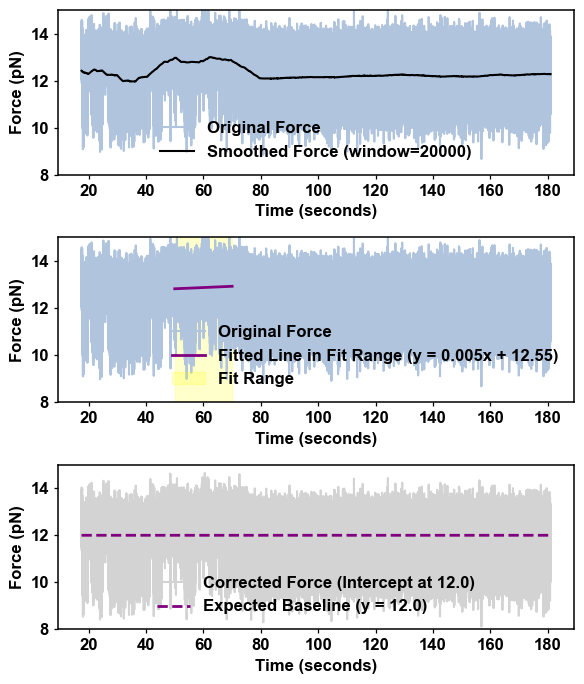

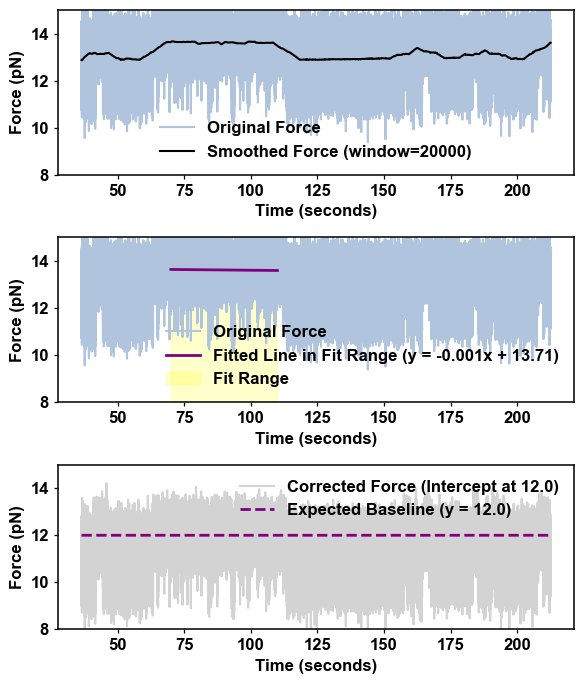

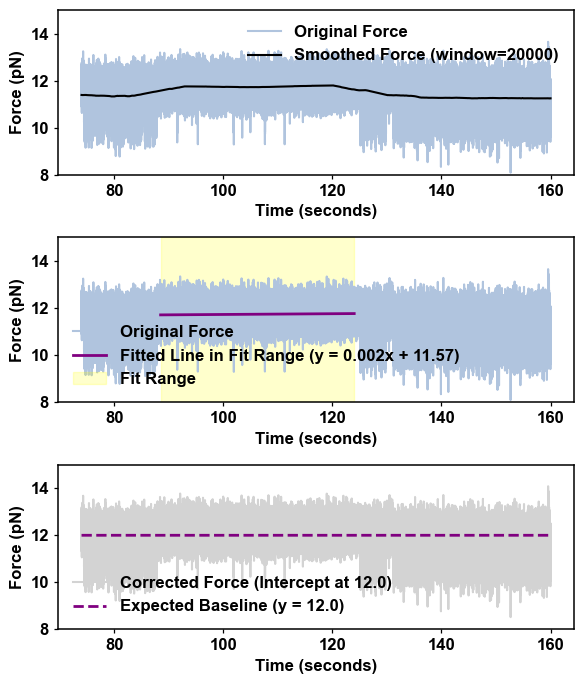

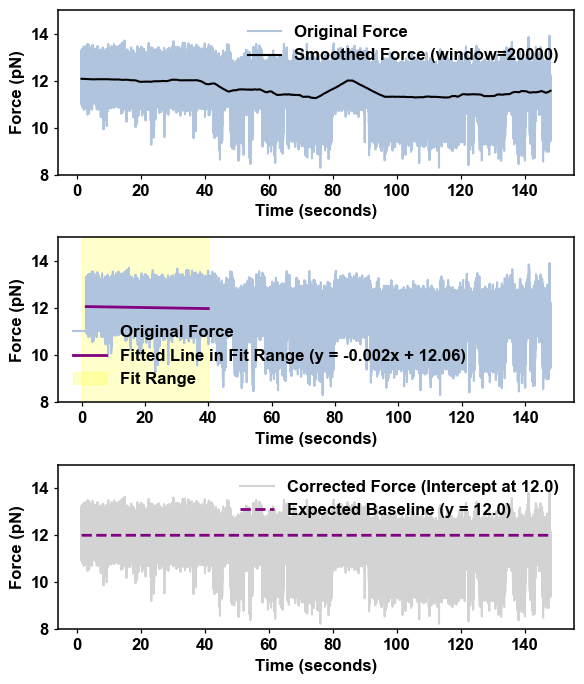

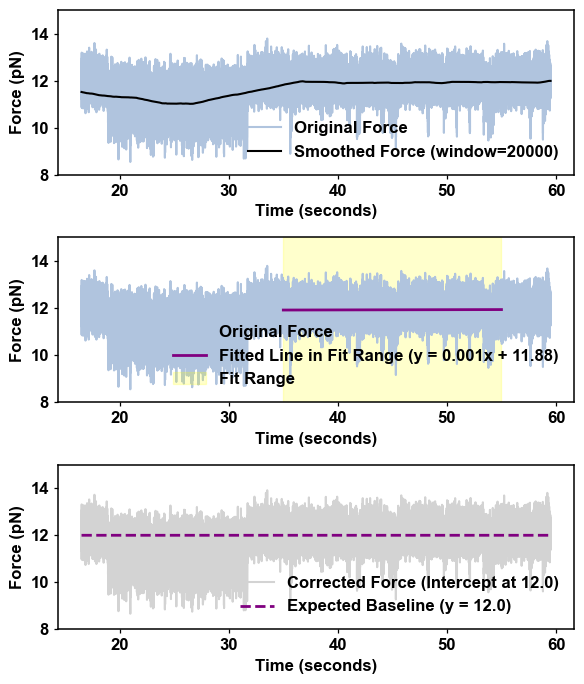

In [ ]:
pc1 = pd.read_csv('/PDGFRA/Cterm/171024N82.csv')
pc2 = pd.read_csv('/PDGFRA/Cterm/171024N86.csv')
pc3 = pd.read_csv('/PDGFRA/Cterm/200824N173.csv')
pc4 = pd.read_csv('/PDGFRA/Cterm/200824N175.csv')
pc5 = pd.read_csv('/PDGFRA/Cterm/200824N177.csv')

pc1c = smooth_and_shift_trace(pc1, start_time=50, end_time=70, window_size=20000, target_intercept=12.00)
pc2c = smooth_and_shift_trace(pc2, start_time=70, end_time=110, window_size=20000, target_intercept=12.00)
pc3c = smooth_and_shift_trace(pc3, start_time=88.5, end_time=124, window_size=20000, target_intercept=12.00)
pc4c = smooth_and_shift_trace(pc4, start_time=0, end_time=40, window_size=20000, target_intercept=12.00)
pc5c = smooth_and_shift_trace(pc5, start_time=35, end_time=55, window_size=20000, target_intercept=12.00)

In [ ]:
pc1_bp = pd.read_csv('/bp/PDGFRA_C_bp_converted_2khz/fixed/171024N82.csv')
pc2_bp = pd.read_csv('/bp/PDGFRA_C_bp_converted_2khz/fixed/171024N86.csv')
pc3_bp = pd.read_csv('/bp/PDGFRA_C_bp_converted_2khz/fixed/200824N173.csv')
pc4_bp = pd.read_csv('/bp/PDGFRA_C_bp_converted_2khz/fixed/200824N177.csv')

##### N-term CTCF DeltaN

In [ ]:
pdn1 = pd.read_csv('/PDGFRA/Nterm_deltaN/241022N62.csv')
pdn2 = pd.read_csv('/PDGFRA/Nterm_deltaN/241022N99.csv')
pdn3 = pd.read_csv('/PDGFRA/Nterm_deltaN/241022N113.csv')
pdn4 = pd.read_csv('/PDGFRA/Nterm_deltaN/241022N127.csv')
pdn5 = pd.read_csv('/PDGFRA/Nterm_deltaN/241022N151.csv')

##### C-term CTCF Nucleosome

In [ ]:
n1 = pd.read_csv('/PDGFRA/Cterm_Nuc/110924N322.csv')
n2 = pd.read_csv('/PDGFRA/Cterm_Nuc/110924N328.csv')
n3 = pd.read_csv('/PDGFRA/Cterm_Nuc/110924N328_2.csv')
n4 = pd.read_csv('/PDGFRA/Cterm_Nuc/110924N330.csv')
n5 = pd.read_csv('/PDGFRA/Cterm_Nuc/110924N337.csv')
n6 = pd.read_csv('/PDGFRA/Cterm_Nuc/110924N339.csv')
n7 = pd.read_csv('/PDGFRA/Cterm_Nuc/110924N341.csv')
n8 = pd.read_csv('/PDGFRA/Cterm_Nuc/110924N343.csv')
n9 = pd.read_csv('/PDGFRA/Cterm_Nuc/110924N360.csv')

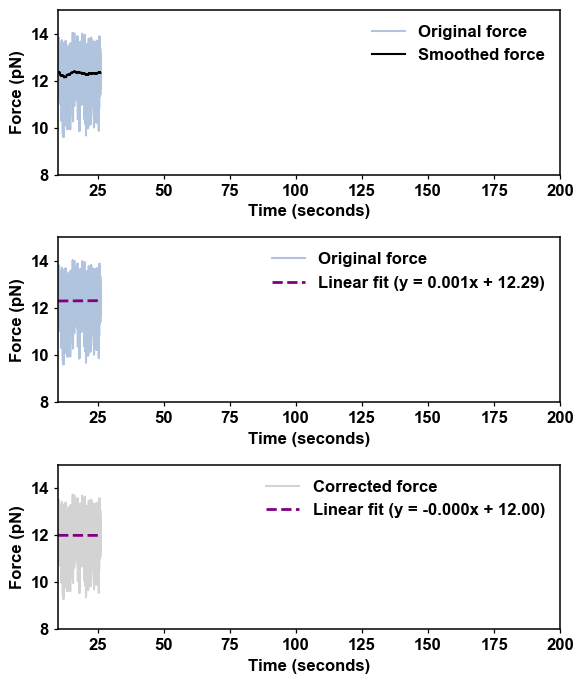

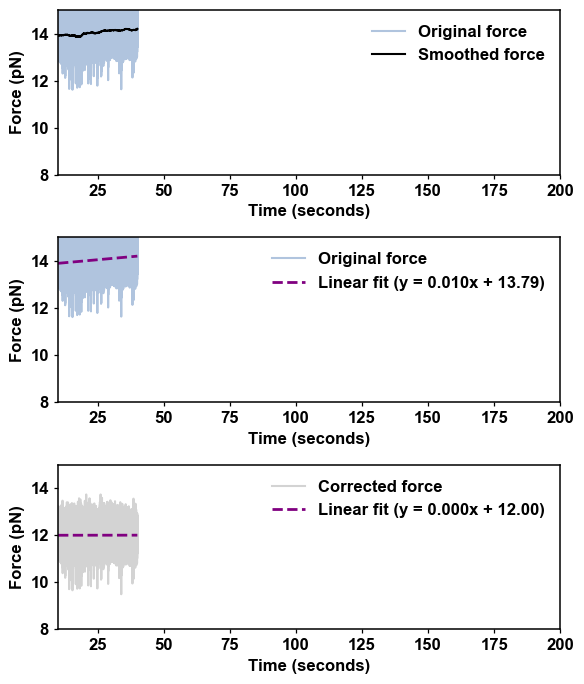

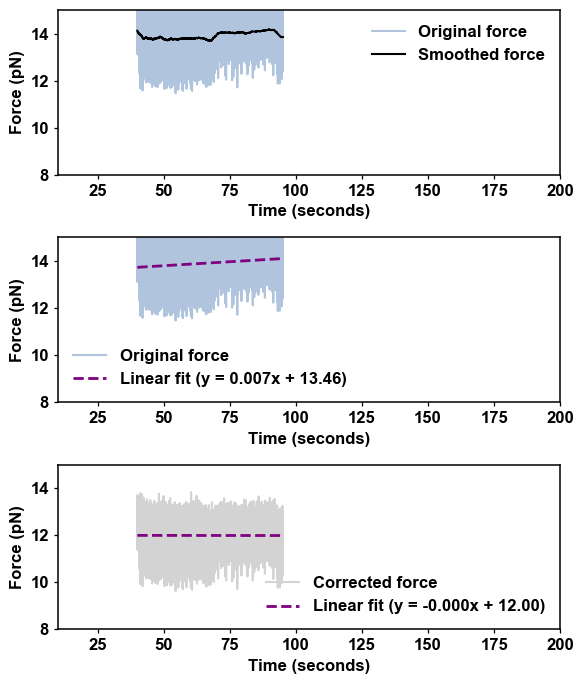

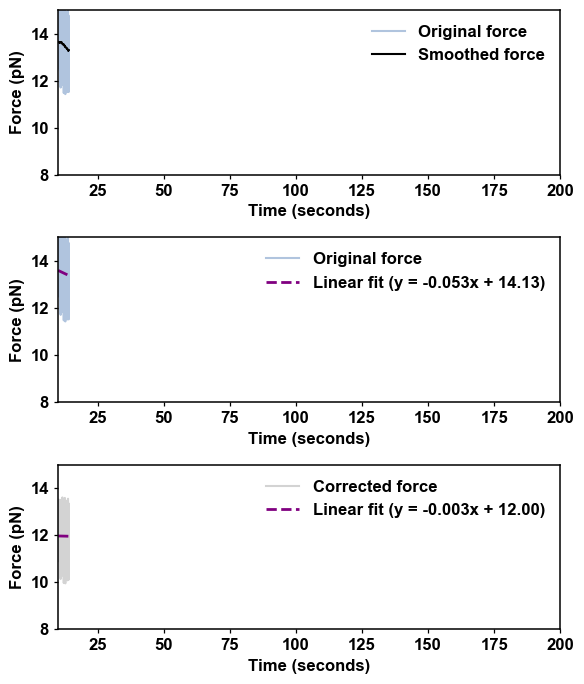

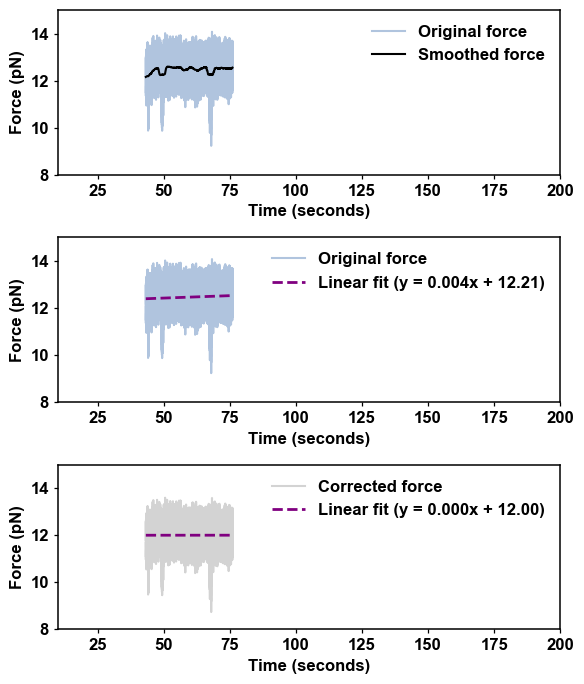

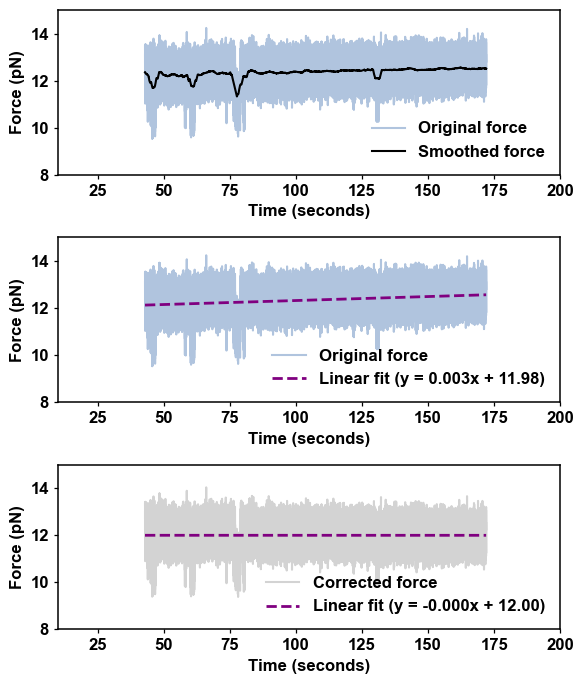

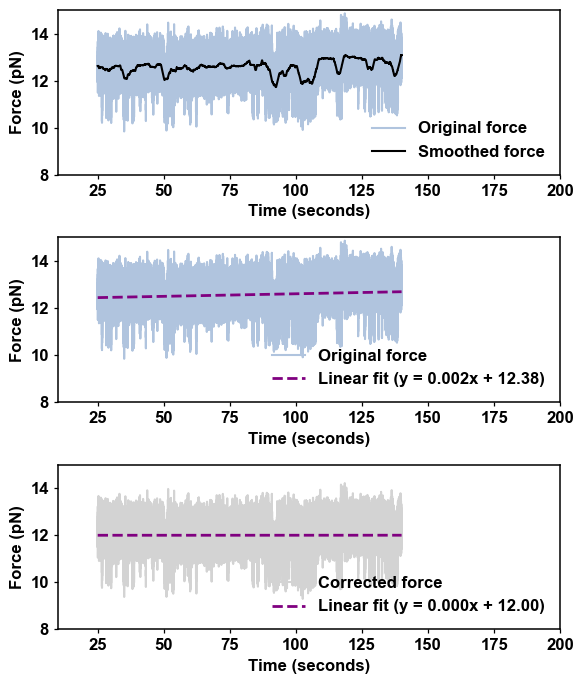

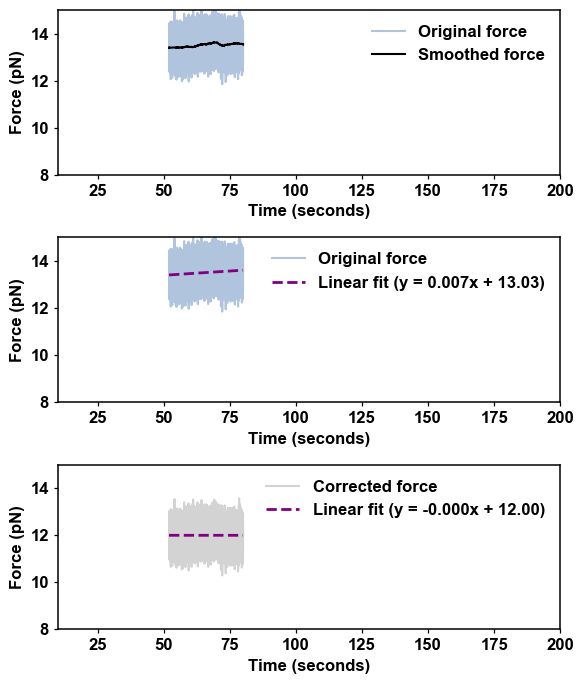

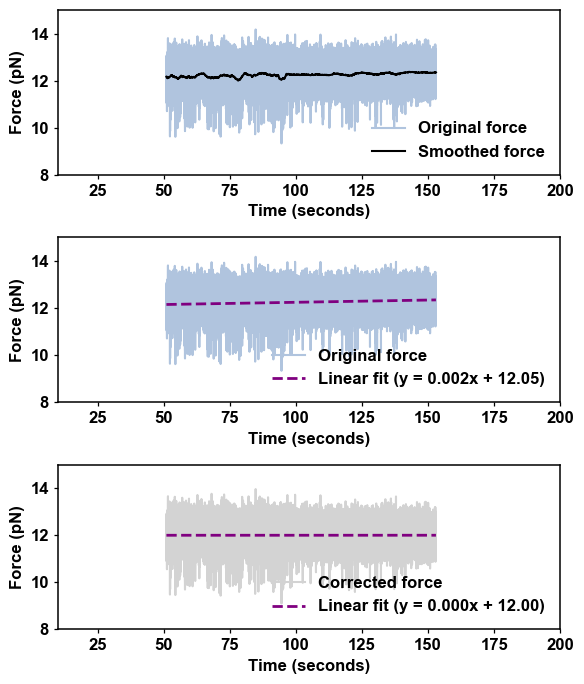

In [76]:
n1c = linear_correction(n1)
n2c = linear_correction(n2)
n3c = linear_correction(n3)
n4c = linear_correction(n4)
n5c = linear_correction(n5)
n6c = linear_correction(n6)
n7c = linear_correction(n7)
n8c = linear_correction(n8)
n9c = linear_correction(n9)

In [ ]:
n6_bp = pd.read_csv('/bp/PDGFRA_C_Nuc_bp_converted_2khz/fixed/110924N339.csv')
n6_bp_pb = pd.read_csv('/bp/PDGFRA_C_Nuc_bp_converted_2khz/fixed/110924N339_prebinding.csv')

In [ ]:
n1_pb = pd.read_csv('/PDGFRA/Cterm_Nuc/Naked/110924N322.csv')
n2_pb = pd.read_csv('/PDGFRA/Cterm_Nuc/Naked/110924N328.csv')
n4_pb = pd.read_csv('/PDGFRA/Cterm_Nuc/Naked/110924N330.csv')

##### Methylated N-term CTCF WT

In [ ]:
m1 = pd.read_csv('/Methylation/030924N52.csv')
m2 = pd.read_csv('/Methylation/030924N121.csv')
m3 = pd.read_csv('/Methylation/030924N123.csv')
m4 = pd.read_csv('/Methylation/030924N125.csv')
m5 = pd.read_csv('/Methylation/241212N32.csv')
m6 = pd.read_csv('/Methylation/241212N75.csv')
m7 = pd.read_csv('/Methylation/241212N28.csv')

##### N-term CTCF WT w/ PDS5a

In [ ]:
p5_1 = pd.read_csv('/PDGFRA/N_term_PDS5A/250416N116.csv')
p5_2 = pd.read_csv('/PDGFRA/N_term_PDS5A/250416N118.csv')
p5_3 = pd.read_csv('/PDGFRA/N_term_PDS5A/250416N128.csv')
p5_4 = pd.read_csv('/PDGFRA/N_term_PDS5A/250416N143.csv')
p5_5 = pd.read_csv('/PDGFRA/N_term_PDS5A/250416N147.csv')
p5_6 = pd.read_csv('/PDGFRA/N_term_PDS5A/250416N149.csv')
p5_7 = pd.read_csv('/PDGFRA/N_term_PDS5A/250416N151.csv')
p5_8 = pd.read_csv('/PDGFRA/N_term_PDS5A/250416N153.csv')

In [ ]:
p5_1_bp = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/fixed_intercept/160425N116.csv')
p5_4_bp = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/fixed_intercept/160425N143.csv')
p5_5_bp = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/fixed_intercept/160425N147.csv')
p5_6_bp = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/fixed_intercept/160425N149.csv')
p5_7_bp = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/fixed_intercept/160425N151.csv')
p5_8_bp = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/fixed_intercept/160425N153.csv')

In [ ]:
p5_1_bp_raw = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/raw/eqData160425N116.csv')
p5_4_bp_raw = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/raw/eqData160425N143.csv')
p5_5_bp_raw = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/raw/eqData160425N147.csv')
p5_6_bp_raw = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/raw/eqData160425N149.csv')
p5_7_bp_raw = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/raw/eqData160425N151.csv')
p5_8_bp_raw = pd.read_csv('/bp/PDGFRA_N_pds5a_bp_converted_2khz/raw/eqData160425N153.csv')

##### N-term CTCF WT w/ Cohesin

In [ ]:
oc_1 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250604N53.csv')
oc_2 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250604N64.csv')
oc_3 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250604N92.csv')
oc_4 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250604N94.csv')
oc_5 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250604N101.csv')
oc_6 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250604N125.csv')
oc_7 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250604N167.csv')
oc_8 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N20.csv')
oc_9 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N22.csv')
oc_10 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N30_1.csv')
oc_11 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N30_2.csv')
oc_12 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N32.csv')
oc_13 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N40.csv')
oc_14 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N41.csv')
oc_15 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N42.csv')
oc_16 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N43.csv')
oc_17 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N45.csv')
oc_18 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N46.csv')
oc_19 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N50.csv')
oc_20 = pd.read_csv('/PDGFRA/Nterm_Cohesin/250701N52.csv')

In [ ]:
oc1_bp = pd.read_csv('/bp/PDGFRA_N_cohesin_bp_converted_2khz/fixed_intercept/040625N53.csv')
oc3_bp = pd.read_csv('/bp/PDGFRA_N_cohesin_bp_converted_2khz/fixed_intercept/040625N92.csv')
oc4_bp = pd.read_csv('/bp/PDGFRA_N_cohesin_bp_converted_2khz/fixed_intercept/040625N94.csv')
oc5_bp = pd.read_csv('/bp/PDGFRA_N_cohesin_bp_converted_2khz/fixed_intercept/040625N101.csv')
oc6_bp = pd.read_csv('/bp/PDGFRA_N_cohesin_bp_converted_2khz/fixed_intercept/040625N125.csv')

In [ ]:
oc1_bp_raw = pd.read_csv('/bp/PDGFRA_N_cohesin_bp_converted_2khz/raw/eqData040625N53.csv')
oc2_bp_raw = pd.read_csv('/bp/PDGFRA_N_cohesin_bp_converted_2khz/raw/eqData040625N92.csv')
oc3_bp_raw = pd.read_csv('/bp/PDGFRA_N_cohesin_bp_converted_2khz/raw/eqData040625N94.csv')
oc4_bp_raw = pd.read_csv('/bp/PDGFRA_N_cohesin_bp_converted_2khz/raw/eqData040625N101.csv')
oc5_bp_raw = pd.read_csv('/bp/PDGFRA_N_cohesin_bp_converted_2khz/raw/eqData040625N125.csv')

##### N-term CTCF WT w/ Cohesin & PDS5A

In [ ]:
pc_1 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250604N186.csv')
pc_2 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250604N204.csv')
pc_3 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250604N215.csv')
pc_4 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250604N235.csv')
pc_5 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250604N236.csv')
pc_6 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250604N240.csv')
pc_7 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N8.csv')
pc_8 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N15.csv')
pc_9 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N16_dyn.csv')
pc_10 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N17.csv')
pc_11 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N18.csv')
pc_12 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N26.csv')
pc_13 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N32.csv')
pc_14 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N35.csv')
pc_15 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N36.csv')
pc_16 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N38.csv')
pc_17 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N47.csv')
pc_18 = pd.read_csv('/PDGFRA/Nterm_Cohesin_PDS5A/250702N54.csv')

In [ ]:

pc_4_bp = pd.read_csv('/bp/PDGFRA_N_cohesin_pds5a_converted_2khz/fixed_intercept/040625N235.csv')
pc_6_bp = pd.read_csv('/bp/PDGFRA_N_cohesin_pds5a_converted_2khz/fixed_intercept/040625N240.csv')
pc_11_bp = pd.read_csv('/bp/PDGFRA_N_cohesin_pds5a_converted_2khz/fixed_intercept/020725N18.csv')

pc_13_bp = pd.read_csv('/bp/PDGFRA_N_cohesin_pds5a_converted_2khz/fixed_intercept/020725N32.csv')
pc_14_bp = pd.read_csv('/bp/PDGFRA_N_cohesin_pds5a_converted_2khz/fixed_intercept/020725N35.csv')

In [ ]:
pc_4_bp_raw = pd.read_csv('/bp/PDGFRA_N_cohesin_pds5a_converted_2khz/raw/eqData040625N235.csv')
pc_6_bp_raw = pd.read_csv('/bp/PDGFRA_N_cohesin_pds5a_converted_2khz/raw/eqData040625N240.csv')
pc_11_bp_raw = pd.read_csv('/bp/PDGFRA_N_cohesin_pds5a_converted_2khz/raw/eqData020725N18.csv')
pc_13_bp_raw = pd.read_csv('/bp/PDGFRA_N_cohesin_pds5a_converted_2khz/raw/eqData020725N32.csv')
pc_14_bp_raw = pd.read_csv('/bp/PDGFRA_N_cohesin_pds5a_converted_2khz/raw/eqData020725N35.csv')

#### Consensus

In [ ]:
c1 = pd.read_csv('/Consensus/240701N22.csv')
c2 = pd.read_csv('/Consensus/240701N38.csv')
c3 = pd.read_csv('/Consensus/240701N39.csv')
c5 = pd.read_csv('/Consensus/241212N28.csv')
c7 = pd.read_csv('/Consensus/241217N26.csv')
c8 = pd.read_csv('/Consensus/241217N29.csv')
c9 = pd.read_csv('/Consensus/241217N33.csv')
c10 = pd.read_csv('/Consensus/241217N35.csv')
c11 = pd.read_csv('/Consensus/241217N39.csv')

## Analysis

### PDGFRA N-term

#### Naked DNA

##### DNA

Model loaded from final_models/pdgfra_nterm_naked_2_model.pkl
Fraction of time spent in each state: {'State 0': 3.6021701028602022, 'State 1': -2.6021701028602022}


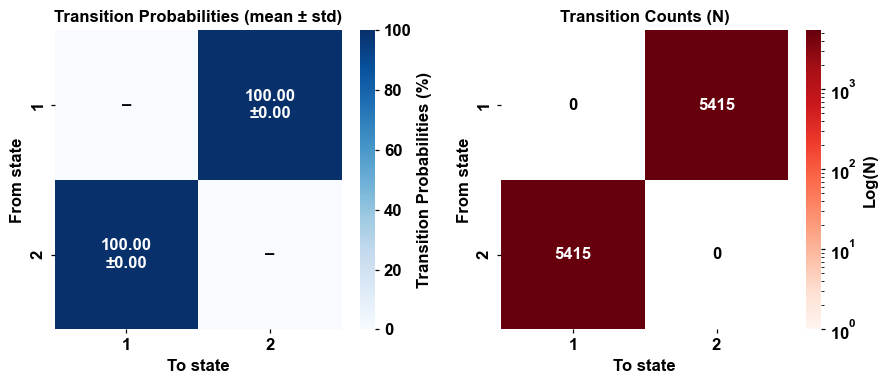

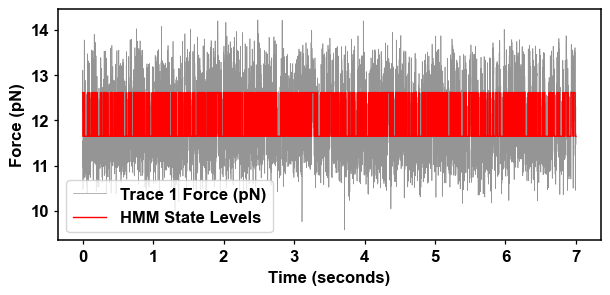

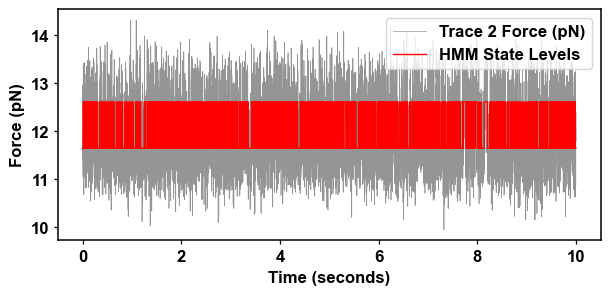

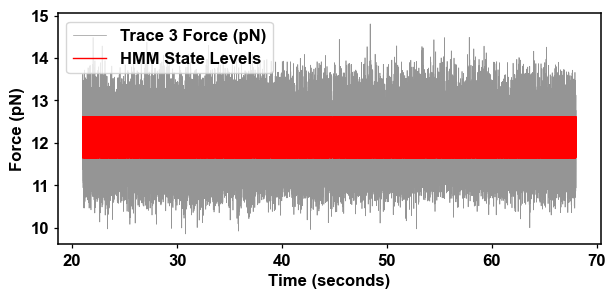

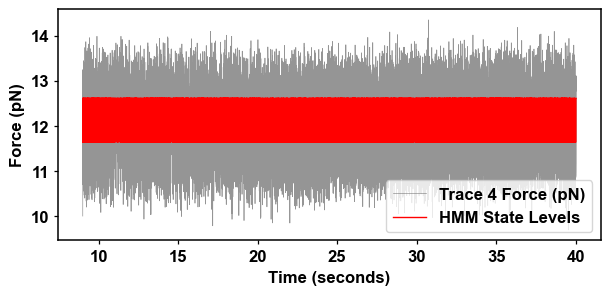

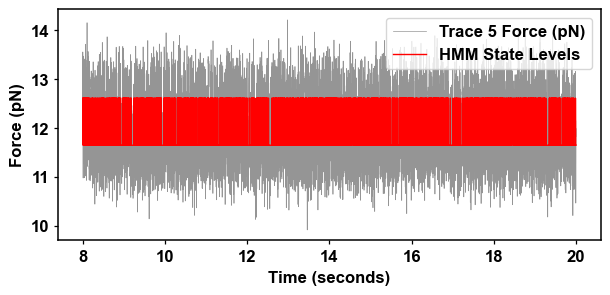

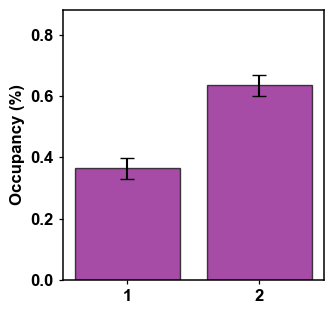

Mean fraction of time spent in each state: [0.3646394 0.6353606]
Standard deviation of time spent in each state: [0.0342989 0.0342989]


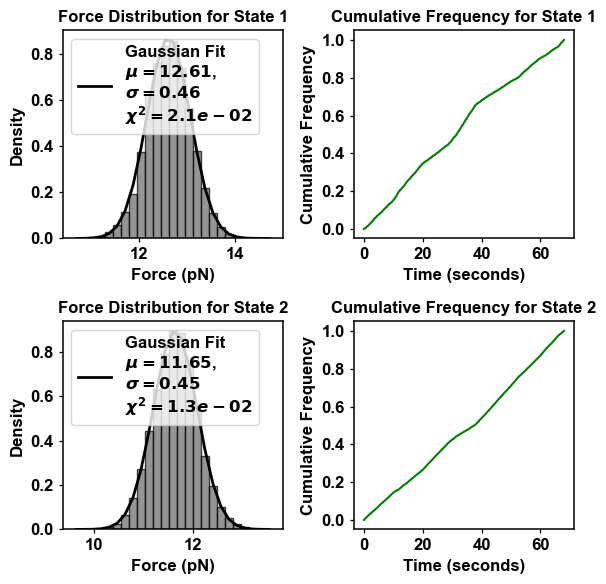

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_50145/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


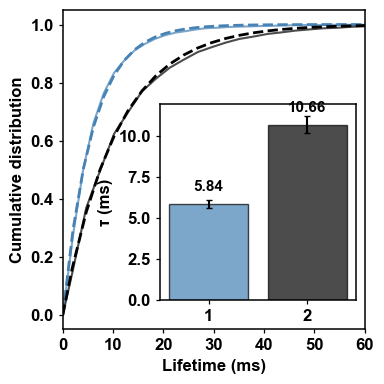

taus =  [5.837719989577545, 10.66116989657579]
tau errors =  [0.2647914397325475, 0.5056180628570326]


/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_50145/15994659.py:34: RuntimeWarning: Mean of empty slice.
  state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])
/Users/emily/anaconda3/envs/gpu_tracking/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_50145/15994659.py:73: RuntimeWarning: Mean of empty slice
  mean_probs = np.nanmean(per_trace_probs, axis=0)
/Users/emily/anaconda3/envs/gpu_tracking/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


In [ ]:
dna_traces = [dna1, dna2, dna3, dna4, dna5]
dna_hmm_result = HMM_predict_force(dna_traces, "final_models/pdgfra_nterm_naked_dna_2_model.pkl")
dna_sorted_hs = plot_transition_and_HMM_force(dna_hmm_result, dna_traces, 2, '/publication.pdf')
dna_forcedf = plot_force_statistics(2, dna_sorted_hs[0], dna_hmm_result)
dna_results = plot_cdf_lifetime(2, dna_sorted_hs[0], dna_hmm_result, 0, 60,  '/publication.pdf')
dna_tp_results = compute_transition_probabilities_stats(dna_hmm_result, dna_traces, n_components=4, as_percent=False)

Model loaded from final_models/pdgfra_nucleosome_prebinding_cterm_ctcfwt_2_model.pkl
Fraction of time spent in each state: {'State 0': 0.5352423004049804, 'State 1': 0.46475769959501967}


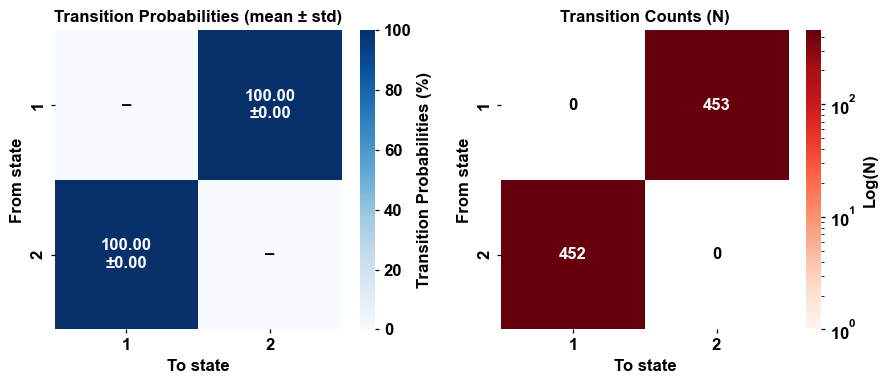

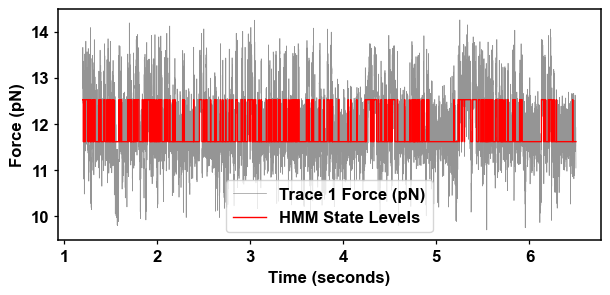

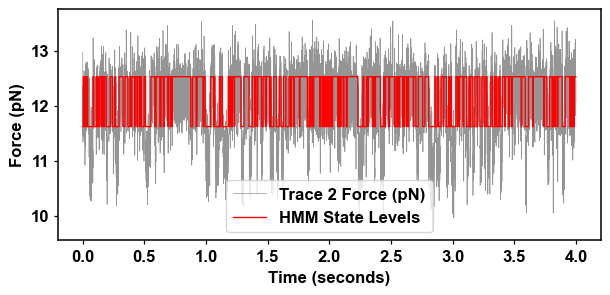

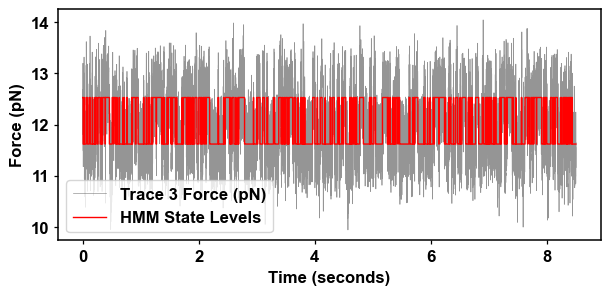

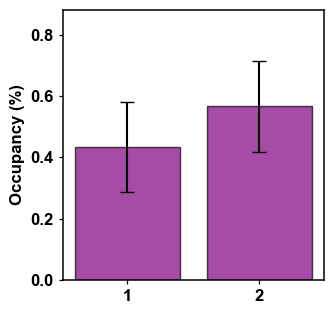

Mean fraction of time spent in each state: [0.43354675 0.56645325]
Standard deviation of time spent in each state: [0.14803756 0.14803756]


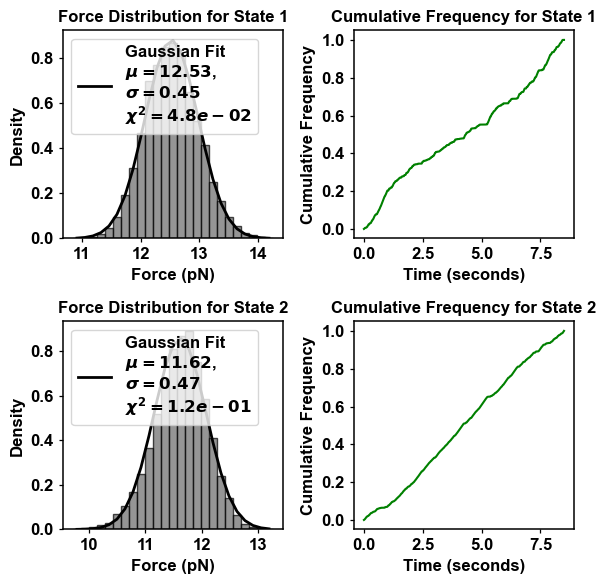

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_50145/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


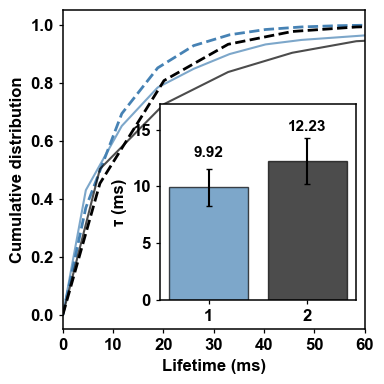

taus =  [9.91939690497236, 12.228106115453723]
tau errors =  [1.6570335778204535, 2.0148417498484146]


/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_50145/15994659.py:34: RuntimeWarning: Mean of empty slice.
  state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])
/Users/emily/anaconda3/envs/gpu_tracking/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_50145/15994659.py:73: RuntimeWarning: Mean of empty slice
  mean_probs = np.nanmean(per_trace_probs, axis=0)
/Users/emily/anaconda3/envs/gpu_tracking/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


In [ ]:
dnan_traces = [n1_pb, n2_pb, n4_pb]
dnan_hmm_result = HMM_predict_force(dnan_traces, "final_models/pdgfra_nucleosome_prebinding_cterm_ctcfwt_2_model.pkl")
dnan_sorted_hs = plot_transition_and_HMM_force(dnan_hmm_result, dnan_traces, 2, '/publication.pdf')
dnan_forcedf = plot_force_statistics(2, dnan_sorted_hs[0], dnan_hmm_result)
dnan_results = plot_cdf_lifetime(2, dnan_sorted_hs[0], dnan_hmm_result, 0, 60,  '/publication.pdf')
dnan_tp_results = compute_transition_probabilities_stats(dnan_hmm_result, dnan_traces, n_components=4, as_percent=False)

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/2041128995.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = copy(cm.get_cmap(cmap))


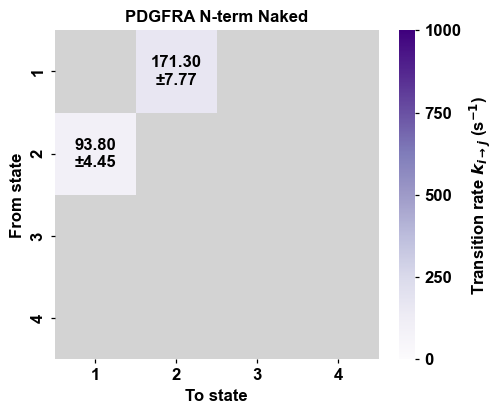

In [ ]:
# If all 4 states fit in the CDF step (taus for all states), just call:
k_mean, k_std = plot_transition_rates_with_errors(
    tp_stats=dna_tp_results,
    cdf_results=dna_results,
    n_components=4,
    state_indices=None,  # or omit
    savepath="/publication.pdf",
    title = 'PDGFRA N-term Naked',
    cmap="Purples"
)


In [359]:
total_time_sec = total_recorded_time([dna1, dna2, dna3, dna4, dna5])
print(f"Total recorded time: {total_time_sec:.2f} seconds")
print(f"Which is {total_time_sec/60:.2f} minutes")
print('----')
calculate_transitions_to_states(dna_hmm_result, 2)

Total recorded time: 107.00 seconds
Which is 1.78 minutes
----
Total number of transitions between states (excluding self-transitions): 14207
Transitions to each state:
State 1: To = 7103
State 2: To = 7104


(14207, {0: 7103, 1: 7104})

##### Comparison (Fig. S2)

Model loaded from final_models/pdgfra_nterm_naked_uncorrected_2_model.pkl
Fraction of time spent in each state: {'State 0': 0.5066816254614017, 'State 1': 0.49331837453859834}


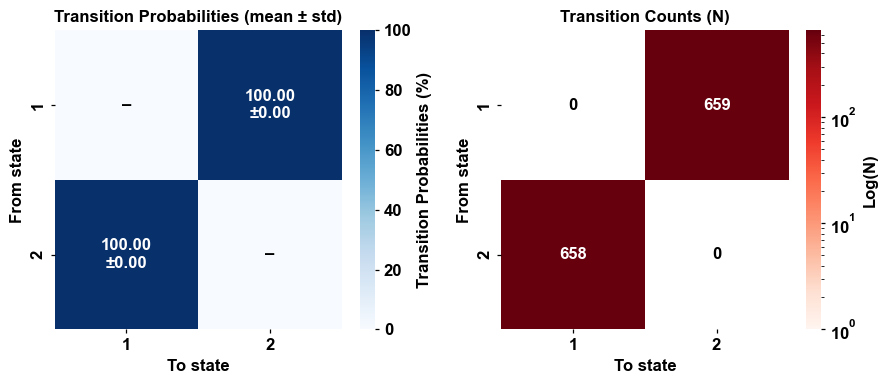

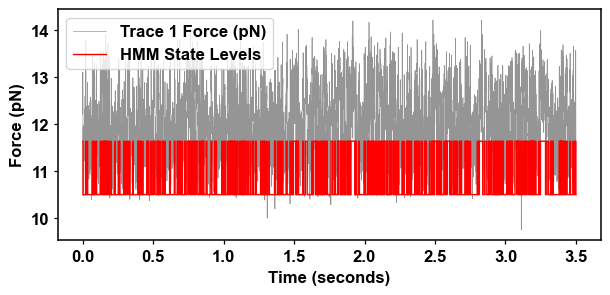

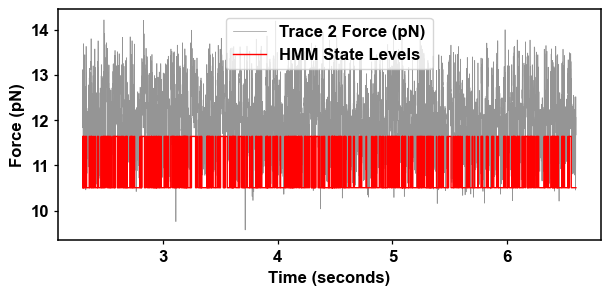

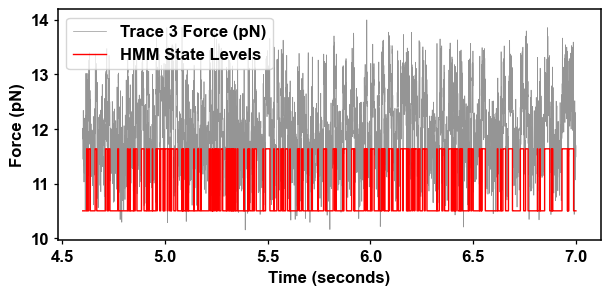

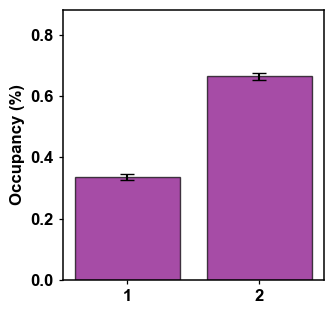

Mean fraction of time spent in each state: [0.33608482 0.66391518]
Standard deviation of time spent in each state: [0.01087952 0.01087952]


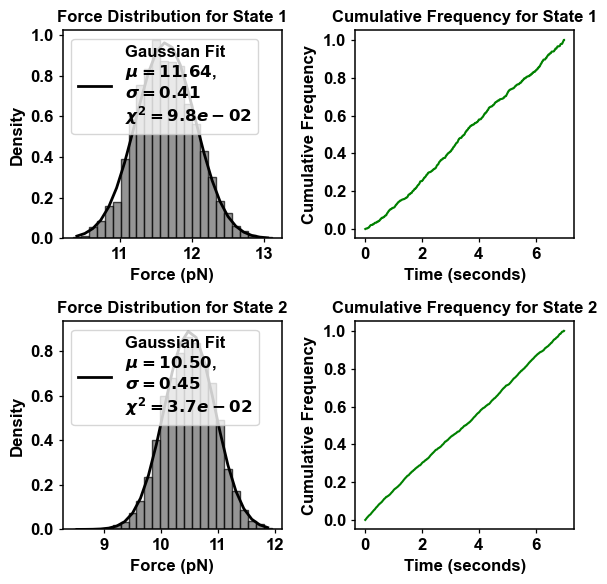

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_50145/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


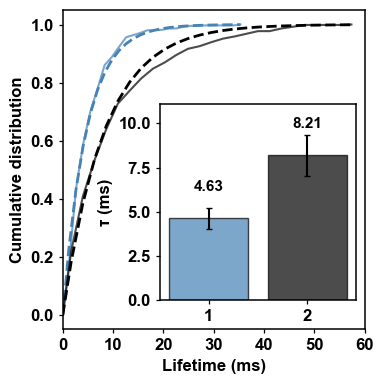

taus =  [4.632843512440937, 8.209960887714134]
tau errors =  [0.6006841773182782, 1.1573483296842149]


In [ ]:
dna_traces = [dna[dna['time (seconds)'] < 3.5], dna[(dna['time (seconds)'] > 2.3) & (dna['time (seconds)'] < 6.6)], dna[dna['time (seconds)'] > 4.6]]
dna_hmm_result = HMM_predict_force_raw(dna_traces, "final_models/pdgfra_nterm_naked_uncorrected_2_model.pkl")
dna_sorted_hs = plot_transition_and_HMM_force(dna_hmm_result, dna_traces, 2, '/publication.pdf')
dna_forcedf = plot_force_statistics(2, dna_sorted_hs[0], dna_hmm_result)
dna_results = plot_cdf_lifetime(2, dna_sorted_hs[0], dna_hmm_result, 0, 60,  '/publication.pdf')

Model loaded from final_models/pdgfra_nterm_ctcf_uncorrected_2_model.pkl
Fraction of time spent in each state: {'State 0': 0.04010450560853128, 'State 1': 0.16965141341538595, 'State 2': 0.733368731204327, 'State 3': 0.05687534977175579}


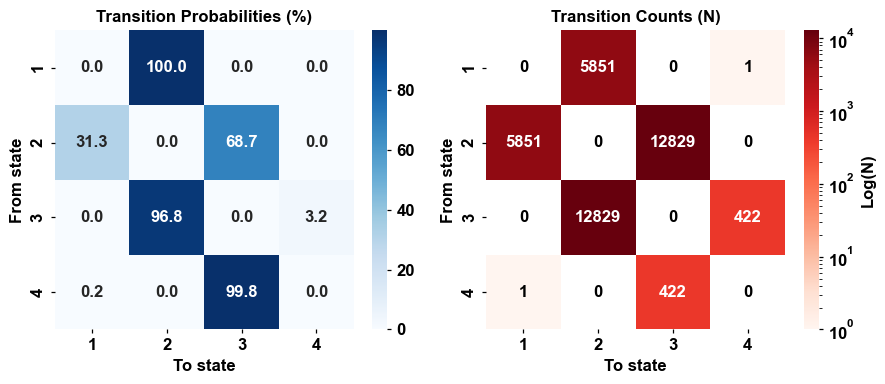

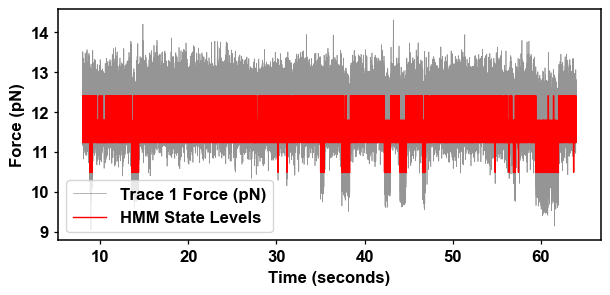

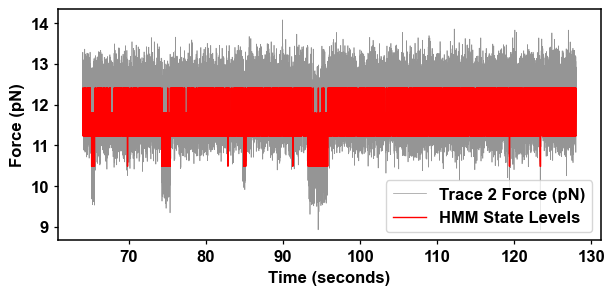

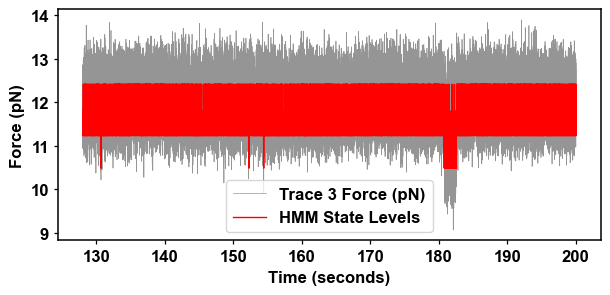

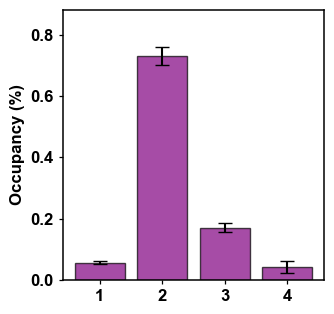

Mean fraction of time spent in each state: [0.05654778 0.73055559 0.17065959 0.04223704]
Standard deviation of time spent in each state: [0.00518276 0.02872002 0.01504674 0.02090606]


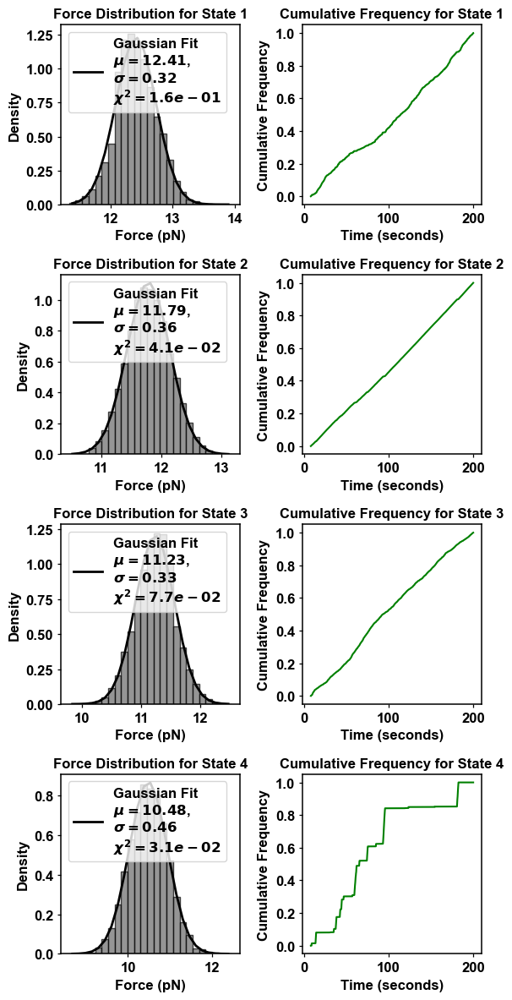

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_1074/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


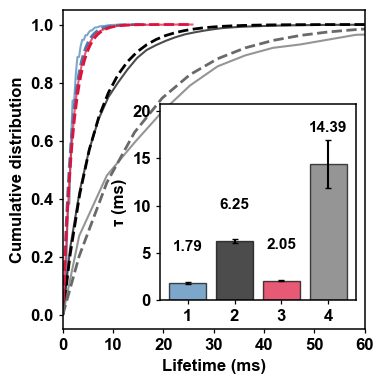

taus =  [1.7922729862479498, 6.251212987505159, 2.054698295539616, 14.387038077464235]
tau errors =  [0.0726142690481897, 0.16153216904069198, 0.05856905602960411, 2.5544900076427357]


In [ ]:
ctcf_traces = [ctcf[ctcf['time (seconds)'] < 64], ctcf[(ctcf['time (seconds)'] > 64) & (ctcf['time (seconds)'] < 128)], ctcf[ctcf['time (seconds)'] > 128]]
ctcf_hmm_result = HMM_predict_force_raw(ctcf_traces, "final_models/pdgfra_nterm_ctcf_uncorrected_2_model.pkl")
ctcf_sorted_hs = plot_transition_and_HMM_force(ctcf_hmm_result, ctcf_traces, 4, '/publication.pdf')
ctcf_forcedf = plot_force_statistics(4, ctcf_sorted_hs[0], ctcf_hmm_result)
ctcf_results = plot_cdf_lifetime(4, ctcf_sorted_hs[0], ctcf_hmm_result, 0, 60,  '/publication.pdf')

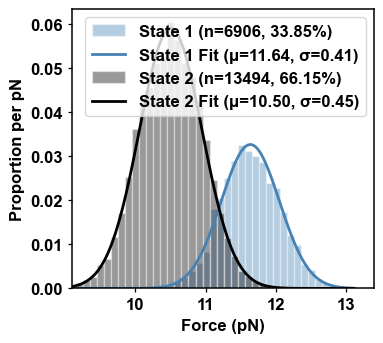

In [ ]:
plot_rolling_force_distribution_raw(dna_hmm_result, dna_traces, 2, window_size=1, savepath='/publication.pdf')

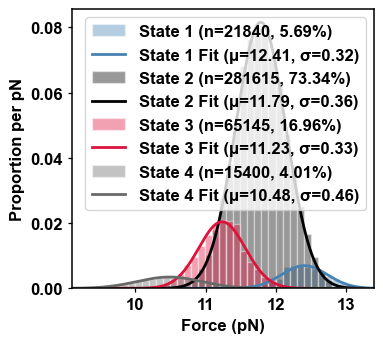

In [ ]:
plot_rolling_force_distribution_raw(ctcf_hmm_result, ctcf_traces, 4, window_size=1, savepath='/publication.pdf')

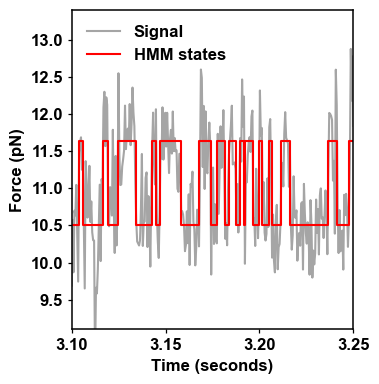

In [ ]:
plot_single_trace_HMM_step_raw(dna_hmm_result, dna, 2, '/publication.pdf', xmin=3.10, xmax=3.25)

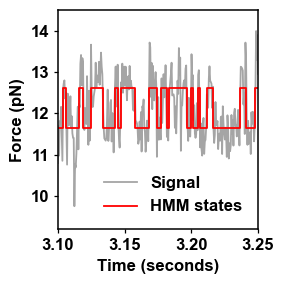

In [ ]:
plot_single_trace_HMM_step(dna_hmm_result, dna1, 2, '/publication.pdf', xmin=3.10, xmax=3.25)

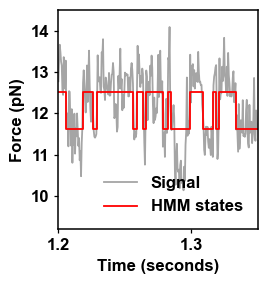

In [ ]:
plot_single_trace_HMM_step(dnan_hmm_result, n1_pb, 2, '/publication.pdf', xmin=1.20, xmax=1.35)

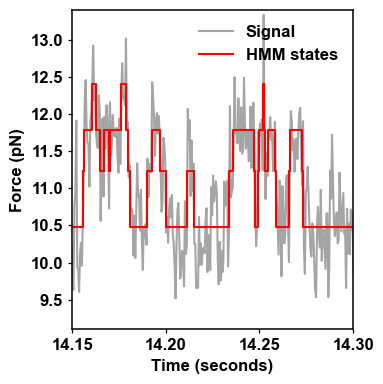

In [ ]:
plot_single_trace_HMM_step_raw(ctcf_hmm_result, ctcf, 4, '/publication.pdf', xmin=14.15, xmax=14.30)

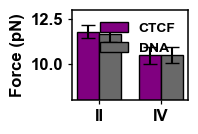

In [ ]:
# Data
states = ['II', 'IV']
cond1 = [11.79, 10.48]
cond1_std = [0.36, 0.46]
cond2 = [11.64, 10.50]
cond2_std = [0.41, 0.45]

# Number of groups and bar width
x = np.arange(len(states))
bar_width = 0.35

# Plotting
fig, ax = plt.subplots(figsize=(2, 1.5))
bars1 = ax.bar(x - bar_width/2, cond1, bar_width, yerr=cond1_std, label='CTCF', capsize=5, color='purple', edgecolor='black')
bars2 = ax.bar(x + bar_width/2, cond2, bar_width, yerr=cond2_std, label='DNA', capsize=5, color='dimgrey', edgecolor='black')

# Labels and Title
#ax.set_xlabel('State')
ax.set_ylabel('Force (pN)')
#ax.set_title('Comparison of Conditions by State')
ax.set_xticks(x)
ax.set_xticklabels(states)
#ax.legend()#

# Display
plt.ylim(8,13)
plt.tight_layout()
plt.legend(frameon=False, fontsize=10, loc='upper right')
plt.savefig('/publication.pdf', format='pdf')
plt.show()


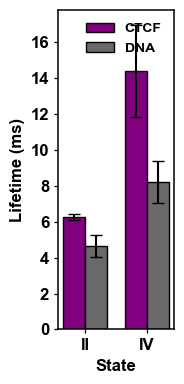

In [ ]:
# Data
states = ['II', 'IV']
ptaus =  [6.251212987505159, 14.387038077464235]
ptau_errors =  [0.16153216904069198, 2.5544900076427357]
dtaus =  [4.632843512440937, 8.209960887714134]
dtau_errors =  [0.6006841773182782, 1.1573483296842149]

# Number of groups and bar width
x = np.arange(len(states))
bar_width = 0.35

# Plotting
fig, ax = plt.subplots(figsize=(2, 4))
bars1 = ax.bar(x - bar_width/2, ptaus, bar_width, yerr=ptau_errors, label='CTCF', capsize=4, color='purple', edgecolor='black')
bars2 = ax.bar(x + bar_width/2, dtaus, bar_width, yerr=dtau_errors, label='DNA', capsize=4, color='dimgrey', edgecolor='black')

# Labels and Title
ax.set_xlabel('State')
ax.set_ylabel('Lifetime (ms)')
#ax.set_title('Tau Values by State and Condition')
ax.set_xticks(x)
ax.set_xticklabels(states)
#ax.legend(frameon=False)

# Display
plt.tight_layout()
plt.legend(frameon=False, fontsize=10, loc='upper right')
plt.savefig('/publication.pdf', format='pdf')
plt.show()


#### CTCF WT

##### Force

Model loaded from final_models/pdgfra_nterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.09364425491906161, 'State 1': 0.6280318922094859, 'State 2': 1.06101973672284, 'State 3': -0.7826958838513876}


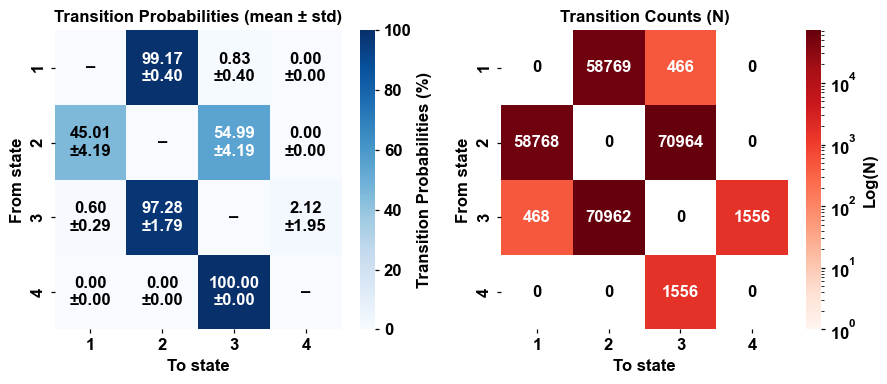


=== Per-trace occupancies (fractions) ===
           state_1  state_2  state_3  state_4
trace_001   0.1077   0.7677   0.0874   0.0373
trace_002   0.1438   0.7089   0.0981   0.0492
trace_003   0.0636   0.8392   0.0778   0.0194
trace_004   0.0628   0.8383   0.0854   0.0136
trace_005   0.1024   0.7489   0.1442   0.0045
trace_006   0.1034   0.7444   0.1520   0.0002
trace_007   0.1322   0.6955   0.1601   0.0122
trace_008   0.1158   0.7197   0.1622   0.0023
trace_009   0.0968   0.7593   0.1423   0.0016
trace_010   0.1001   0.7540   0.1456   0.0003

=== Occupancy (per state) ===
state  mean(frac)  SD_across_traces  boot_SD_of_mean  CI_lo  CI_hi
    1      0.1029             0.0243           0.0077  0.0876  0.1176
    2      0.7576             0.0460           0.0145  0.7310  0.7875
    3      0.1255             0.0322           0.0102  0.1050  0.1446
    4      0.0141             0.0160           0.0051  0.0050  0.0250


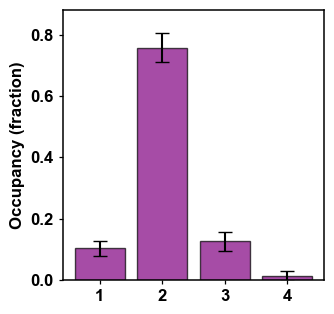


Mean fraction of time in each state: [0.10285608 0.75757775 0.12551483 0.01405134]
SD across traces:                    [0.02432818 0.04604561 0.0321958  0.01604383]
Bootstrap SD of the mean:            [0.00768137 0.01453609 0.01016937 0.00506517]
95% CI (percentile):               lo=[0.08757352 0.73100496 0.10501024 0.00504721], hi=[0.11761584 0.78747254 0.14464777 0.02502489]


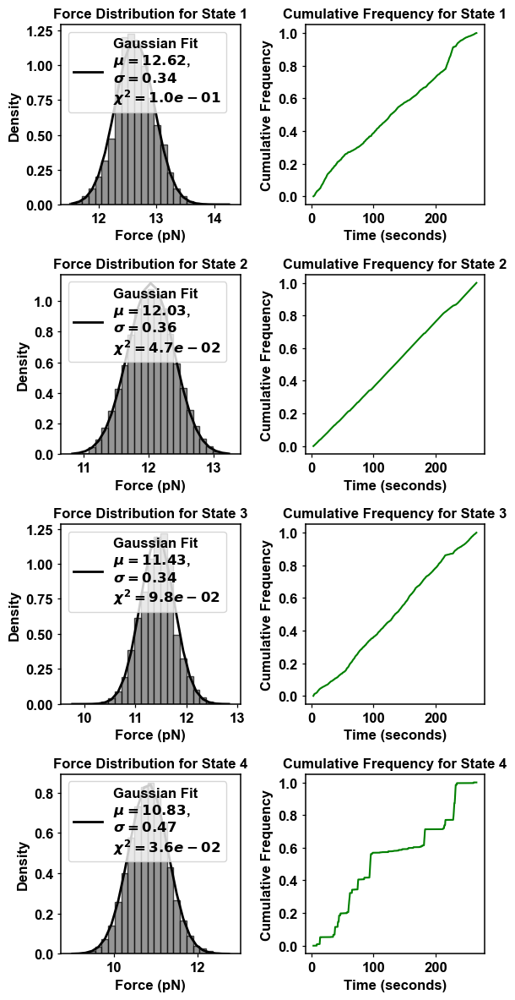

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_23386/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


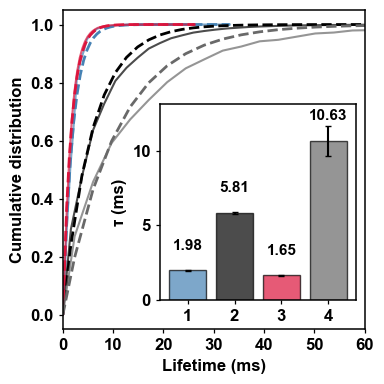

taus =  [1.978238880161093, 5.8078276186433415, 1.645513281359654, 10.626146579086067]
tau errors =  [0.026018014591260442, 0.05749418417453732, 0.019655020802294296, 0.999683507428523]


In [ ]:
p_traces = [p1, p2, p3, p4, p5, p6, p7, p8, p9, p10]
p_hmm_result = HMM_predict_force(p_traces, "final_models/pdgfra_nterm_ctcfwt_4_model.pkl")
p_sorted_hs = plot_transition_and_HMM_force(p_hmm_result, p_traces, 4, '/publication.pdf')
p_forcedf = plot_force_statistics(4, p_sorted_hs[0], p_hmm_result)
p_results = plot_cdf_lifetime(4, p_sorted_hs[0], p_hmm_result, 0, 60,  '/publication.pdf')
p_tp_results = compute_transition_probabilities_stats(p_hmm_result, p_traces, n_components=4, as_percent=False)

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/2041128995.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = copy(cm.get_cmap(cmap))


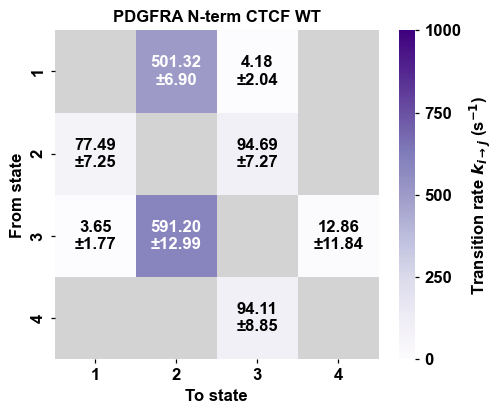

In [ ]:
# If all 4 states fit in the CDF step (taus for all states), just call:
k_mean, k_std = plot_transition_rates_with_errors(
    tp_stats=p_tp_results,
    cdf_results=p_results,
    n_components=4,
    state_indices=None,  # or omit
    savepath="/publication.pdf",
    title = 'PDGFRA N-term CTCF WT',
    cmap="Purples"
)


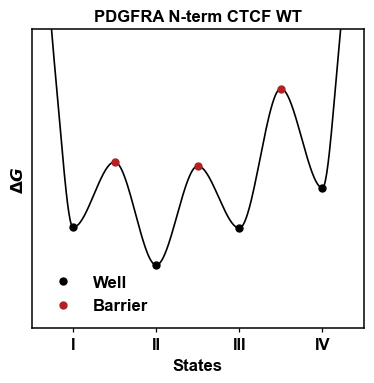

Using fixed Eyring ν = kBT/h = 6.212e+12 s^-1 at T=298.15 K
(Visualization only) constant barrier display shift applied: 20.000 kBT


In [ ]:
# lifetimes from HMM (uses self-transitions)
taus_ms = np.array(get_lifetime_taus(4, p_sorted_hs[0], p_hmm_result)['taus'])

# exit-conditioned branching
P_exit = p_tp_results[0]

# rates
rate_matrix = build_rate_matrix(P_exit, taus_ms)

# plot with automatic prefactor (keeps barriers above wells)
plot_energy_landscape_from_rates(
    rate_matrix,
    title='PDGFRA N-term CTCF WT',
    savepath="/publication.pdf",
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath="/publication.csv",
)


In [362]:
total_time_sec = total_recorded_time([p1, p2, p3, p4, p5, p6, p7, p8, p9, p10])
print(f"Total recorded time: {total_time_sec:.2f} seconds")
print(f"Which is {total_time_sec/60:.2f} minutes")
print('----')
calculate_transitions_to_states(p_hmm_result, 4)

Total recorded time: 1269.19 seconds
Which is 21.15 minutes
----
Total number of transitions between states (excluding self-transitions): 263510
Transitions to each state:
State 1: To = 59236
State 2: To = 129732
State 3: To = 72986
State 4: To = 1556


(263510, {0: 59236, 1: 129732, 2: 72986, 3: 1556})

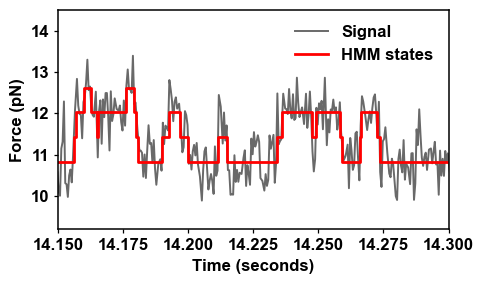

In [ ]:
plot_single_trace_HMM_step(p_hmm_result, p1, 4, "/publication.pdf", xmin=14.15, xmax=14.30)

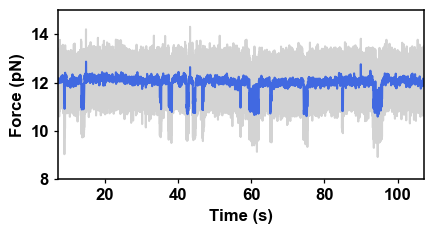

In [ ]:
window = 50
trace = p1
fig, ax = plt.subplots(figsize=(4.5,2.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = trace['time (seconds)'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)
j_avg = trace['force_corrected (pN)'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(trace['time (seconds)'], trace['force_corrected (pN)'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='royalblue')
plt.xlabel('Time (s)')
plt.ylabel('Force (pN)')
#plt.legend(frameon=False)
plt.xlim(trace['time (seconds)'].min(), trace['time (seconds)'].min()+100)
plt.ylim(8, 15)
plt.tight_layout()
plt.savefig("/publication.pdf", format='pdf')
plt.show()


##### Base-pairs

Model loaded from final_models/bp_pdgfra_nterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': -1.303431075813782, 'State 1': 0.5665084215650228, 'State 2': 1.4346080791043403, 'State 3': 0.3023145751444189}


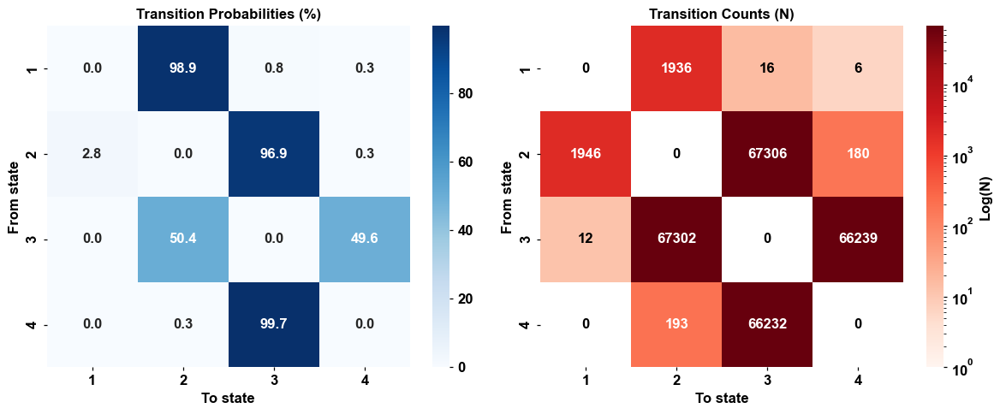

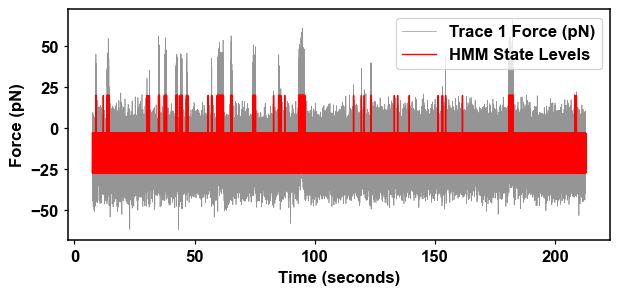

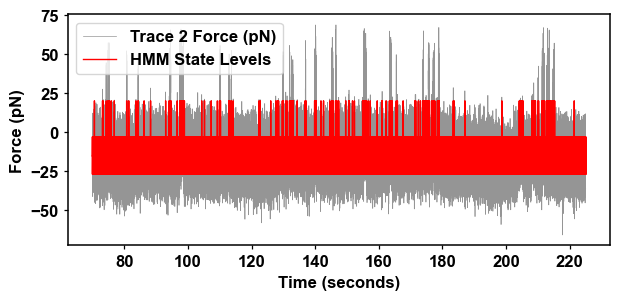

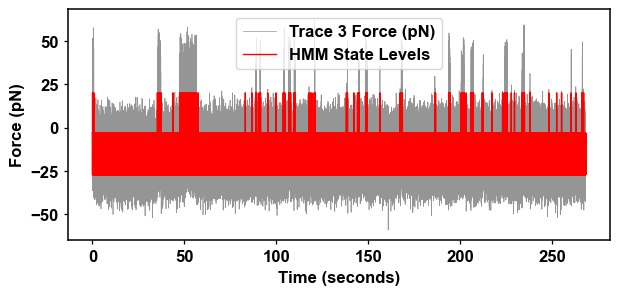

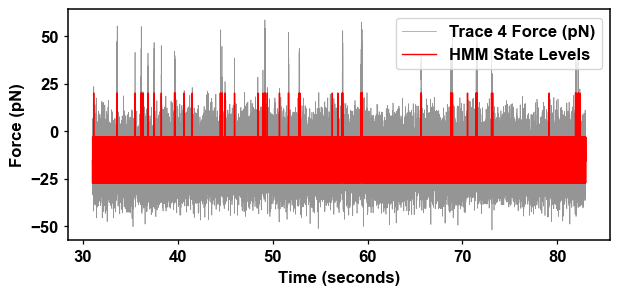

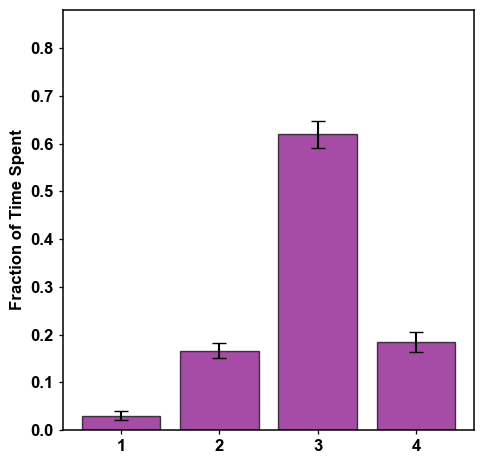

Mean fraction of time spent in each state: [0.03026278 0.1658743  0.61956346 0.18429945]
Standard deviation of time spent in each state: [0.0093157  0.01554701 0.02781058 0.02145092]


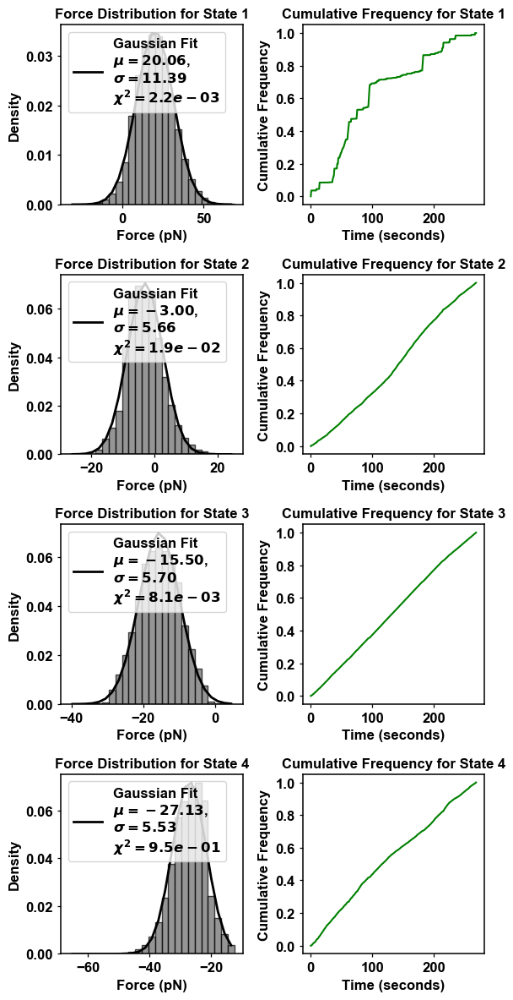

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_63819/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


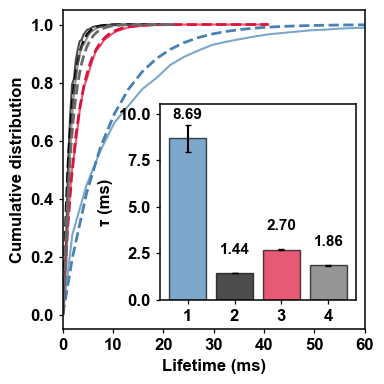

taus =  [8.68624367495416, 1.441897072489572, 2.6992578060602055, 1.862199967548143]
tau errors =  [0.734583034188032, 0.016998096499095946, 0.025284522632355255, 0.02256497094825536]


In [ ]:
p_traces = [p1_bp, p2_bp, p3_bp, p4_bp]
p_hmm_result = HMM_predict_bp(p_traces, "final_models/bp_pdgfra_nterm_ctcfwt_4_model.pkl")
p_sorted_hs = plot_transition_and_HMM_bp(p_hmm_result, p_traces, 4, "/publication.pdf")
p_forcedf = plot_force_statistics(4, p_sorted_hs[0], p_hmm_result)
p_results = plot_cdf_lifetime(4, p_sorted_hs[0], p_hmm_result, 0, 60,  "/publication.pdf")

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.stats import norm
from matplotlib.ticker import ScalarFormatter

def plot_rolling_force_distribution_bp(
    hmm_result,
    traces,
    n_components,
    window_size=0,
    binwidth=3,
    save_combined="/publication.pdf",
    xlim=(-50, 50),
    colors=('steelblue', 'black', 'crimson', 'dimgrey')
):
    """
    Plot stacked histograms (one row per hidden state) of bp distributions after
    applying a rolling average to 'bp_corrected'. All share the same x-axis.
    Y-axis is COUNT (scientific notation).
    States are sorted by increasing mean bp value.
    """
    # Unpack
    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    combined_forces = []
    combined_hidden_states = []
    start_idx = 0

    for trace_index, trace in enumerate(traces):
        trace_length = len(trace)
        trace_time = all_time_data[trace_index]
        trace_force = trace['bp_corrected'].values
        trace_hidden_states = hidden_states[start_idx:start_idx + trace_length]

        df_trace = pd.DataFrame({
            'time': trace_time,
            'bp_corrected': trace_force,
            'hidden_states': trace_hidden_states
        })

        # Rolling avg
        df_trace = apply_rolling_average_bp(df_trace, window_size)

        combined_forces.extend(df_trace['bp_corrected'].values)
        combined_hidden_states.extend(df_trace['hidden_states'].values)

        start_idx += trace_length

    combined_forces = np.asarray(combined_forces)
    combined_hidden_states = np.asarray(combined_hidden_states)

    # Sort states by mean bp
    state_means = np.array([
        combined_forces[combined_hidden_states == i].mean()
        if np.any(combined_hidden_states == i) else np.nan
        for i in range(n_components)
    ])
    sorted_indices = np.argsort(state_means)
    sorted_hidden_states = np.zeros_like(combined_hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[combined_hidden_states == old_label] = new_label

    # Common bins
    global_min = np.nanmin(combined_forces)
    global_max = np.nanmax(combined_forces)
    left = min(global_min, xlim[0])
    right = max(global_max, xlim[1])
    bins = np.arange(left, right + binwidth, binwidth)

    # --- Stacked subplot figure ---
    fig, axes = plt.subplots(n_components, 1, figsize=(4, 1.2*n_components), sharex=True)

    if n_components == 1:
        axes = [axes]

    for i, ax in enumerate(axes):
        state_forces = combined_forces[sorted_hidden_states == i]
        N = len(state_forces)

        if N == 0:
            ax.set_title(f"State {i+1} (N=0)")
            ax.set_ylabel('Count')
            continue

        # Histogram
        counts, edges, _ = ax.hist(
            state_forces,
            bins=bins,
            color=colors[i % len(colors)],
            edgecolor='black',
            alpha=0.7,
            density=False,
            label=f'State {i+1}'# (N={N})'
        )

        # Gaussian fit scaled to counts
        mu, std = norm.fit(state_forces)
        x_vals = np.linspace(edges[0], edges[-1], 400)
        y_gauss = norm.pdf(x_vals, mu, std) * N * binwidth
        ax.plot(x_vals, y_gauss, lw=1.6, color='black')

        # Format
        ax.set_ylabel('Count')
        ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
        #ax.set_title(f"State {i+1}: μ={mu:.2f} bp, σ={std:.2f} bp, N={N}")
        ax.legend(frameon=False)

        print(f"State {i+1}: mu = {mu:.3f} ± {std:.3f} bp, N = {N}")

    axes[-1].set_xlabel('Distance from motif center (bp)')
    axes[-1].set_xlim(*xlim)

    plt.tight_layout()
    plt.savefig(save_combined, format='pdf')
    plt.show()


State 1: mu = -27.126 ± 5.526 bp, N = 234310
State 2: mu = -15.496 ± 5.699 bp, N = 772942
State 3: mu = -3.005 ± 5.656 bp, N = 200878
State 4: mu = 20.061 ± 11.385 bp, N = 41865


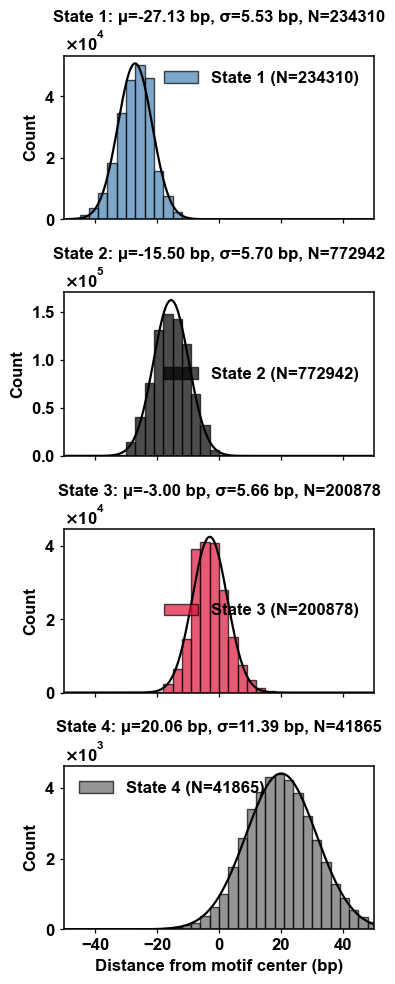

In [47]:
plot_rolling_force_distribution_bp(p_hmm_result, [p1_bp, p2_bp, p3_bp, p4_bp], 4, window_size=1)

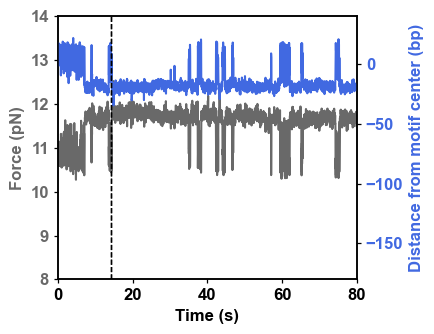

In [ ]:
window = 50
fig, ax1 = plt.subplots(figsize=(4.5,3.5))

# --- j (bp) averages ---
time_avg = p1_bp_raw['time'].values[:len(p1_bp_raw)//window*window].reshape(-1, window).mean(axis=1)
j_avg = p1_bp_raw['j'].values[:len(p1_bp_raw)//window*window].reshape(-1, window).mean(axis=1)

# --- force averages ---
time_avg_force = p1_raw['time (seconds)'].values[:len(p1_bp_raw)//window*window].reshape(-1, window).mean(axis=1)
j_avg_force = p1_raw['force (pN)'].values[:len(p1_bp_raw)//window*window].reshape(-1, window).mean(axis=1)

# ---- Left y-axis: Force (red) ----
ax1.plot(p1_raw['time (seconds)'], p1_raw['force (pN)'], alpha=0.0,
         label='Force raw (500 µs)', color='lightcoral')
ax1.plot(time_avg_force, j_avg_force, label='Force rolling (50)', color='dimgrey')
ax1.set_ylabel('Force (pN)', color='dimgrey')
ax1.tick_params(axis='y', labelcolor='dimgrey')
ax1.set_xlim(0, 80)
ax1.set_ylim(8, 14)

# ---- Right y-axis: Distance from motif center (blue) ----
ax2 = ax1.twinx()
ax2.plot(p1_bp_raw['time'], p1_bp_raw['j'], alpha=0.0,
         label='j raw (500 µs)', color='lightblue')
ax2.plot(time_avg, j_avg, label='j rolling (50)', color='royalblue')
ax2.set_ylabel('Distance from motif center (bp)', color='royalblue')
ax2.tick_params(axis='y', labelcolor='royalblue')
ax2.set_ylim(-180, 40)
ax2.axvline(14.15, color='black', linestyle='--', lw=1)
ax2.axvline(14.30, color='black', linestyle='--', lw=1)
# ---- Shared x-axis ----
ax1.set_xlabel('Time (s)')

# ---- Legends ----
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
#ax1.legend(lines1 + lines2, labels1 + labels2, frameon=False, loc='upper right')

plt.tight_layout()
plt.savefig("/publication.pdf", format='pdf')
plt.show()


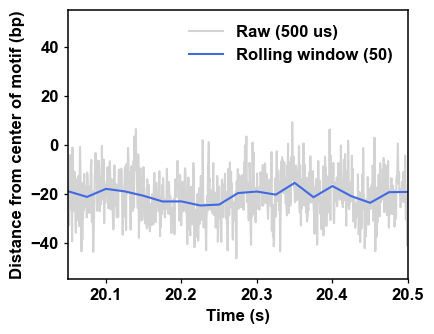

In [ ]:
window = 50
fig, ax = plt.subplots(figsize=(4.5,3.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = p1_bp_raw['time'].values[:len(p1_bp_raw)//window*window].reshape(-1, window).mean(axis=1)
j_avg = p1_bp_raw['j'].values[:len(p1_bp_raw)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(p1_bp_raw['time'], p1_bp_raw['j'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='royalblue')
plt.xlabel('Time (s)')
plt.ylabel('Distance from center of motif (bp)')
plt.legend(frameon=False)
plt.xlim(20.05, 20.5)
plt.ylim(-55, 55)
plt.tight_layout()
plt.savefig("/publication.pdf", format='pdf')
plt.show()


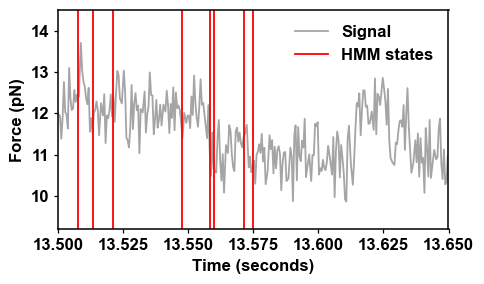

In [ ]:
plot_single_trace_HMM_step(p_hmm_result, p1, 4, xmin=13.5, xmax=13.65, savepath="/publication.pdf")

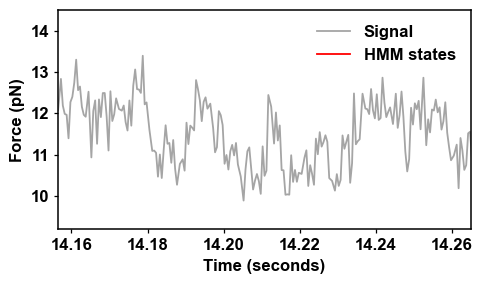

In [ ]:
plot_single_trace_HMM_step(p_hmm_result, p1, 4, xmin=14.1565, xmax=14.265, savepath="/publication.pdf")

#### CTCF DeltaN

Model loaded from final_models/pdgfra_nterm_ctcfdn_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.09005225936815622, 'State 1': 0.99326661083134, 'State 2': -1.658364601183867, 'State 3': 1.5750457309843708}


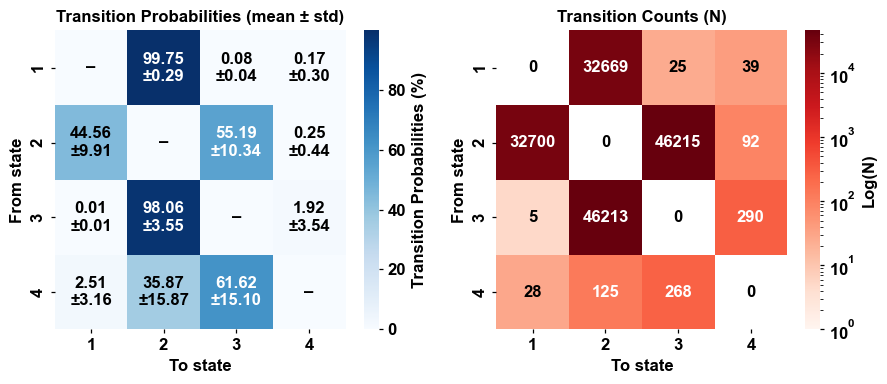


=== Per-trace occupancies (fractions) ===
           state_1  state_2  state_3  state_4
trace_001   0.2172   0.5893   0.0761   0.1174
trace_002   0.0920   0.7514   0.1555   0.0010
trace_003   0.0885   0.7581   0.1533   0.0001
trace_004   0.0890   0.7557   0.1543   0.0010
trace_005   0.1097   0.7297   0.1443   0.0164

=== Occupancy (per state) ===
state  mean(frac)  SD_across_traces  boot_SD_of_mean  CI_lo  CI_hi
    1      0.1193             0.0496           0.0223  0.0894  0.1700
    2      0.7168             0.0646           0.0291  0.6511  0.7558
    3      0.1367             0.0306           0.0138  0.1054  0.1546
    4      0.0272             0.0455           0.0205  0.0006  0.0737


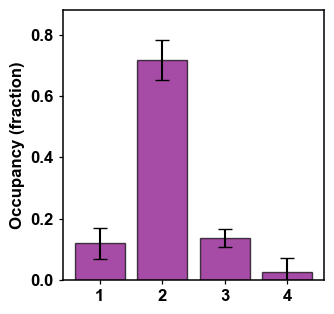


Mean fraction of time in each state: [0.11927974 0.71683751 0.13671399 0.02716876]
SD across traces:                    [0.0495962  0.06455886 0.03057982 0.04551431]
Bootstrap SD of the mean:            [0.02234891 0.02909455 0.01376946 0.02050294]
95% CI (percentile):               lo=[8.93891186e-02 6.51134197e-01 1.05368708e-01 6.16356433e-04], hi=[0.16997754 0.75581025 0.15458389 0.07371936]


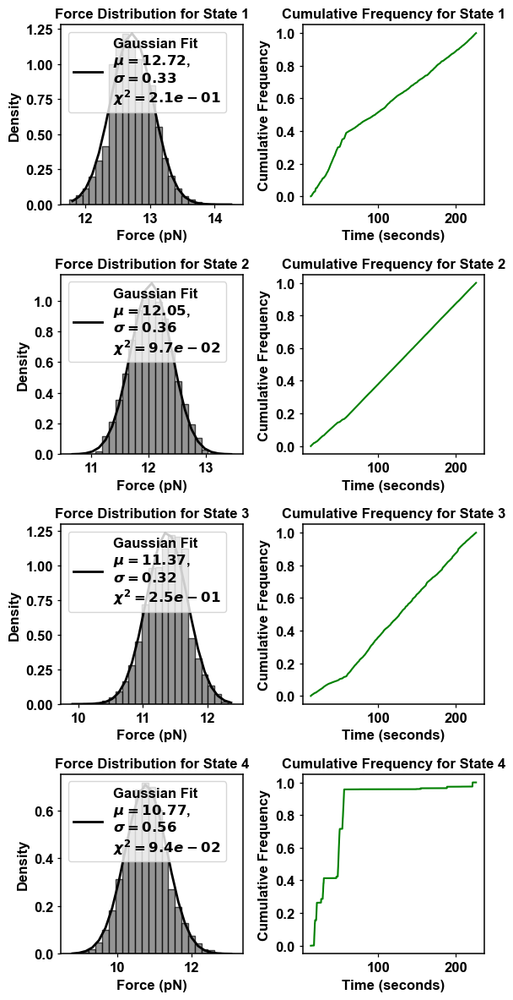

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_23386/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


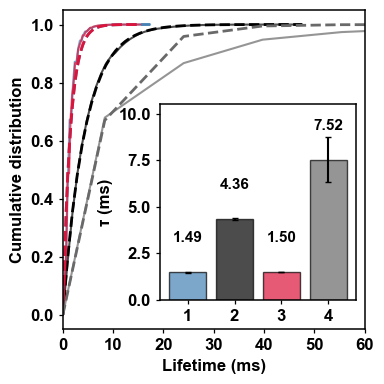

taus =  [1.491292674714767, 4.360400743399142, 1.4977808834799635, 7.523562967675443]
tau errors =  [0.025512259739367542, 0.05358381401658143, 0.021787581626362792, 1.1944908642707812]


In [ ]:
pdn_traces = [pdn1, pdn2, pdn3, pdn4, pdn5]
pdn_hmm_result = HMM_predict_force(pdn_traces, "final_models/pdgfra_nterm_ctcfdn_4_model.pkl")
pdn_sorted_hs = plot_transition_and_HMM_force(pdn_hmm_result, pdn_traces, 4, '/publication.pdf')
pdn_forcedf = plot_force_statistics(4, pdn_sorted_hs[0], pdn_hmm_result)
pdn_results = plot_cdf_lifetime(4, pdn_sorted_hs[0], pdn_hmm_result, 0, 60,  '/publication.pdf')
pdn_tp_results = compute_transition_probabilities_stats(pdn_hmm_result, pdn_traces, n_components=4, as_percent=False)

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/2041128995.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = copy(cm.get_cmap(cmap))


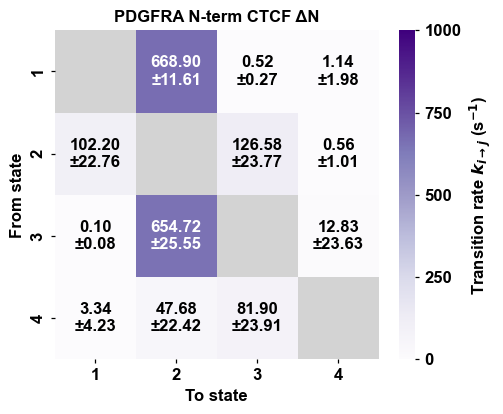

In [ ]:
# If all 4 states fit in the CDF step (taus for all states), just call:
k_mean, k_std = plot_transition_rates_with_errors(
    tp_stats=pdn_tp_results,
    cdf_results=pdn_results,
    n_components=4,
    state_indices=None,  # or omit
    savepath='/publication.pdf',
    title = 'PDGFRA N-term CTCF ΔN',
    cmap="Purples"
)


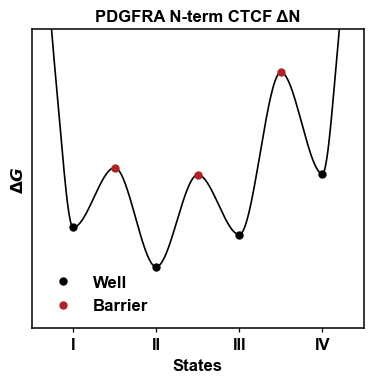

Using fixed Eyring ν = kBT/h = 6.212e+12 s^-1 at T=298.15 K
(Visualization only) constant barrier display shift applied: 20.000 kBT


In [ ]:
# lifetimes from HMM (uses self-transitions)
taus_ms = np.array(get_lifetime_taus(4, pdn_sorted_hs[0], pdn_hmm_result)['taus'])

# exit-conditioned branching
P_exit = calculate_exit_probabilities(pdn_hmm_result, 4)

# rates
rate_matrix = build_rate_matrix(P_exit, taus_ms)

# plot with automatic prefactor (keeps barriers above wells)
plot_energy_landscape_from_rates(
    rate_matrix,
    title='PDGFRA N-term CTCF ΔN',
    savepath='/publication.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath='/publication.csv',
)


In [364]:
total_time_sec = total_recorded_time([pdn1, pdn2, pdn3, pdn4, pdn5])
print(f"Total recorded time: {total_time_sec:.2f} seconds")
print(f"Which is {total_time_sec/60:.2f} minutes")
print('----')
calculate_transitions_to_states(pdn_hmm_result, 4)

Total recorded time: 512.40 seconds
Which is 8.54 minutes
----
Total number of transitions between states (excluding self-transitions): 158670
Transitions to each state:
State 1: To = 32733
State 2: To = 79008
State 3: To = 46508
State 4: To = 421


(158670, {0: 32733, 1: 79008, 2: 46508, 3: 421})

#### Methylated CTCF WT

Model loaded from models/met_nterm_hmm_model_test.pkl
Fraction of time spent in each state: {'State 0': -0.804505232605467, 'State 1': 11.34714794870908, 'State 2': -8.895791723823177, 'State 3': -0.6468509922804356}


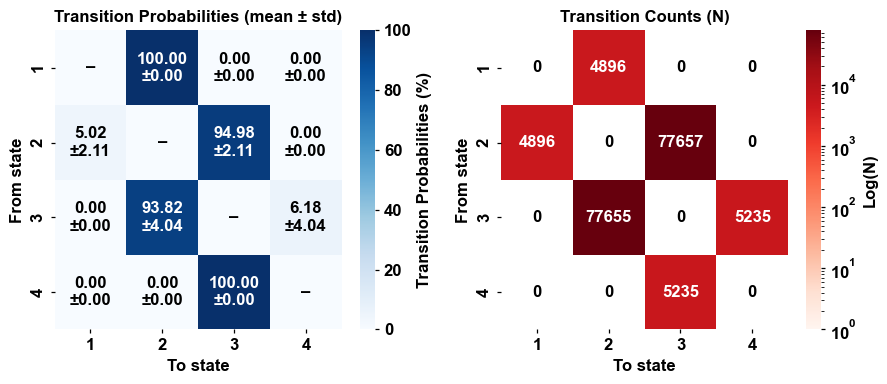


=== Per-trace occupancies (fractions) ===
           state_1  state_2  state_3  state_4
trace_001   0.0057   0.5662   0.3984   0.0298
trace_002   0.0025   0.5170   0.4785   0.0020
trace_003   0.0024   0.5180   0.4777   0.0019
trace_004   0.0042   0.5118   0.4777   0.0063
trace_005   0.0100   0.5048   0.4771   0.0081
trace_006   0.0095   0.5047   0.4781   0.0077
trace_007   0.0097   0.5043   0.4746   0.0114

=== Occupancy (per state) ===
state  mean(frac)  SD_across_traces  boot_SD_of_mean  CI_lo  CI_hi
    1      0.0063             0.0032           0.0012  0.0039  0.0087
    2      0.5181             0.0204           0.0077  0.5067  0.5350
    3      0.4660             0.0276           0.0104  0.4433  0.4779
    4      0.0096             0.0088           0.0033  0.0045  0.0170


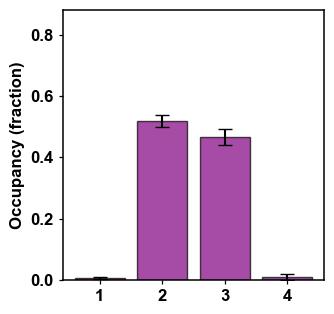


Mean fraction of time in each state: [0.00627259 0.51811346 0.46601056 0.00960339]
SD across traces:                    [0.00317066 0.02035801 0.02763599 0.00880784]
Bootstrap SD of the mean:            [0.0011957  0.0076762  0.01042177 0.00331974]
95% CI (percentile):               lo=[0.00394191 0.50668547 0.44326298 0.00447213], hi=[0.00865381 0.53496814 0.47791589 0.01698449]


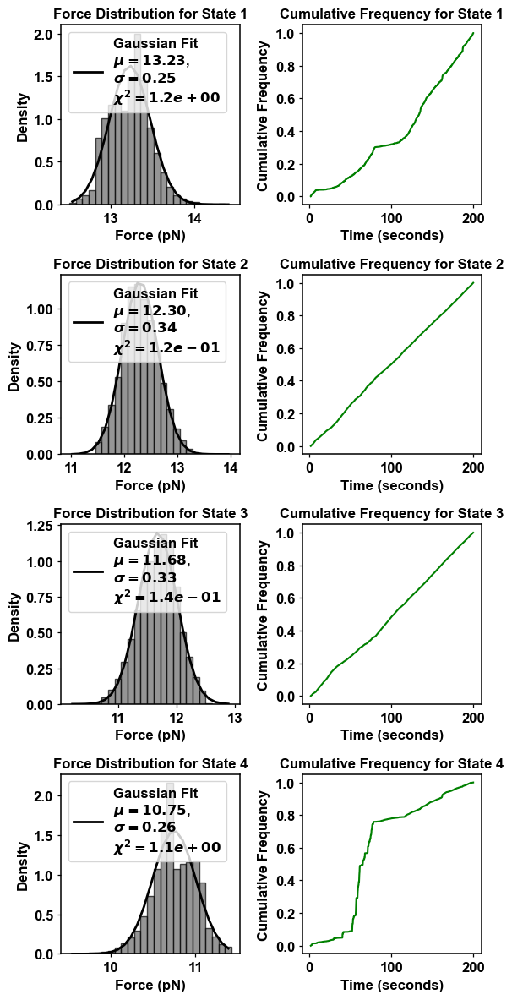

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_23386/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


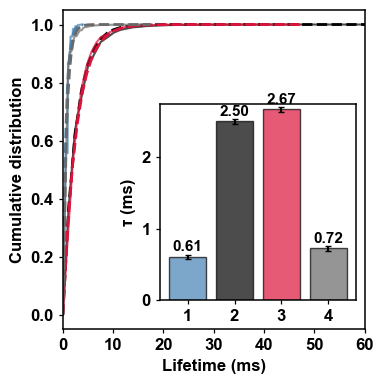

taus =  [0.6058730898348387, 2.5017976006247697, 2.6712381617405487, 0.7231059997657011]
tau errors =  [0.02626312359514852, 0.028895348838213784, 0.030205644847227483, 0.029429849551818446]


In [ ]:
m_traces = [m1, m2, m3, m4, m5, m6, m7]
m_hmm_result = HMM_predict_force(m_traces, 'pdgfra_met_nterm_ctcfwt_4_model.pkl')
m_sorted_hs = plot_transition_and_HMM_force(m_hmm_result, m_traces, 4, '/publication.pdf')
m_forcedf = plot_force_statistics(4, m_sorted_hs[0], m_hmm_result)
m_results = plot_cdf_lifetime(4, m_sorted_hs[0], m_hmm_result, 0, 60,  '/publication.pdf')
m_tp_results = compute_transition_probabilities_stats(m_hmm_result, m_traces, n_components=4, as_percent=False)

In [677]:
"""
Un-methylated:
Mean fraction of time spent in each state: [0.10285608 0.75757775 0.12551483 0.01405134]
Standard deviation of time spent in each state: [0.02432818 0.04604561 0.0321958  0.01604383]

Methylated:
Mean fraction of time spent in each state: [0.00627259 0.51811346 0.46601056 0.00960339]
Standard deviation of time spent in each state: [0.00317066 0.02035801 0.02763599 0.00880784]
"""

print(0.10285608/0.00627259)
print(0.75757775/0.51811346)
print(0.46601056/0.12551483)

16.39770493528192
1.4621850395471294
3.712792822967613


In [ ]:
# If all 4 states fit in the CDF step (taus for all states), just call:
k_mean, k_std = plot_transition_rates_with_errors(
    tp_stats=m_tp_results,
    cdf_results=m_results,
    n_components=4,
    state_indices=None,  # or omit
    savepath='/publication.pdf',
    title = 'PDGFRA Methylated N-term CTCF WT',
    cmap="Purples"
)


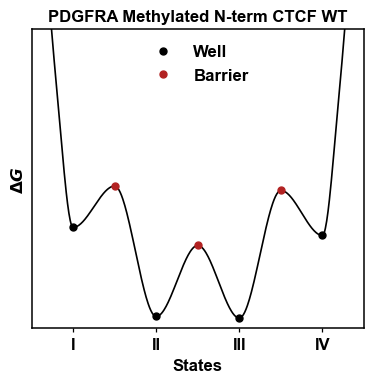

Using fixed Eyring ν = kBT/h = 6.212e+12 s^-1 at T=298.15 K
(Visualization only) constant barrier display shift applied: 20.000 kBT


In [ ]:
# lifetimes from HMM (uses self-transitions)
taus_ms = np.array(get_lifetime_taus(4, m_sorted_hs[0], m_hmm_result)['taus'])

# exit-conditioned branching
P_exit = m_tp_results[0]

# rates
rate_matrix = build_rate_matrix(P_exit, taus_ms)

# plot with automatic prefactor (keeps barriers above wells)
plot_energy_landscape_from_rates(
    rate_matrix,
    title='PDGFRA Methylated N-term CTCF WT',
    savepath='/publication.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath='/publication.csv',
)


In [366]:
total_time_sec = total_recorded_time([m1, m2, m3, m4, m5, m6, m7])
print(f"Total recorded time: {total_time_sec:.2f} seconds")
print(f"Which is {total_time_sec/60:.2f} minutes")
print('----')
calculate_transitions_to_states(m_hmm_result, 4)

Total recorded time: 526.55 seconds
Which is 8.78 minutes
----
Total number of transitions between states (excluding self-transitions): 175577
Transitions to each state:
State 1: To = 4896
State 2: To = 82553
State 3: To = 82893
State 4: To = 5235


(175577, {0: 4896, 1: 82553, 2: 82893, 3: 5235})

#### CTCF WT w/ PDS5A

##### Force

Model loaded from final_models/pdgfra_nterm_ctcfwt_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.020016659349927, 'State 1': 0.9250390843473798, 'State 2': -0.16707588455467384, 'State 3': 0.22202014085736702}


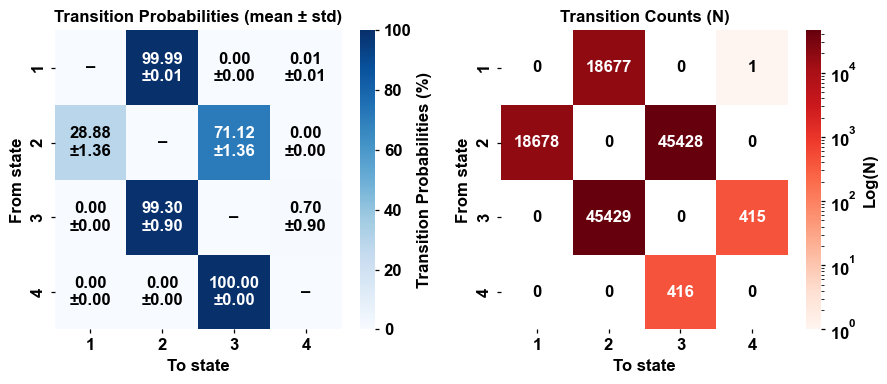


=== Per-trace occupancies (fractions) ===
           state_1  state_2  state_3  state_4
trace_001   0.0336   0.8312   0.1265   0.0087
trace_002   0.0416   0.8002   0.1578   0.0003
trace_003   0.0323   0.8247   0.1428   0.0002
trace_004   0.0280   0.8444   0.1259   0.0016
trace_005   0.0280   0.8453   0.1252   0.0015
trace_006   0.0278   0.8410   0.1311   0.0002

=== Occupancy (per state) ===
state  mean(frac)  SD_across_traces  boot_SD_of_mean  CI_lo  CI_hi
    1      0.0319             0.0049           0.0020  0.0287  0.0363
    2      0.8311             0.0157           0.0064  0.8179  0.8419
    3      0.1349             0.0119           0.0048  0.1266  0.1449
    4      0.0021             0.0030           0.0012  0.0004  0.0049


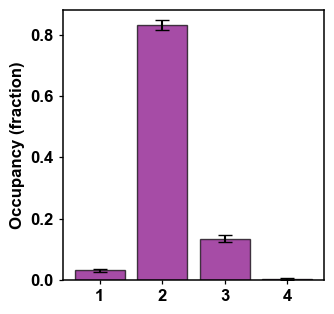


Mean fraction of time in each state: [0.0318975  0.83112972 0.13487015 0.00210264]
SD across traces:                    [0.00490987 0.01565219 0.01187264 0.003012  ]
Bootstrap SD of the mean:            [0.00198994 0.0063546  0.00484322 0.00122046]
95% CI (percentile):               lo=[2.86672839e-02 8.17887408e-01 1.26624197e-01 4.40160720e-04], hi=[0.03626762 0.84192817 0.14485985 0.00490579]


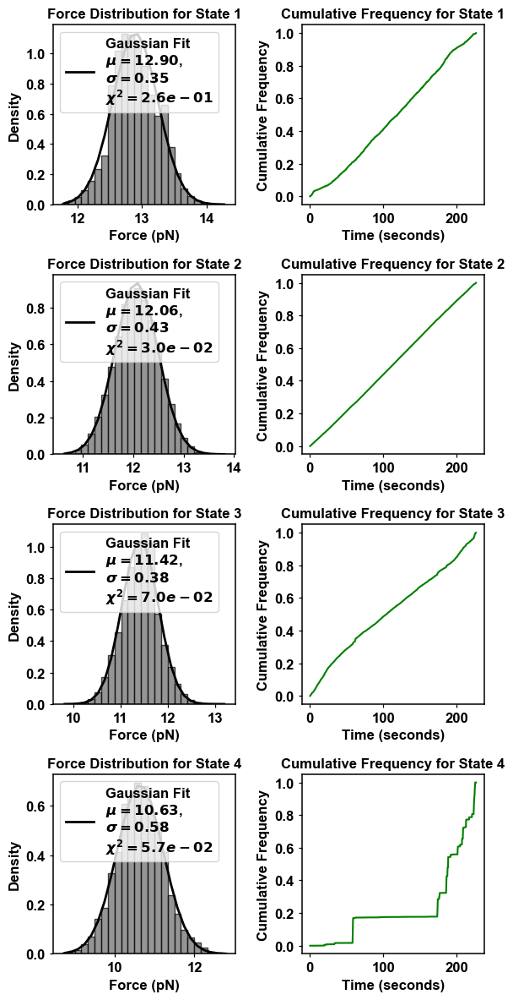

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_23386/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


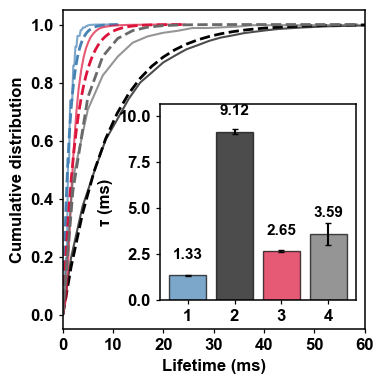

taus =  [1.3322385076064216, 9.11776017972497, 2.6521273080919663, 3.5928099583587074]
tau errors =  [0.029619577555140424, 0.12918781385791228, 0.03818332740632901, 0.6048484673216656]


In [ ]:
p5_traces = [p5_1, p5_4, p5_5, p5_6, p5_7, p5_8]
p5_hmm_result = HMM_predict_force(p5_traces, "final_models/pdgfra_nterm_ctcfwt_pds5a_4_model.pkl")
p5_sorted_hs = plot_transition_and_HMM_force(p5_hmm_result, p5_traces, 4, '/publication.pdf')
p5_forcedf = plot_force_statistics(4, p5_sorted_hs[0], p5_hmm_result)
p5_results = plot_cdf_lifetime(4, p5_sorted_hs[0], p5_hmm_result, 0, 60,  '/publication.pdf')
p5_tp_results = compute_transition_probabilities_stats(p5_hmm_result, p5_traces, n_components=4, as_percent=False)

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/2041128995.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = copy(cm.get_cmap(cmap))


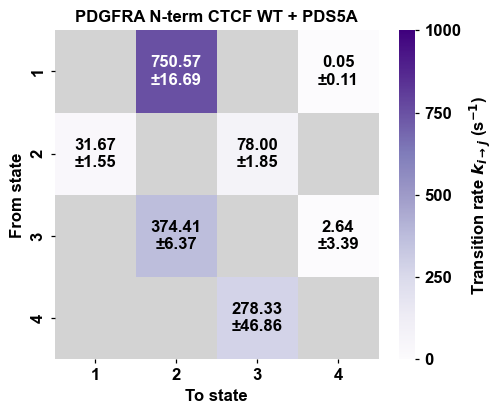

In [ ]:
# If all 4 states fit in the CDF step (taus for all states), just call:
k_mean, k_std = plot_transition_rates_with_errors(
    tp_stats=p5_tp_results,
    cdf_results=p5_results,
    n_components=4,
    state_indices=None,  # or omit
    savepath='/publication.pdf',
    title = 'PDGFRA N-term CTCF WT + PDS5A',
    cmap="Purples"
)

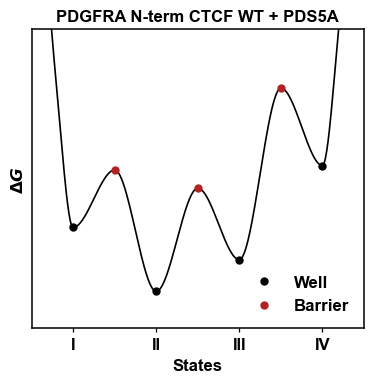

Using fixed Eyring ν = kBT/h = 6.212e+12 s^-1 at T=298.15 K
(Visualization only) constant barrier display shift applied: 20.000 kBT


In [ ]:
# lifetimes from HMM (uses self-transitions)
taus_ms = np.array(get_lifetime_taus(4, p5_sorted_hs[0], p5_hmm_result)['taus'])

# exit-conditioned branching
P_exit = p5_tp_results[0]

# rates
rate_matrix = build_rate_matrix(P_exit, taus_ms)

# plot with automatic prefactor (keeps barriers above wells)
plot_energy_landscape_from_rates(
    rate_matrix,
    title='PDGFRA N-term CTCF WT + PDS5A',
    savepath='/publication.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath='/publication.csv',
)


In [368]:
total_time_sec = total_recorded_time([p5_1, p5_4, p5_5, p5_6, p5_7, p5_8])
print(f"Total recorded time: {total_time_sec:.2f} seconds")
print(f"Which is {total_time_sec/60:.2f} minutes")
print('----')
calculate_transitions_to_states(p5_hmm_result, 4)

Total recorded time: 825.50 seconds
Which is 13.76 minutes
----
Total number of transitions between states (excluding self-transitions): 129044
Transitions to each state:
State 1: To = 18678
State 2: To = 64106
State 3: To = 45844
State 4: To = 416


(129044, {0: 18678, 1: 64106, 2: 45844, 3: 416})

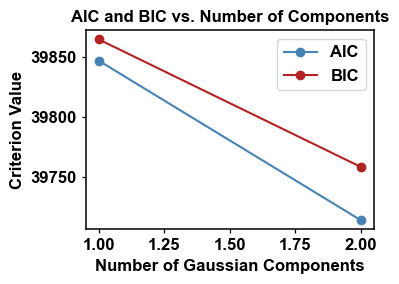

Best number of components (BIC): 2

Component stats:
  Component 1: fraction=0.5881 (58.8%), N=31210
  Component 2: fraction=0.4119 (41.2%), N=21856


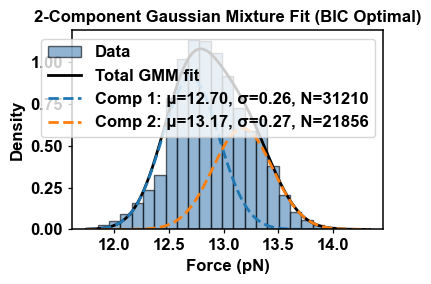

In [60]:
check_if_extra_state(p5_forcedf)

##### Base-pairs

Model loaded from final_models/bp_pdgfra_nterm_ctcfwt_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.9494690374592244, 'State 1': -0.6110550365309528, 'State 2': 0.6428010147195908, 'State 3': 0.018784984352137633}


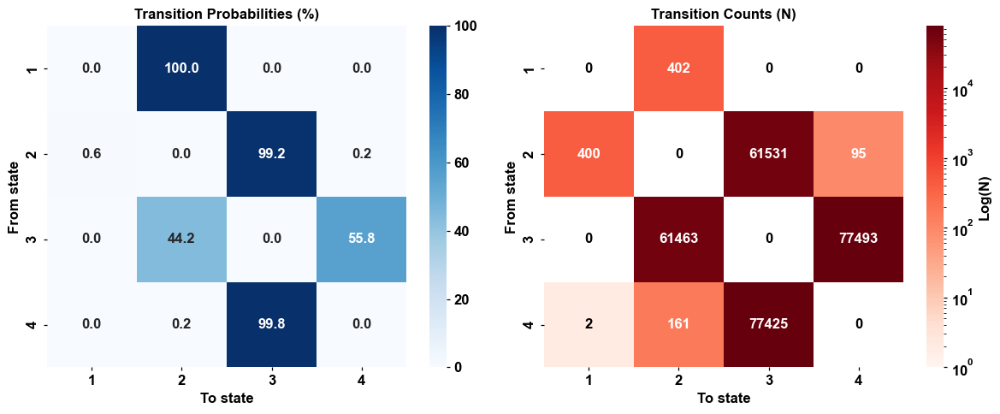

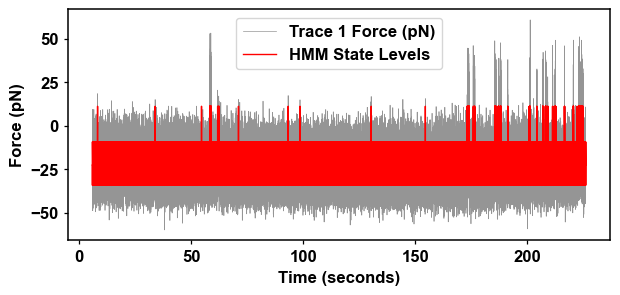

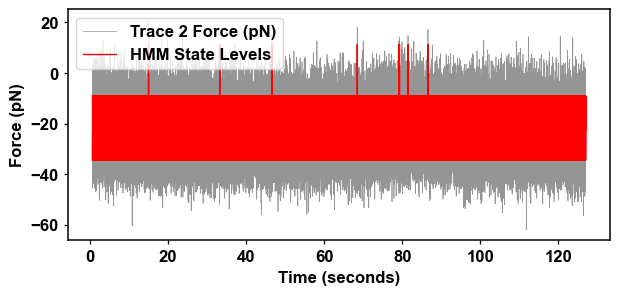

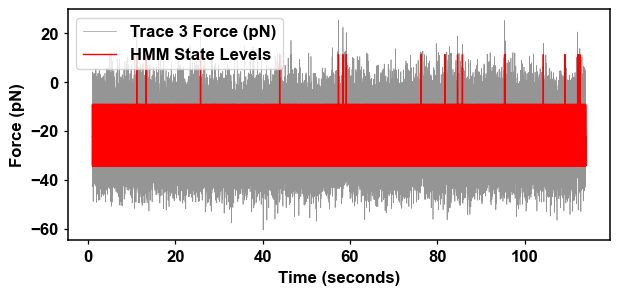

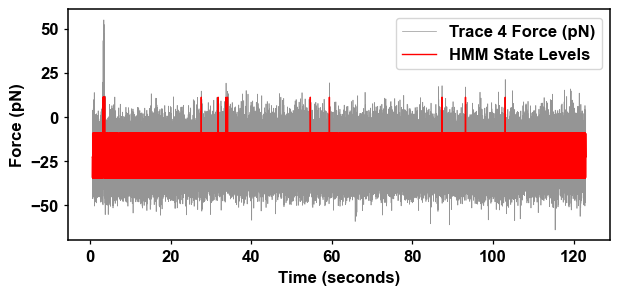

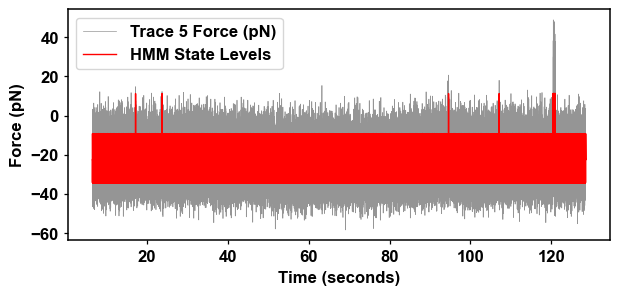

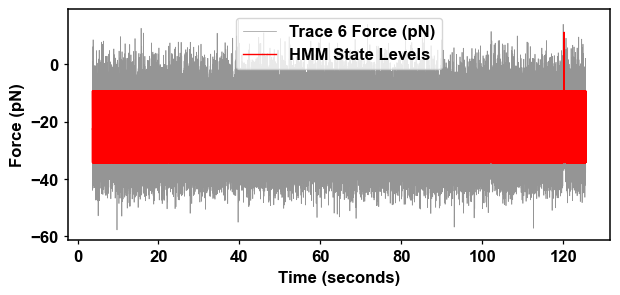

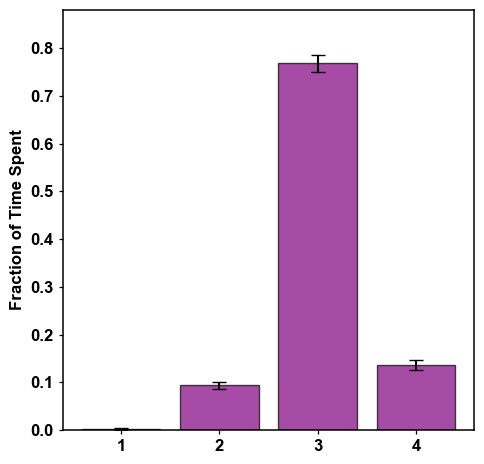

Mean fraction of time spent in each state: [0.00194792 0.09382894 0.7679938  0.13622934]
Standard deviation of time spent in each state: [0.00294399 0.00753387 0.01732032 0.01047068]


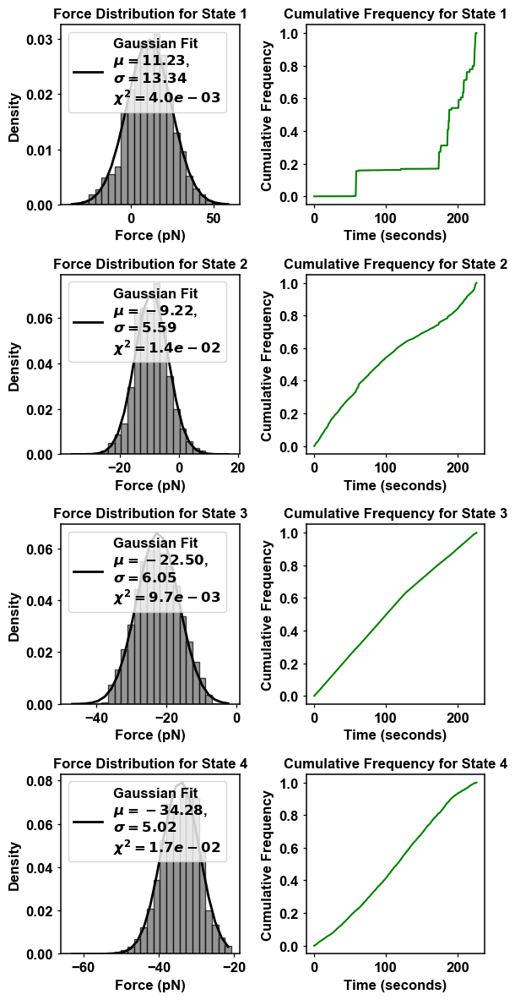

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_85948/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


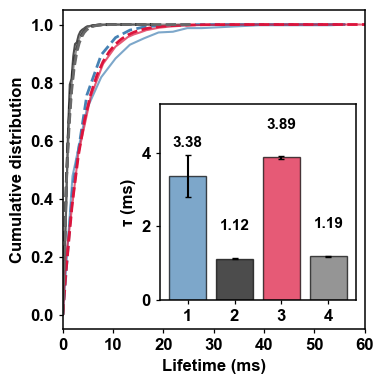

taus =  [3.377447408672422, 1.118231822954048, 3.8858125878517886, 1.185304341828126]
tau errors =  [0.5789772814872611, 0.013610042210341277, 0.03695102690033232, 0.013154529935789326]


In [ ]:
p5_traces = [p5_1_bp, p5_4_bp, p5_5_bp, p5_6_bp, p5_7_bp, p5_8_bp]
p5_hmm_result = HMM_predict_bp(p5_traces, "final_models/bp_pdgfra_nterm_ctcfwt_pds5a_4_model.pkl")
p5_sorted_hs = plot_transition_and_HMM_bp(p5_hmm_result, p5_traces, 4, '/publication.pdf')
p5_forcedf = plot_force_statistics(4, p5_sorted_hs[0], p5_hmm_result)
p5_results = plot_cdf_lifetime(4, p5_sorted_hs[0], p5_hmm_result, 0, 60, '/publication.pdf')

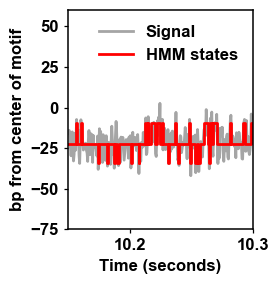

In [ ]:
plot_single_trace_HMM_step_bp(p5_hmm_result, p5_1_bp, 4, '/publication.pdf', xmin=10.15, xmax=10.30)

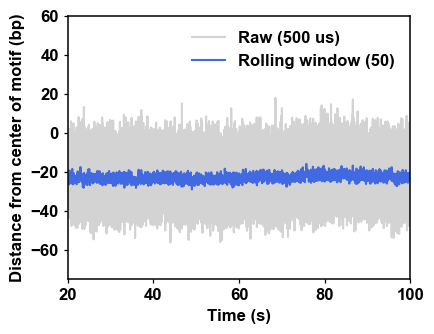

In [ ]:
window = 50
trace = p5_4_bp
fig, ax = plt.subplots(figsize=(4.5,3.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = trace['time'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)
j_avg = trace['bp_corrected'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(trace['time'], trace['bp_corrected'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='royalblue')
plt.xlabel('Time (s)')
plt.ylabel('Distance from center of motif (bp)')
plt.legend(frameon=False)
plt.xlim(20, 100)
plt.ylim(-75, 60)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()


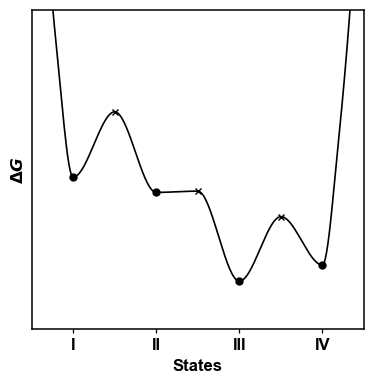

In [ ]:
lifetimes = np.array(get_lifetime_taus(4, p_sorted_hs[0], p_hmm_result)['taus'])
transition_probabilities = calculate_transition_probabilities(p_hmm_result, 4)

plot_energy_landscape(
    lifetimes,
    transition_probabilities,
    savepath='/publication.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath = '/publication.csv'
)

State 1: mu = -34.284 ± 5.021 bp, N = 214881
State 2: mu = -22.497 ± 6.049 bp, N = 1182874
State 3: mu = -9.220 ± 5.591 bp, N = 145828
State 4: mu = 11.231 ± 13.337 bp, N = 4213


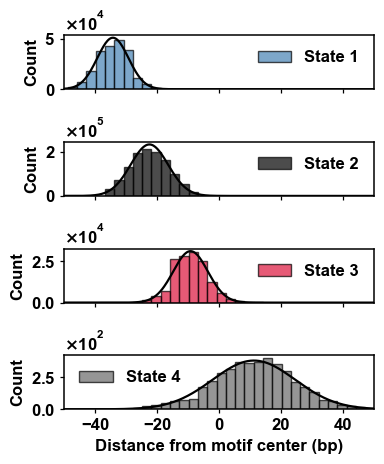

In [98]:
plot_rolling_force_distribution_bp(p5_hmm_result, [p5_1_bp, p5_4_bp, p5_5_bp, p5_6_bp, p5_7_bp, p5_8_bp], 4, window_size=1)

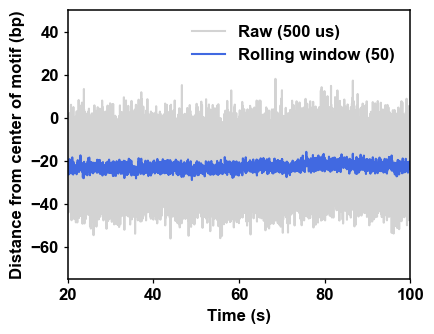

In [ ]:
window = 50
trace = p5_4_bp
fig, ax = plt.subplots(figsize=(4.5,3.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = trace['time'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)
j_avg = trace['bp_corrected'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(trace['time'], trace['bp_corrected'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='royalblue')
plt.xlabel('Time (s)')
plt.ylabel('Distance from center of motif (bp)')
plt.legend(frameon=False)
plt.xlim(20, 100)
plt.ylim(-75, 50)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()


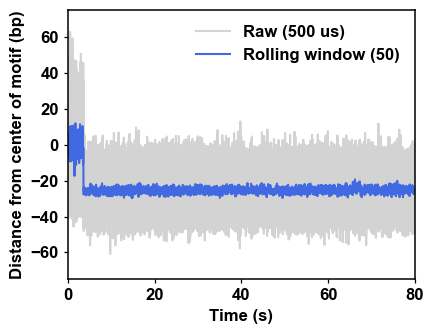

In [ ]:
window = 50
trace = p5_8_bp_raw
fig, ax = plt.subplots(figsize=(4.5,3.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = trace['time'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)
j_avg = trace['j'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(trace['time'], trace['j'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='royalblue')
plt.xlabel('Time (s)')
plt.ylabel('Distance from center of motif (bp)')
plt.legend(frameon=False)
plt.xlim(0, 80)
plt.ylim(-75, 75)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()


#### CTCF WT w/ Cohesin

##### Force

Model loaded from final_models/pdgfra_nterm_ctcfwt_cohesin_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.2384893005597214, 'State 1': 5.426189162691181, 'State 2': -9.793130487559363, 'State 3': 5.12845202430846}


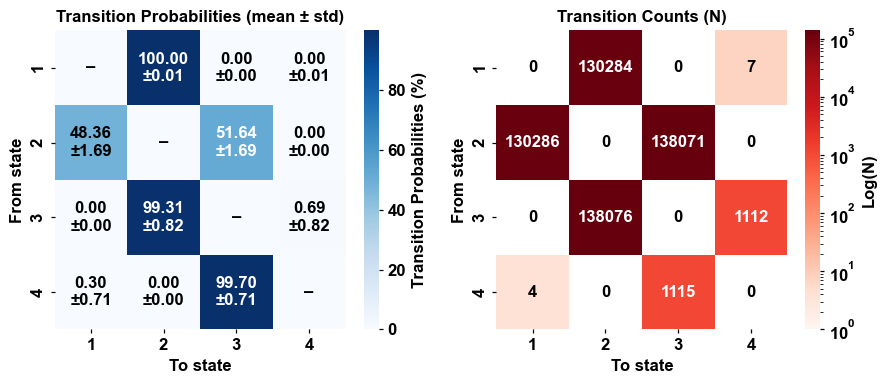


=== Per-trace occupancies (fractions) ===
           state_1  state_2  state_3  state_4
trace_001   0.1163   0.7535   0.1301   0.0001
trace_002   0.1217   0.7465   0.1267   0.0052
trace_003   0.0979   0.7938   0.0964   0.0119
trace_004   0.1083   0.7716   0.1175   0.0027
trace_005   0.1230   0.7334   0.1431   0.0005
trace_006   0.1214   0.7460   0.1322   0.0003
trace_007   0.1137   0.7624   0.1199   0.0041
trace_008   0.0899   0.8098   0.0976   0.0028
trace_009   0.0972   0.7992   0.0881   0.0155
trace_010   0.0957   0.7941   0.1101   0.0001
trace_011   0.1070   0.7752   0.1144   0.0034
trace_012   0.1099   0.7640   0.1259   0.0002
trace_013   0.1085   0.7750   0.1091   0.0074
trace_014   0.1071   0.7701   0.1228   0.0000
trace_015   0.0970   0.7943   0.1061   0.0026
trace_016   0.1023   0.7897   0.0985   0.0095
trace_017   0.0760   0.8340   0.0901   0.0000
trace_018   0.0979   0.7974   0.0894   0.0153
trace_019   0.0710   0.8463   0.0828   0.0000

=== Occupancy (per state) ===
state 

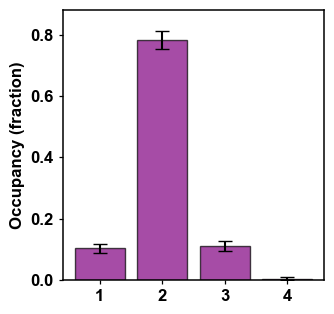


Mean fraction of time in each state: [0.10324734 0.78191088 0.11055544 0.00428634]
SD across traces:                    [0.01380399 0.02847815 0.01682985 0.00507   ]
Bootstrap SD of the mean:            [0.00315929 0.00648863 0.00380209 0.00114397]
95% CI (percentile):               lo=[0.09685781 0.76945857 0.10292961 0.00216804], hi=[0.10907986 0.79493069 0.11796548 0.00666569]


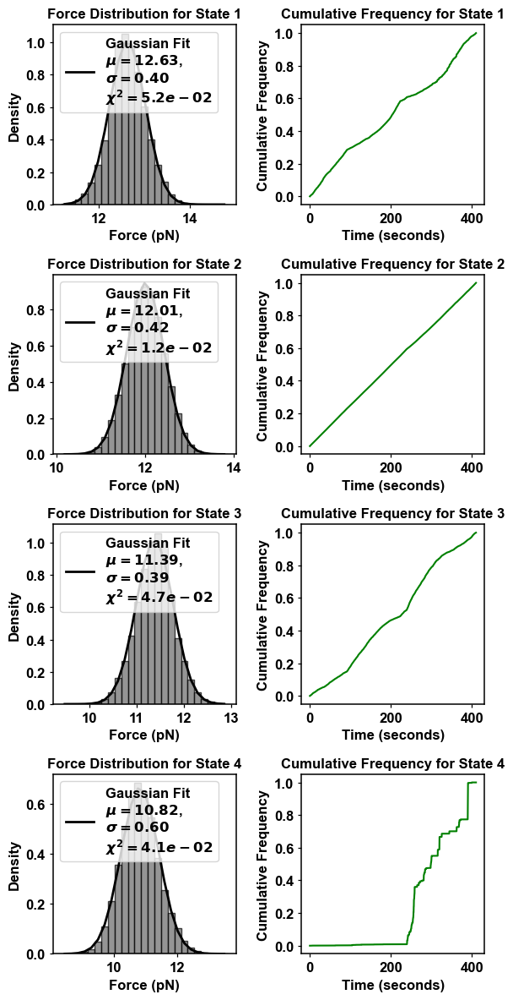

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_23386/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


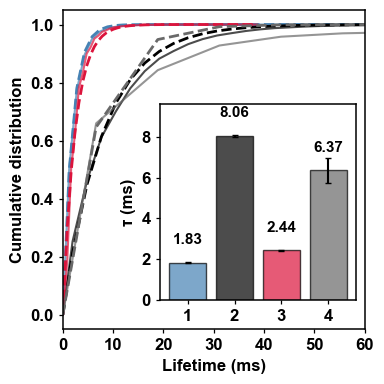

taus =  [1.8319794561493172, 8.05989711872467, 2.4357422841636294, 6.368067360520855]
tau errors =  [0.016266378727101627, 0.055413855395941125, 0.020769963239436, 0.6224500856088346]


In [ ]:
oc_traces = [oc_1, oc_2, oc_3, oc_4, oc_5, oc_6, oc_7, oc_8, oc_9, oc_10, oc_11, oc_12, oc_13, oc_14, oc_15, oc_17, oc_18, oc_19, oc_20]
oc_hmm_result = HMM_predict_force(oc_traces, "final_models/pdgfra_nterm_ctcfwt_cohesin_4_model.pkl")
oc_sorted_hs = plot_transition_and_HMM_force(oc_hmm_result, oc_traces, 4, '/publication.pdf')
oc_forcedf = plot_force_statistics(4, oc_sorted_hs[0], oc_hmm_result)
oc_results = plot_cdf_lifetime(4, oc_sorted_hs[0], oc_hmm_result, 0, 60,  '/publication.pdf')
oc_tp_results = compute_transition_probabilities_stats(oc_hmm_result, oc_traces, n_components=4, as_percent=False)

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/2041128995.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = copy(cm.get_cmap(cmap))


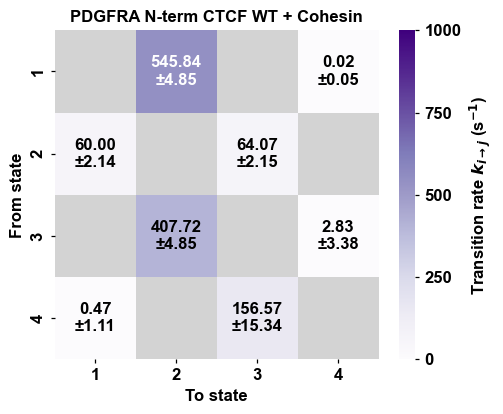

In [ ]:
# If all 4 states fit in the CDF step (taus for all states), just call:
k_mean, k_std = plot_transition_rates_with_errors(
    tp_stats=oc_tp_results,
    cdf_results=oc_results,
    n_components=4,
    state_indices=None,  # or omit
    savepath='/publication.pdf',
    title = 'PDGFRA N-term CTCF WT + Cohesin',
    cmap="Purples"
)


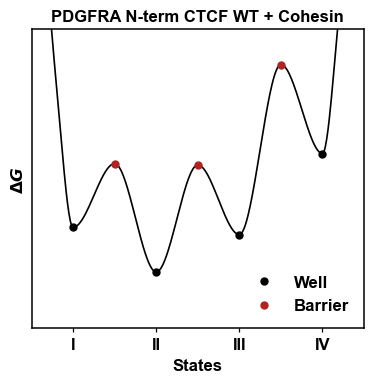

Using fixed Eyring ν = kBT/h = 6.212e+12 s^-1 at T=298.15 K
(Visualization only) constant barrier display shift applied: 20.000 kBT


In [ ]:
# lifetimes from HMM (uses self-transitions)
taus_ms = np.array(get_lifetime_taus(4, oc_sorted_hs[0], oc_hmm_result)['taus'])

# exit-conditioned branching
P_exit = oc_tp_results[0]

# rates
rate_matrix = build_rate_matrix(P_exit, taus_ms)

# plot with automatic prefactor (keeps barriers above wells)
plot_energy_landscape_from_rates(
    rate_matrix,
    title='PDGFRA N-term CTCF WT + Cohesin',
    savepath='/publication.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath='/publication.csv',
)


In [370]:
total_time_sec = total_recorded_time([oc_1, oc_2, oc_3, oc_4, oc_5, oc_6, oc_7, oc_8, oc_9, oc_10, oc_11, oc_12, oc_13, oc_14, oc_15, oc_17, oc_18, oc_19, oc_20])
print(f"Total recorded time: {total_time_sec:.2f} seconds")
print(f"Which is {total_time_sec/60:.2f} minutes")
print('----')
calculate_transitions_to_states(oc_hmm_result, 4)

Total recorded time: 3450.77 seconds
Which is 57.51 minutes
----
Total number of transitions between states (excluding self-transitions): 538958
Transitions to each state:
State 1: To = 130291
State 2: To = 268360
State 3: To = 139188
State 4: To = 1119


(538958, {0: 130291, 1: 268360, 2: 139188, 3: 1119})

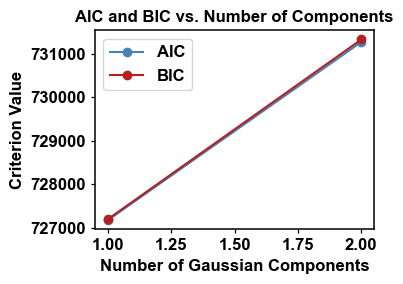

Best number of components (BIC): 1

Component fractions (out of total):
  Component 1: 1.0000 (100.0%)


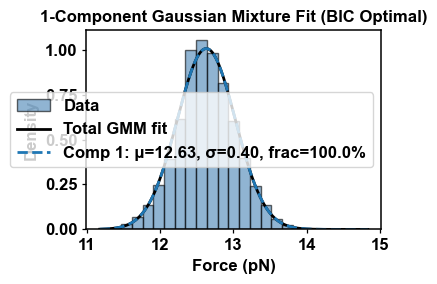

In [555]:
check_if_extra_state(oc_forcedf)

##### Base-pairs

Model loaded from final_models/bp_pdgfra_nterm_ctcfwt_cohesin_4_model.pkl
Fraction of time spent in each state: {'State 0': -0.4394266450057424, 'State 1': 1.9730712194100573, 'State 2': -0.5475004576417144, 'State 3': 0.013855883237399447}


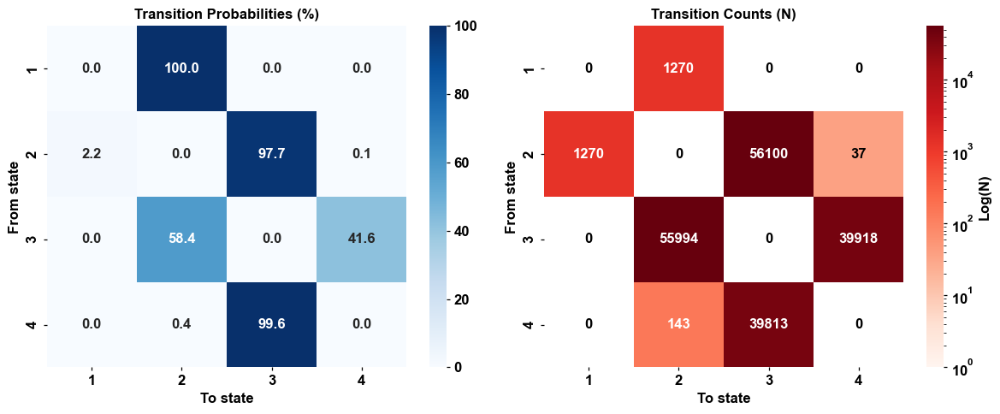

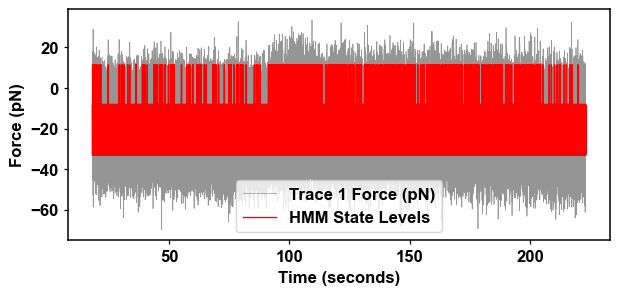

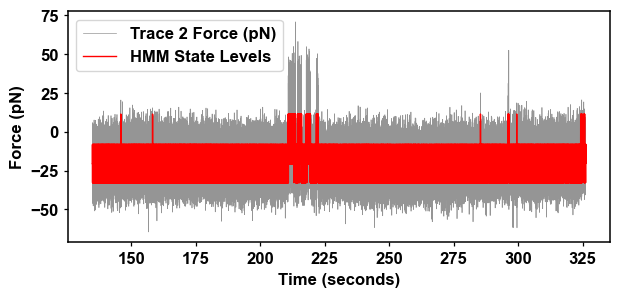

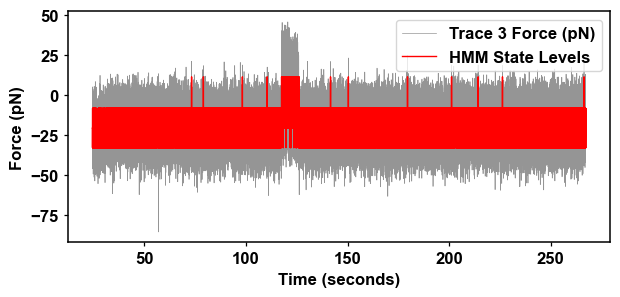

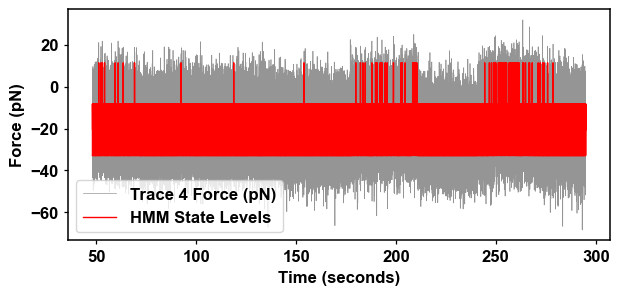

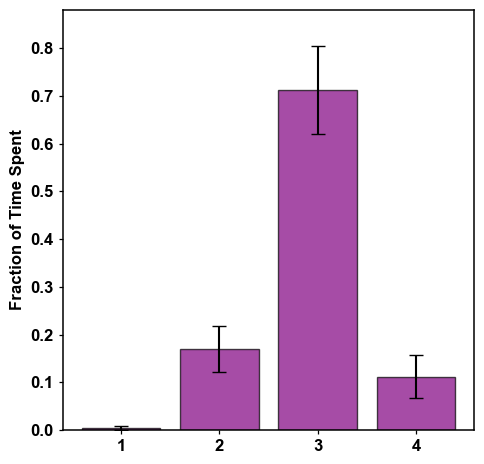

Mean fraction of time spent in each state: [0.00477446 0.17019989 0.71316335 0.11186231]
Standard deviation of time spent in each state: [0.00456192 0.04855726 0.0920973  0.04495215]


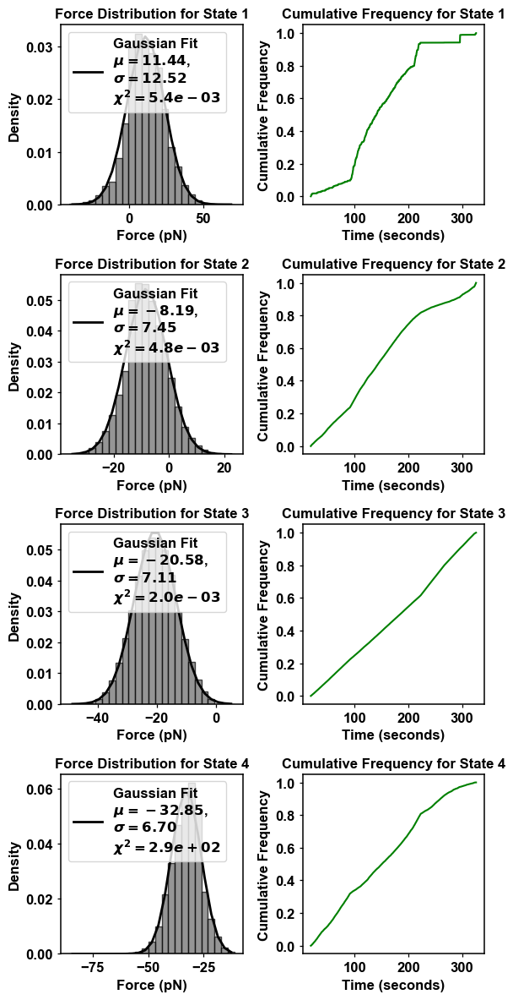

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_85948/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


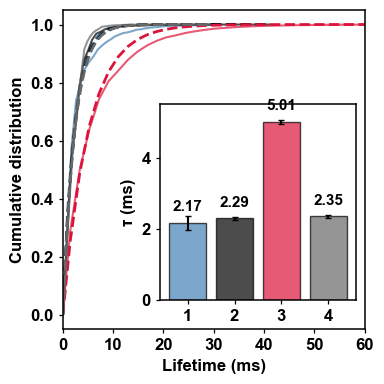

taus =  [2.1671391774236817, 2.2925405486766617, 5.010149154026387, 2.3483904789654457]
tau errors =  [0.20040843469911432, 0.031092984493774956, 0.0573191442216891, 0.03782512125912433]


In [ ]:
oc_traces = [oc1_bp, oc3_bp, oc4_bp, oc6_bp]
oc_hmm_result = HMM_predict_bp(oc_traces, "final_models/bp_pdgfra_nterm_ctcfwt_cohesin_4_model.pkl")
oc_sorted_hs = plot_transition_and_HMM_bp(oc_hmm_result, oc_traces, 4, '/publication.pdf')
oc_forcedf = plot_force_statistics(4, oc_sorted_hs[0], oc_hmm_result)
oc_results = plot_cdf_lifetime(4, oc_sorted_hs[0], oc_hmm_result, 0, 60,  '/publication.pdf')

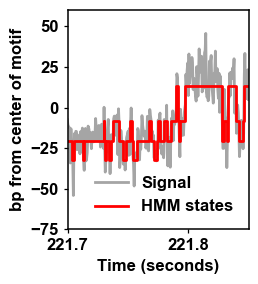

In [ ]:
plot_single_trace_HMM_step_bp(oc_hmm_result, oc3_bp, 4, '/publication.pdf', xmin=221.7, xmax=221.85)

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/838571160.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


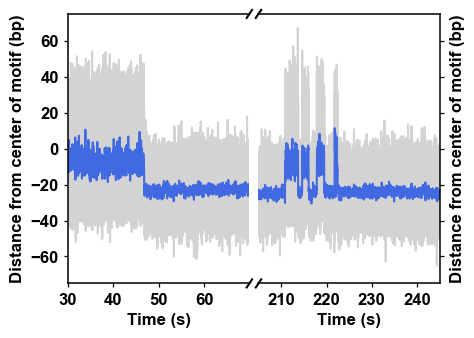

In [ ]:
# inputs you already have
window = 50
trace = oc2_bp_raw  # DataFrame with 'time' and 'j'

# Bin-average in non-overlapping windows of size `window`
n = (len(trace) // window) * window
time_avg = trace['time'].values[:n].reshape(-1, window).mean(axis=1)
j_avg    = trace['j'].values[:n].reshape(-1, window).mean(axis=1)

# Broken x-axis: two panels sharing y
fig, (ax1, ax2) = plt.subplots(
    1, 2, sharey=True, figsize=(4.8, 3.5),
    gridspec_kw={'width_ratios': [1, 1], 'wspace': 0.05}
)

# Left panel: 30–60 s
ax1.plot(trace['time'], trace['j'], alpha=1, color='lightgrey', label='Raw (500 µs)')
ax1.plot(time_avg, j_avg, color='royalblue', label='Rolling window (50)')
ax1.set_xlim(30, 70)

# Right panel: 200–250 s
ax2.plot(trace['time'], trace['j'], alpha=1, color='lightgrey')
ax2.plot(time_avg, j_avg, color='royalblue')
ax2.set_xlim(205, 245)

# Shared y settings
for ax in (ax1, ax2):
    ax.set_ylim(-75, 75)
    ax.set_ylabel('Distance from center of motif (bp)')
    ax.set_xlabel('Time (s)')

# Clean up spines between the two axes
ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position('right')
ax1.yaxis.tick_left()

# Diagonal break marks
d = .015  # size of break marks
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot((1-d, 1+d), (-d, +d), **kwargs)  # top-right of left axis
ax1.plot((1-d, 1+d), (1-d, 1+d), **kwargs)  # bottom-right of left axis

kwargs.update(transform=ax2.transAxes)  # switch to the right axis
ax2.plot((-d, +d), (-d, +d), **kwargs)  # top-left of right axis
ax2.plot((-d, +d), (1-d, 1+d), **kwargs)  # bottom-left of right axis

# Ticks (optional: adjust to taste)
ax1.set_xticks([30, 40, 50, 60])
ax2.set_xticks([210, 220, 230, 240])

# Single legend
handles, labels = ax1.get_legend_handles_labels()
#fig.legend(handles, labels, frameon=False, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 1.02))

plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()


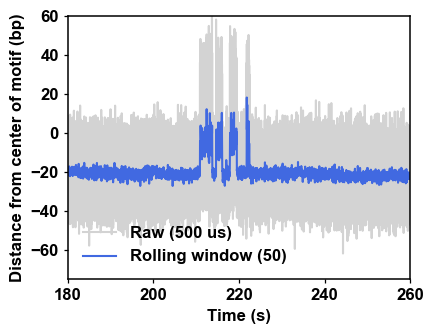

In [ ]:
window = 50
trace = oc3_bp
fig, ax = plt.subplots(figsize=(4.5,3.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = trace['time'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)
j_avg = trace['bp_corrected'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(trace['time'], trace['bp_corrected'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='royalblue')
plt.xlabel('Time (s)')
plt.ylabel('Distance from center of motif (bp)')
plt.legend(frameon=False)
plt.xlim(180, 260)
plt.ylim(-75, 60)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()


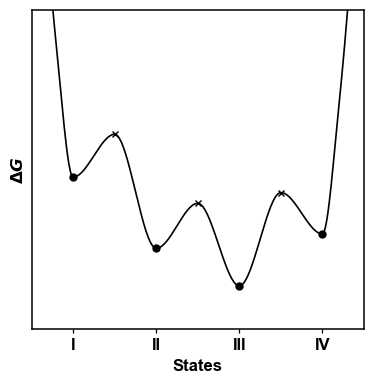

In [ ]:
lifetimes = np.array(get_lifetime_taus(4, p_sorted_hs[0], p_hmm_result)['taus'])
transition_probabilities = calculate_transition_probabilities(p_hmm_result, 4)

plot_energy_landscape(
    lifetimes,
    transition_probabilities,
    savepath='/publication.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath = '/publication.csv'
)

State 1: mu = -32.848 ± 6.701 bp, N = 188728
State 2: mu = -20.579 ± 7.110 bp, N = 1201162
State 3: mu = -8.190 ± 7.447 bp, N = 288988
State 4: mu = 11.436 ± 12.524 bp, N = 7313


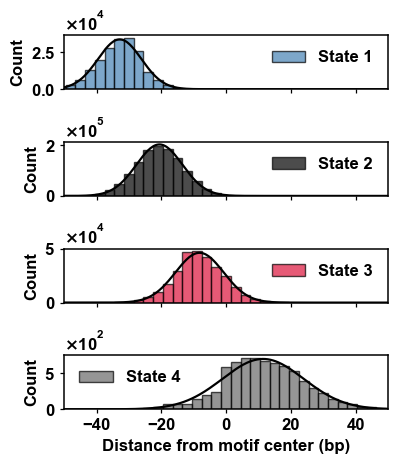

In [100]:
plot_rolling_force_distribution_bp(oc_hmm_result, [oc1_bp, oc3_bp, oc4_bp, oc6_bp], 4, window_size=1)

#### CTCF WT w/ Cohesin & PDS5A

##### Force

In [ ]:
pc_traces = [pc_7, pc_8, pc_9, pc_10, pc_11, pc_12, pc_13, pc_14, pc_16]
pc_hmm_result = HMM_predict_force(pc_traces,"final_models/pdgfra_nterm_ctcfwt_cohesin_pds5a_4_model.pkl")
pc_sorted_hs = plot_transition_and_HMM_force(pc_hmm_result, pc_traces, 4, '/publication.pdf')
pc_forcedf = plot_force_statistics(4, pc_sorted_hs[0], pc_hmm_result)
pc_results = plot_cdf_lifetime(4, pc_sorted_hs[0], pc_hmm_result, 0, 60,  '/publication.pdf')
pc_tp_results = compute_transition_probabilities_stats(pc_hmm_result, pc_traces, n_components=4, as_percent=False)

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/2041128995.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = copy(cm.get_cmap(cmap))


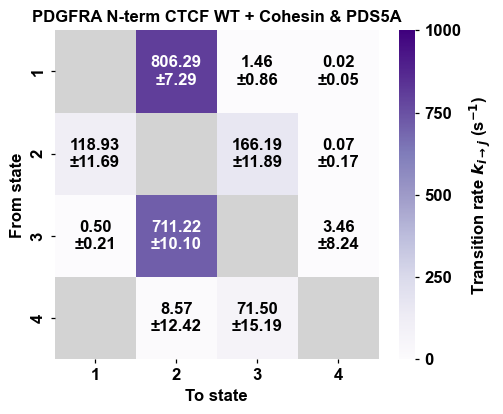

In [562]:
# If all 4 states fit in the CDF step (taus for all states), just call:
k_mean, k_std = plot_transition_rates_with_errors(
    tp_stats=pc_tp_results,
    cdf_results=pc_results,
    n_components=4,
    state_indices=None,  # or omit
    savepath="/Users/emily/Desktop/pdgfra_ctcfwt_cohesin_pds5a_nterm/transition_rates_mean_std.pdf",
    title = 'PDGFRA N-term CTCF WT + Cohesin & PDS5A',
    cmap="Purples"
)


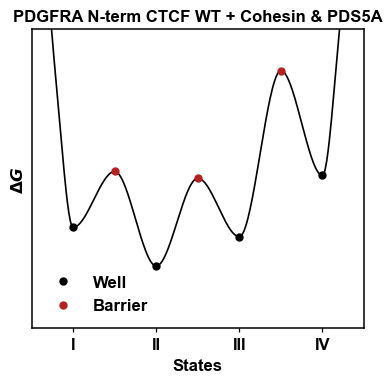

Using fixed Eyring ν = kBT/h = 6.212e+12 s^-1 at T=298.15 K
(Visualization only) constant barrier display shift applied: 20.000 kBT


In [83]:
# lifetimes from HMM (uses self-transitions)
taus_ms = np.array(get_lifetime_taus(4, pc_sorted_hs[0], pc_hmm_result)['taus'])

# exit-conditioned branching
P_exit = pc_tp_results[0]

# rates
rate_matrix = build_rate_matrix(P_exit, taus_ms)

# plot with automatic prefactor (keeps barriers above wells)
plot_energy_landscape_from_rates(
    rate_matrix,
    title='PDGFRA N-term CTCF WT + Cohesin & PDS5A',
    savepath='/Users/emily/Desktop/pdgfra_ctcfwt_cohesin_pds5a_nterm/energy_landscape.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath='/Users/emily/Desktop/pdgfra_ctcfwt_cohesin_pds5a_nterm/energies.csv',
)


In [372]:
total_time_sec = total_recorded_time([pc_7, pc_8, pc_9, pc_10, pc_11, pc_12, pc_13, pc_14, pc_16])
print(f"Total recorded time: {total_time_sec:.2f} seconds")
print(f"Which is {total_time_sec/60:.2f} minutes")
print('----')
calculate_transitions_to_states(pc_hmm_result, 4)

Total recorded time: 1430.80 seconds
Which is 23.85 minutes
----
Total number of transitions between states (excluding self-transitions): 544497
Transitions to each state:
State 1: To = 114433
State 2: To = 271307
State 3: To = 157872
State 4: To = 885


(544497, {0: 114433, 1: 271307, 2: 157872, 3: 885})

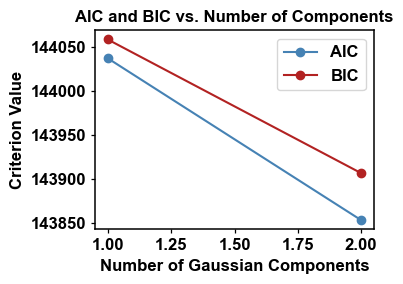

Best number of components (BIC): 2

Component stats:
  Component 1: fraction=0.5373 (53.7%), N=167349
  Component 2: fraction=0.4627 (46.3%), N=144136


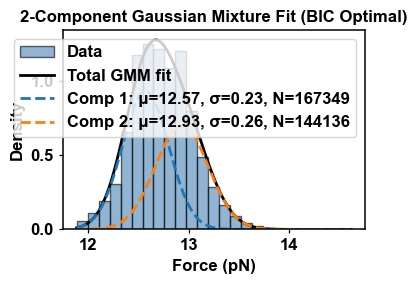

In [62]:
check_if_extra_state(pc_forcedf)

##### Base-pairs

Model loaded from final_models/bp_pdgfra_nterm_ctcfwt_cohesin_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.2839427918971828, 'State 1': 0.4813837621341304, 'State 2': 0.22946491418726772, 'State 3': 0.005208531781419083}


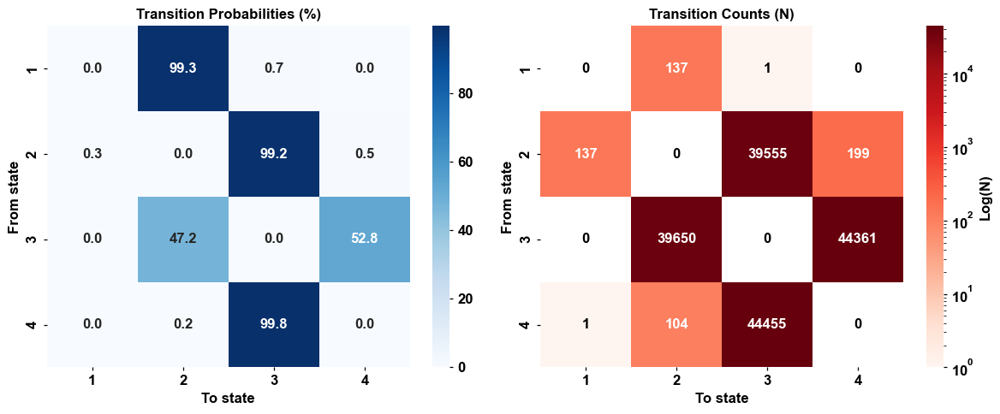

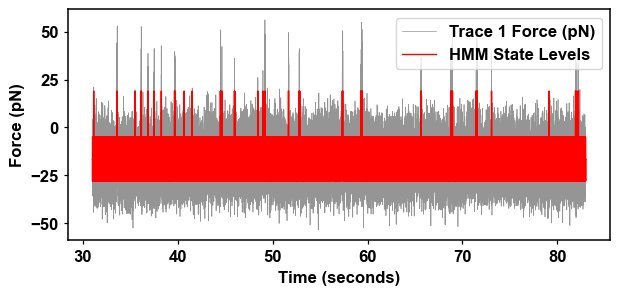

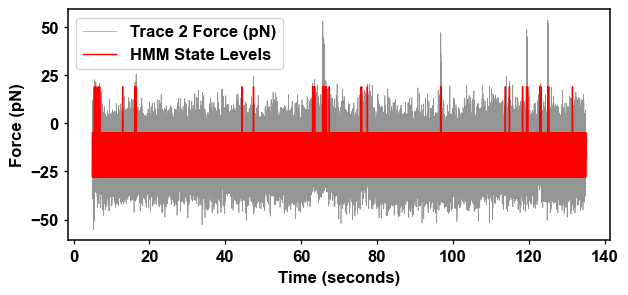

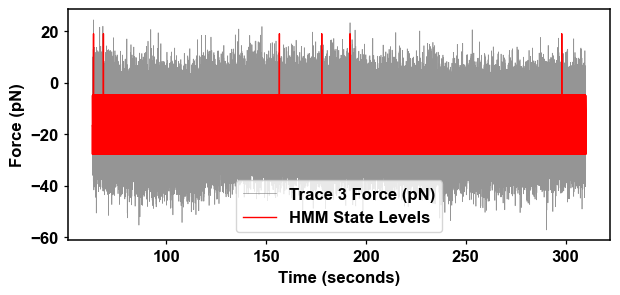

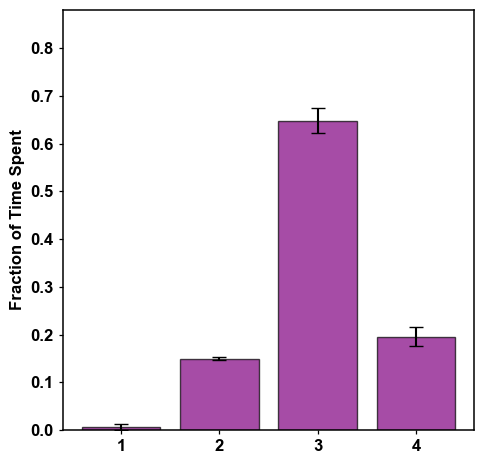

Mean fraction of time spent in each state: [0.00657355 0.14970733 0.64811979 0.19559934]
Standard deviation of time spent in each state: [0.00587513 0.00311053 0.02605469 0.01953261]


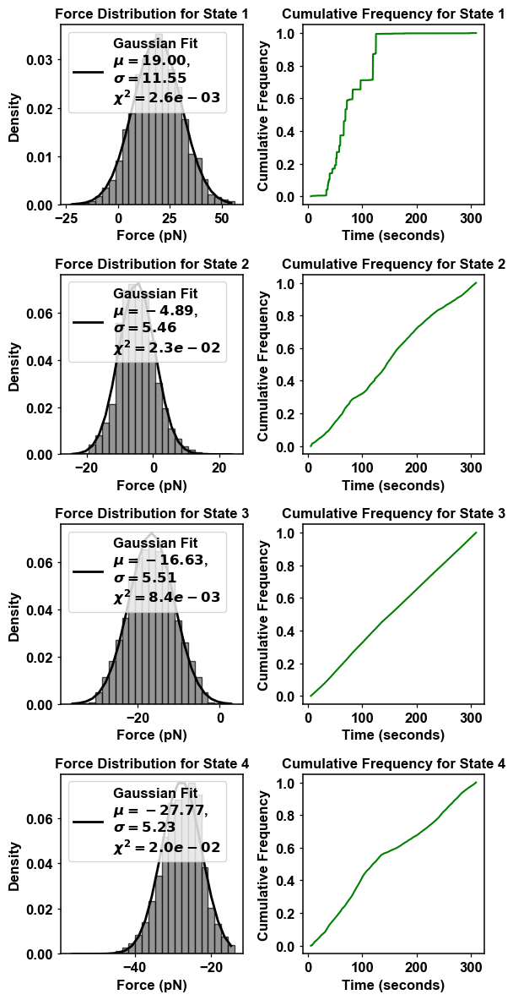

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_85948/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


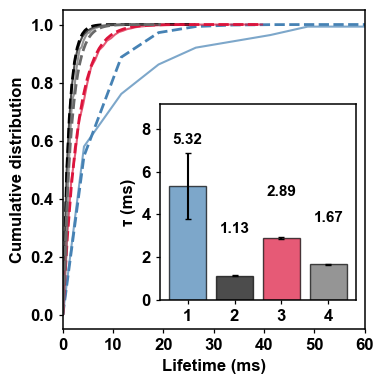

taus =  [5.31652540622243, 1.1304499622766437, 2.8905203606476113, 1.6735991031121509]
tau errors =  [1.5380153916992514, 0.01769487962320524, 0.034540979774722105, 0.02490652096412518]


In [ ]:
p_traces = [pc_11_bp, pc_13_bp, pc_14_bp]
p_hmm_result = HMM_predict_bp(p_traces, "final_models/bp_pdgfra_nterm_ctcfwt_cohesin_pds5a_4_model.pkl")
p_sorted_hs = plot_transition_and_HMM_bp(p_hmm_result, p_traces, 4, '/publication.pdf')
p_forcedf = plot_force_statistics(4, p_sorted_hs[0], p_hmm_result)
p_results = plot_cdf_lifetime(4, p_sorted_hs[0], p_hmm_result, 0, 60,  '/publication.pdf')

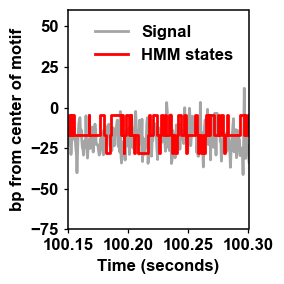

In [ ]:
plot_single_trace_HMM_step_bp(p_hmm_result, pc_14_bp, 4, '/publication.pdf', xmin=100.15, xmax=100.30)

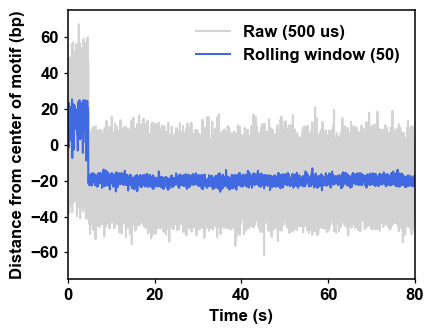

In [ ]:
window = 50
trace = pc_11_bp_raw
fig, ax = plt.subplots(figsize=(4.5,3.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = trace['time'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)
j_avg = trace['j'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(trace['time'], trace['j'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='royalblue')
plt.xlabel('Time (s)')
plt.ylabel('Distance from center of motif (bp)')
plt.legend(frameon=False)
plt.xlim(0, 80)
plt.ylim(-75, 75)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()


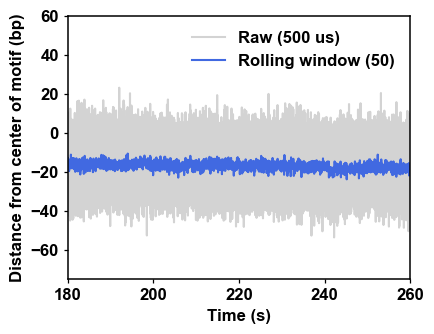

In [ ]:
window = 50
trace = pc_14_bp
fig, ax = plt.subplots(figsize=(4.5,3.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = trace['time'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)
j_avg = trace['bp_corrected'].values[:len(trace)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(trace['time'], trace['bp_corrected'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='royalblue')
plt.xlabel('Time (s)')
plt.ylabel('Distance from center of motif (bp)')
plt.legend(frameon=False)
plt.xlim(180, 260)
plt.ylim(-75, 60)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()


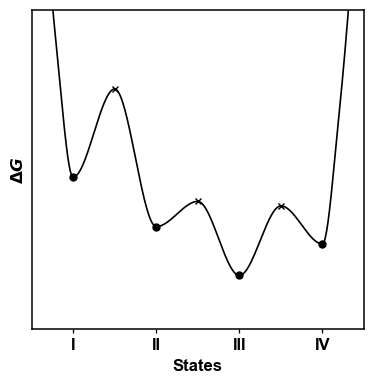

In [ ]:
lifetimes = np.array(get_lifetime_taus(4, p_sorted_hs[0], p_hmm_result)['taus'])
transition_probabilities = calculate_transition_probabilities(p_hmm_result, 4)

plot_energy_landscape(
    lifetimes,
    transition_probabilities,
    savepath='/publication.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath = '/publication.csv'
)

State 1: mu = -27.768 ± 5.227 bp, N = 148350
State 2: mu = -16.629 ± 5.514 bp, N = 526857
State 3: mu = -4.892 ± 5.461 bp, N = 120276
State 4: mu = 19.003 ± 11.548 bp, N = 2645


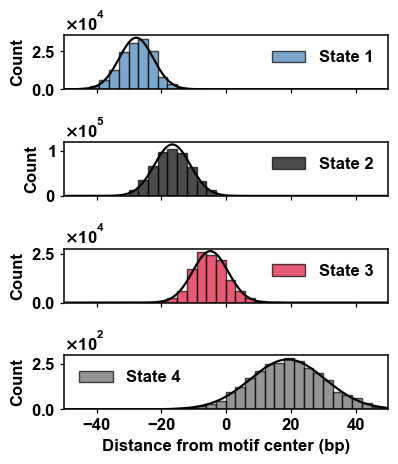

In [103]:
plot_rolling_force_distribution_bp(p_hmm_result, [pc_11_bp, pc_13_bp, pc_14_bp], 4, window_size=1)

### PDGFRA C-term

#### CTCF WT

##### Force

Model loaded from final_models/pdgfra_cterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': 2.725427593653792, 'State 1': -2.9134679238855052, 'State 2': -0.5473575152588581, 'State 3': 1.735397845490571}


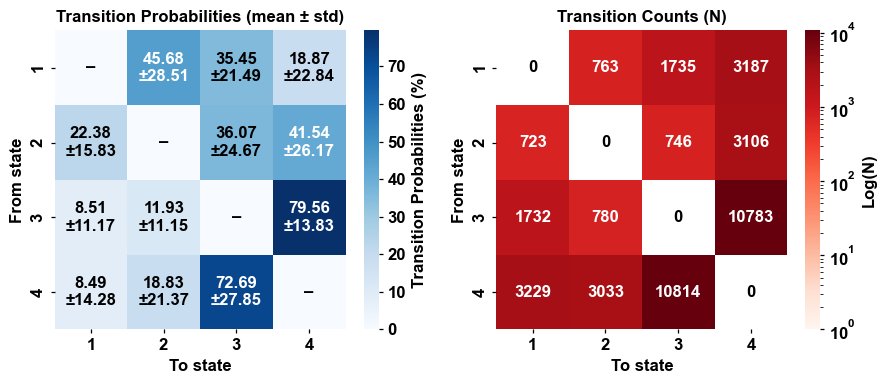


=== Per-trace occupancies (fractions) ===
           state_1  state_2  state_3  state_4
trace_001   0.3766   0.2090   0.1372   0.2772
trace_002   0.0134   0.3298   0.4711   0.1858
trace_003   0.0862   0.7378   0.0905   0.0854
trace_004   0.0007   0.4472   0.3980   0.1541
trace_005   0.0336   0.6007   0.2140   0.1516

=== Occupancy (per state) ===
state  mean(frac)  SD_across_traces  boot_SD_of_mean  CI_lo  CI_hi
    1      0.1021             0.1403           0.0629  0.0124  0.2433
    2      0.4649             0.1881           0.0837  0.3050  0.6281
    3      0.2622             0.1480           0.0648  0.1339  0.3904
    4      0.1708             0.0624           0.0281  0.1192  0.2275


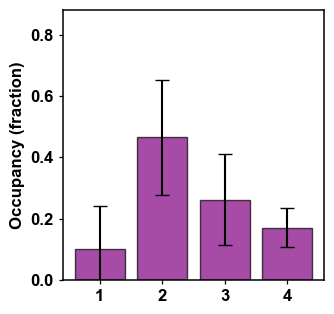


Mean fraction of time in each state: [0.1020955  0.46490365 0.26216705 0.17083381]
SD across traces:                    [0.14030068 0.18812727 0.14796807 0.06242311]
Bootstrap SD of the mean:            [0.06291237 0.08365408 0.06478562 0.02805479]
95% CI (percentile):               lo=[0.01235305 0.30496046 0.13390764 0.11923479], hi=[0.24332551 0.62814884 0.39042646 0.22748276]


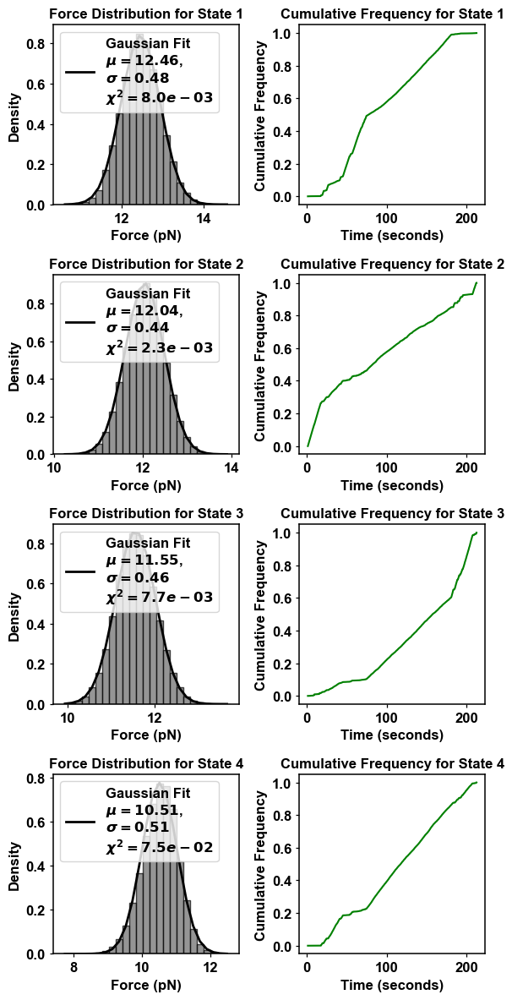

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_23386/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


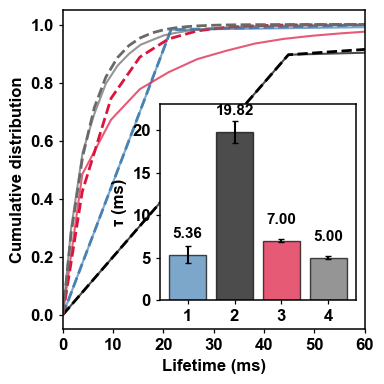

taus =  [5.357752339698724, 19.8178312384778, 6.997489442962915, 5.002619960495398]
tau errors =  [0.9868290918469901, 1.3138675262484112, 0.2149965382728954, 0.1324916738609894]


In [ ]:
ct_traces = [pc1, pc2, pc3, pc4, pc5]
ct_hmm_result = HMM_predict_force(ct_traces, "final_models/pdgfra_cterm_ctcfwt_4_model.pkl")
ct_sorted_hs = plot_transition_and_HMM_force(ct_hmm_result, ct_traces, 4, '/publication.pdf')
ct_forcedf = plot_force_statistics(4, ct_sorted_hs[0], ct_hmm_result)
ct_results = plot_cdf_lifetime(4, ct_sorted_hs[0], ct_hmm_result, 0, 60,  '/publication.pdf')
ct_tp_results = compute_transition_probabilities_stats(ct_hmm_result, ct_traces, n_components=4, as_percent=False)

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/2041128995.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = copy(cm.get_cmap(cmap))


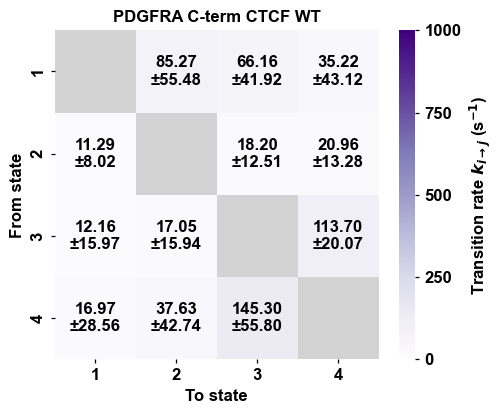

In [589]:
# If all 4 states fit in the CDF step (taus for all states), just call:
k_mean, k_std = plot_transition_rates_with_errors(
    tp_stats=ct_tp_results,
    cdf_results=ct_results,
    n_components=4,
    state_indices=None,  # or omit
    savepath="/Users/emily/Desktop/pdgfra_ctcfwt_cterm/transition_rates_mean_std.pdf",
    title = 'PDGFRA C-term CTCF WT',
    cmap="Purples"
)


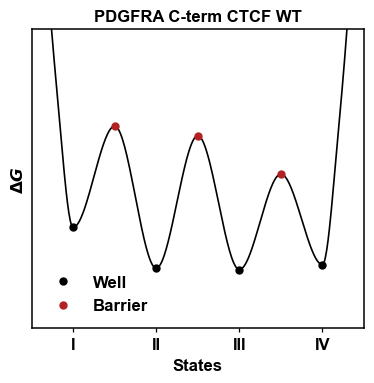

Using fixed Eyring ν = kBT/h = 6.212e+12 s^-1 at T=298.15 K
(Visualization only) constant barrier display shift applied: 20.000 kBT


In [85]:
# lifetimes from HMM (uses self-transitions)
taus_ms = np.array(get_lifetime_taus(4, ct_sorted_hs[0], ct_hmm_result)['taus'])

# exit-conditioned branching
P_exit = ct_tp_results[0]

# rates
rate_matrix = build_rate_matrix(P_exit, taus_ms)

# plot with automatic prefactor (keeps barriers above wells)
plot_energy_landscape_from_rates(
    rate_matrix,
    title='PDGFRA C-term CTCF WT',
    savepath='/Users/emily/Desktop/pdgfra_ctcfwt_cterm/energy_landscape.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath='/Users/emily/Desktop/pdgfra_ctcfwt_cterm/energies.csv',
)


##### Base-pairs

Model loaded from models/pdgfra_cterm_bp_4states.pkl
Fraction of time spent in each state: {'State 0': -2.859471408199558, 'State 1': 1.0406668976844269, 'State 2': 1.8979066072604076, 'State 3': 0.9208979032547232}


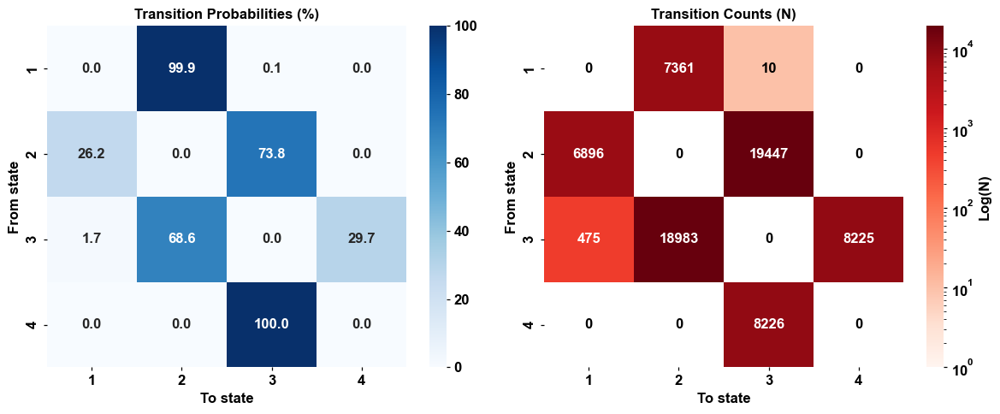

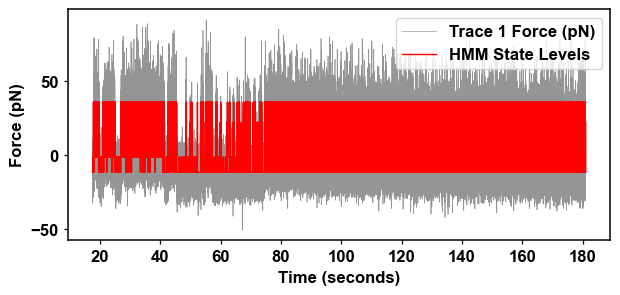

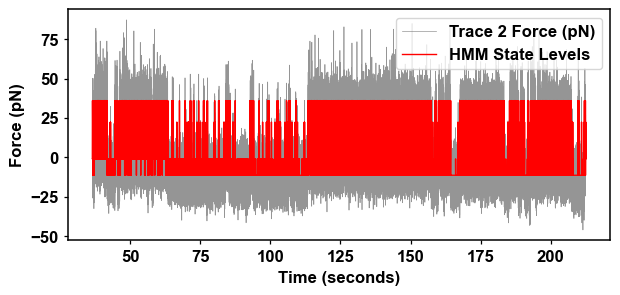

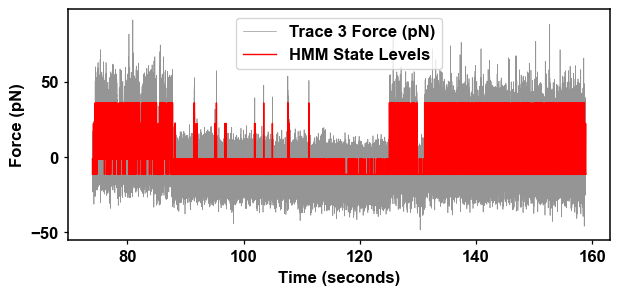

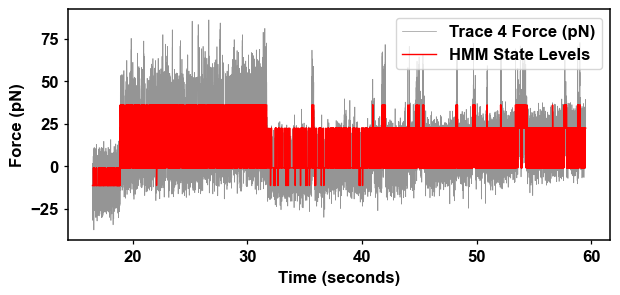

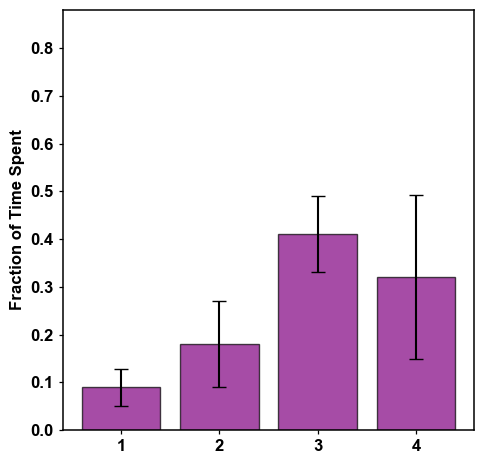

Mean fraction of time spent in each state: [0.08954864 0.17996638 0.41065275 0.31983224]
Standard deviation of time spent in each state: [0.03912874 0.0907242  0.07962087 0.17196957]


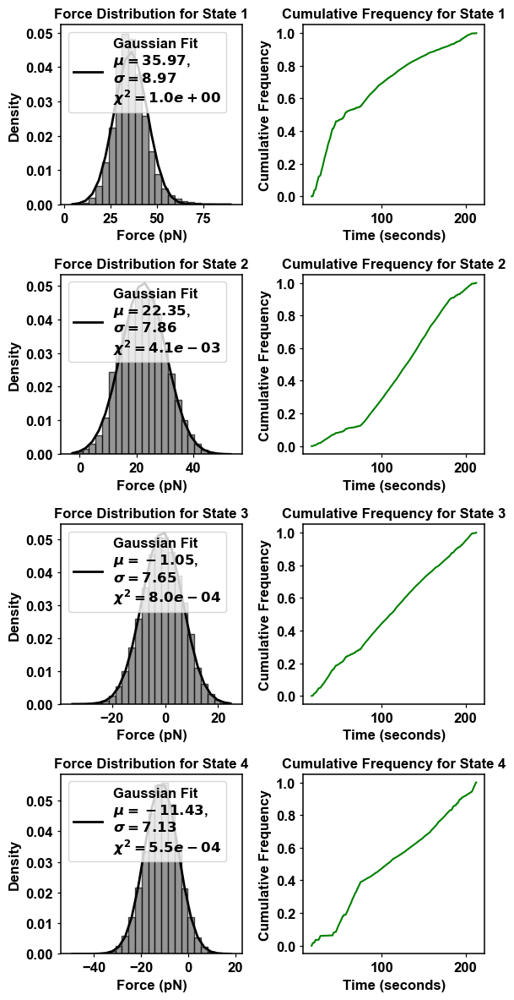

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_85948/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


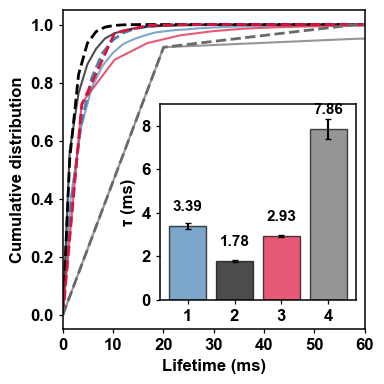

taus =  [3.393673555766058, 1.7788075144950886, 2.926754013149109, 7.86261574306237]
tau errors =  [0.13533662192590298, 0.03578079800253441, 0.057436547879720926, 0.4526445596188374]


In [ ]:
ct_traces = [pc1_bp, pc2_bp, pc3_bp, pc4_bp]
ct_hmm_result = HMM_predict_bp(ct_traces, 'bp_pdgfra_cterm_ctcfwt_4_model.pkl')
ct_sorted_hs = plot_transition_and_HMM_bp(ct_hmm_result, ct_traces, 4, '/publication.pdf')
ct_forcedf = plot_force_statistics(4, ct_sorted_hs[0], ct_hmm_result)
ct_results = plot_cdf_lifetime(4, ct_sorted_hs[0], ct_hmm_result, 0, 60,  '/publication.pdf')

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.stats import norm
from matplotlib.ticker import ScalarFormatter

def plot_rolling_force_distribution_bp(
    hmm_result,
    traces,
    n_components,
    window_size=0,
    binwidth=3,
    save_combined='/publication.pdf',
    xlim=(-50, 50),
    colors=('steelblue', 'black', 'crimson', 'dimgrey')
):
    """
    Plot stacked histograms (one row per hidden state) of bp distributions after
    applying a rolling average to 'bp_corrected'. All share the same x-axis.
    Y-axis is COUNT (scientific notation).
    States are sorted by increasing mean bp value of the ORIGINAL data.
    The plotted data are MIRRORED around 0 (x -> -x), but state order/colors stay the same.
    """
    # Unpack
    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    combined_forces_orig = []          # original (for sorting)
    combined_hidden_states = []
    start_idx = 0

    for trace_index, trace in enumerate(traces):
      trace_length = len(trace)
      trace_time = all_time_data[trace_index]
      trace_force = trace['bp_corrected'].values
      trace_hidden_states = hidden_states[start_idx:start_idx + trace_length]

      df_trace = pd.DataFrame({
          'time': trace_time,
          'bp_corrected': trace_force,
          'hidden_states': trace_hidden_states
      })

      # Rolling avg
      df_trace = apply_rolling_average_bp(df_trace, window_size)

      # Keep ORIGINAL values for ordering
      combined_forces_orig.extend(df_trace['bp_corrected'].values)
      combined_hidden_states.extend(df_trace['hidden_states'].values)

      start_idx += trace_length

    combined_forces_orig = np.asarray(combined_forces_orig)
    combined_hidden_states = np.asarray(combined_hidden_states)

    # ---- KEEP ORIGINAL ORDERING/COLORS/LABELS by sorting on ORIGINAL data ----
    state_means_orig = np.array([
        combined_forces_orig[combined_hidden_states == i].mean()
        if np.any(combined_hidden_states == i) else np.nan
        for i in range(n_components)
    ])
    sorted_indices = np.argsort(state_means_orig)
    sorted_hidden_states = np.zeros_like(combined_hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[combined_hidden_states == old_label] = new_label

    # ---- MIRROR THE DATA AROUND ZERO FOR PLOTTING ----
    combined_forces_flipped = -combined_forces_orig

    # Common bins (based on flipped data; equivalent width and coverage)
    global_min = np.nanmin(combined_forces_flipped)
    global_max = np.nanmax(combined_forces_flipped)
    left = min(global_min, xlim[0])
    right = max(global_max, xlim[1])
    bins = np.arange(left, right + binwidth, binwidth)

    # --- Stacked subplot figure ---
    fig, axes = plt.subplots(n_components, 1, figsize=(4, 1.2*n_components), sharex=True)
    if n_components == 1:
        axes = [axes]

    for i, ax in enumerate(axes):
        # Use the *same* state mapping (sorted on original), but plot the flipped values
        state_mask = (sorted_hidden_states == i)
        state_forces = combined_forces_flipped[state_mask]
        N = len(state_forces)

        if N == 0:
            ax.set_title(f"State {i+1}(N=0)")
            ax.set_ylabel('Count')
            continue

        # Histogram
        counts, edges, _ = ax.hist(
            state_forces,
            bins=bins,
            color=colors[i % len(colors)],
            edgecolor='black',
            alpha=0.7,
            density=False,
            label=f'State {i+1}'#(N={N})'
        )

        # Gaussian fit scaled to counts (on flipped data, so μ shows flipped sign)
        mu, std = norm.fit(state_forces)
        x_vals = np.linspace(edges[0], edges[-1], 400)
        y_gauss = norm.pdf(x_vals, mu, std) * N * binwidth
        ax.plot(x_vals, y_gauss, lw=1.6, color='black')

        # Format
        ax.set_ylabel('Count')
        ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
        #ax.set_title(f"State {i+1}: μ={mu:.2f} bp, σ={std:.2f} bp, N={N}")
        ax.legend(frameon=False)

        print(f"State {i+1}: mu = {mu:.3f} ± {std:.3f} bp, N = {N}")

    axes[-1].set_xlabel('Distance from motif center (bp)')
    axes[-1].set_xlim(*xlim)  # keep same x limits; data are mirrored around 0

    plt.tight_layout()
    plt.savefig(save_combined, format='pdf')
    plt.show()


State 1: mu = 11.425 ± 7.126 bp, N = 318378
State 2: mu = 1.045 ± 7.653 bp, N = 345360
State 3: mu = -22.352 ± 7.860 bp, N = 150091
State 4: mu = -35.972 ± 8.967 bp, N = 73096


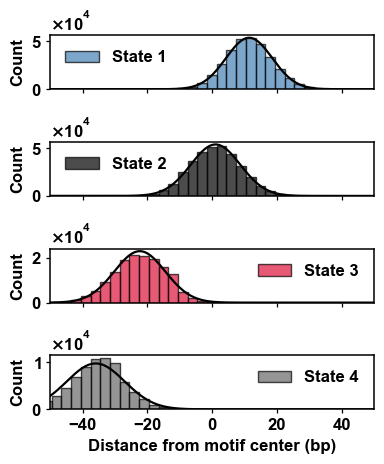

In [89]:
plot_rolling_force_distribution_bp(ct_hmm_result, [pc1_bp, pc2_bp, pc3_bp, pc4_bp], 4, window_size=1)

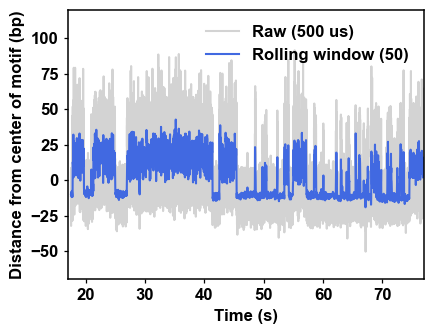

In [ ]:
window = 50
fig, ax = plt.subplots(figsize=(4.5,3.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = pc1_bp['time'].values[:len(pc1_bp)//window*window].reshape(-1, window).mean(axis=1)
j_avg = pc1_bp['bp_corrected'].values[:len(pc1_bp)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(pc1_bp['time'], pc1_bp['bp_corrected'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='royalblue')
plt.xlabel('Time (s)')
plt.ylabel('Distance from center of motif (bp)')
plt.legend(frameon=False)
plt.xlim(17, 77)
plt.ylim(-70, 120)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()


#### CTCF WT Nucleosome

##### Force

Model loaded from models/ic_nuc_4model.pkl
Fraction of time spent in each state: {'State 0': -0.171219266907268, 'State 1': 0.28131257966876905, 'State 2': 0.2106803131504536, 'State 3': 0.6792263740880453}


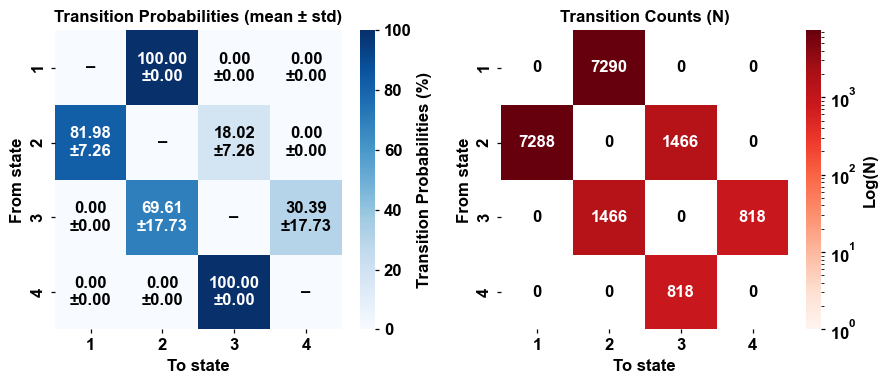


=== Per-trace occupancies (fractions) ===
           state_1  state_2  state_3  state_4
trace_001   0.1504   0.6986   0.1104   0.0406
trace_002   0.0897   0.7878   0.1055   0.0170
trace_003   0.1446   0.6950   0.1059   0.0545
trace_004   0.2432   0.5918   0.0426   0.1224
trace_005   0.1525   0.6985   0.1197   0.0293
trace_006   0.1271   0.7995   0.0286   0.0448
trace_007   0.4311   0.3674   0.0367   0.1648
trace_008   0.0563   0.8843   0.0592   0.0002
trace_009   0.1110   0.7195   0.1542   0.0153

=== Occupancy (per state) ===
state  mean(frac)  SD_across_traces  boot_SD_of_mean  CI_lo  CI_hi
    1      0.1673             0.1052           0.0341  0.1103  0.2412
    2      0.6936             0.1390           0.0451  0.5986  0.7734
    3      0.0848             0.0415           0.0139  0.0581  0.1119
    4      0.0543             0.0512           0.0166  0.0245  0.0897


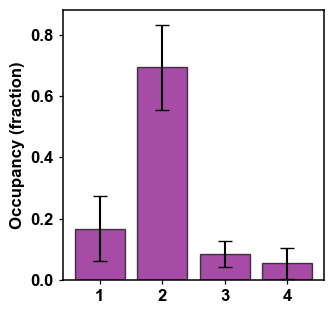


Mean fraction of time in each state: [0.16731238 0.69361168 0.08475117 0.05432477]
SD across traces:                    [0.10515239 0.13903622 0.04145271 0.05118769]
Bootstrap SD of the mean:            [0.03411072 0.04514623 0.01387376 0.01662445]
95% CI (percentile):               lo=[0.11027307 0.59864767 0.05810587 0.02448057], hi=[0.24120372 0.77341214 0.11194508 0.08966985]


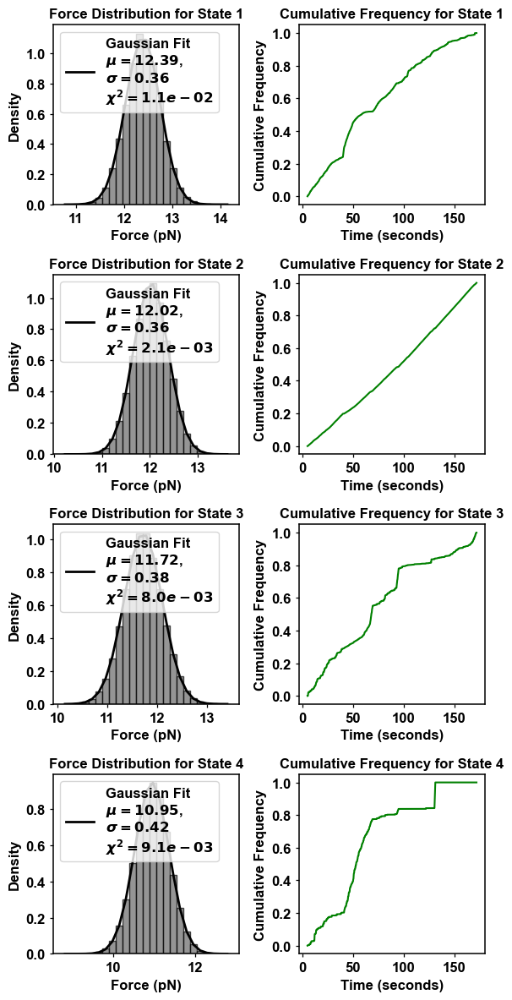

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_23386/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


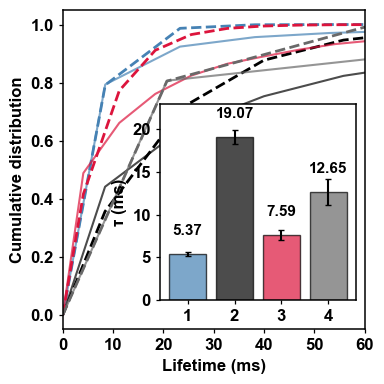

taus =  [5.374572185118311, 19.06515188790038, 7.58552791481111, 12.652949607878803]
tau errors =  [0.21567855586695583, 0.7658362300683508, 0.5860039286255522, 1.546244293610871]


In [ ]:
n_traces = [n1c, n2c, n3c, n4c, n5c, n6c, n7c, n8c, n9c]
n_hmm_result = HMM_predict_force(n_traces, 'pdgfra_nuc_cterm_ctcfwt_4_model.pkl')
n_sorted_hs = plot_transition_and_HMM_force(n_hmm_result, n_traces, 4, '/publication.pdf')
n_forcedf = plot_force_statistics(4, n_sorted_hs[0], n_hmm_result)
n_results = plot_cdf_lifetime(4, n_sorted_hs[0], n_hmm_result, 0, 60,  '/publication.pdf')
n_tp_results = compute_transition_probabilities_stats(n_hmm_result, n_traces, n_components=4, as_percent=False)

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/2041128995.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = copy(cm.get_cmap(cmap))


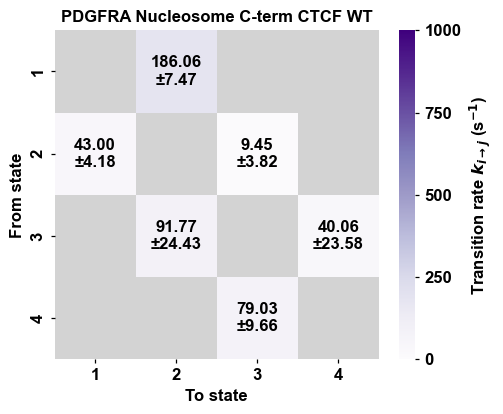

In [ ]:
# If all 4 states fit in the CDF step (taus for all states), just call:
k_mean, k_std = plot_transition_rates_with_errors(
    tp_stats=n_tp_results,
    cdf_results=n_results,
    n_components=4,
    state_indices=None,  # or omit
    savepath='/publication.pdf',
    title = 'PDGFRA Nucleosome C-term CTCF WT',
    cmap="Purples"
)


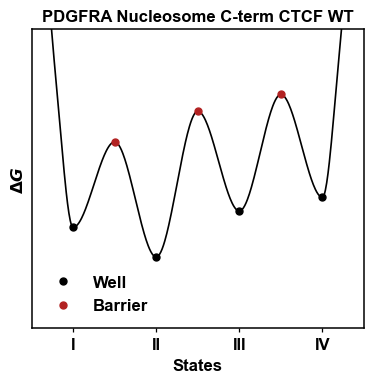

Using fixed Eyring ν = kBT/h = 6.212e+12 s^-1 at T=298.15 K
(Visualization only) constant barrier display shift applied: 20.000 kBT


In [ ]:
# lifetimes from HMM (uses self-transitions)
taus_ms = np.array(get_lifetime_taus(4, n_sorted_hs[0], n_hmm_result)['taus'])

# exit-conditioned branching
P_exit = n_tp_results[0]

# rates
rate_matrix = build_rate_matrix(P_exit, taus_ms)

# plot with automatic prefactor (keeps barriers above wells)
plot_energy_landscape_from_rates(
    rate_matrix,
    title='PDGFRA Nucleosome C-term CTCF WT',
    savepath='/publication.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath='/publication.csv',
)


##### Base-pairs

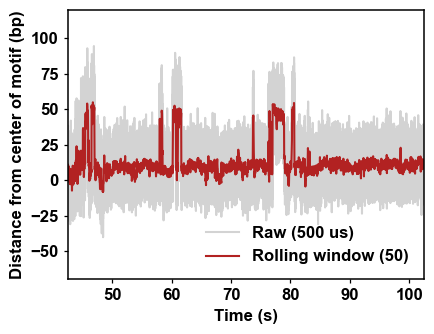

In [ ]:
window = 50
fig, ax = plt.subplots(figsize=(4.5,3.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = n6_bp['time'].values[:len(n6_bp)//window*window].reshape(-1, window).mean(axis=1)
j_avg = n6_bp['bp_corrected'].values[:len(n6_bp)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(n6_bp['time'], n6_bp['bp_corrected'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='firebrick')
plt.xlabel('Time (s)')
plt.ylabel('Distance from center of motif (bp)')
plt.legend(frameon=False)
plt.xlim(42.5, 102.5)
plt.ylim(-70, 120)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()

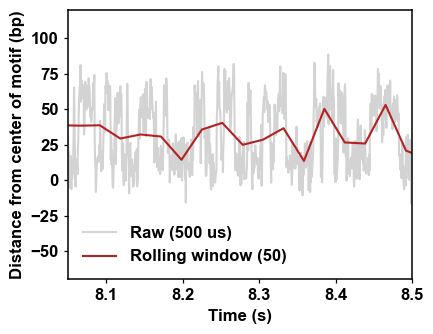

In [ ]:
window = 50
fig, ax = plt.subplots(figsize=(4.5,3.5))
# Reshape array into chunks of size `window` and average each chunk
time_avg = n6_bp_pb['time'].values[:len(n6_bp_pb)//window*window].reshape(-1, window).mean(axis=1)
j_avg = n6_bp_pb['bp_corrected'].values[:len(n6_bp_pb)//window*window].reshape(-1, window).mean(axis=1)

plt.plot(n6_bp_pb['time'], n6_bp_pb['bp_corrected'], alpha=1, label='Raw (500 us)', color='lightgrey')
plt.plot(time_avg, j_avg, label='Rolling window (50)', color='firebrick')
plt.xlabel('Time (s)')
plt.ylabel('Distance from center of motif (bp)')
plt.legend(frameon=False)
plt.xlim(8.05, 8.5)
plt.ylim(-70, 120)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()


### Consensus N-term

Model loaded from models/con2_hmm_model.pkl)
Fraction of time spent in each state: {'State 0': 0.010980644300527196, 'State 1': -1.687977686212343, 'State 2': 12.786872409334412, 'State 3': -10.109875367422596}


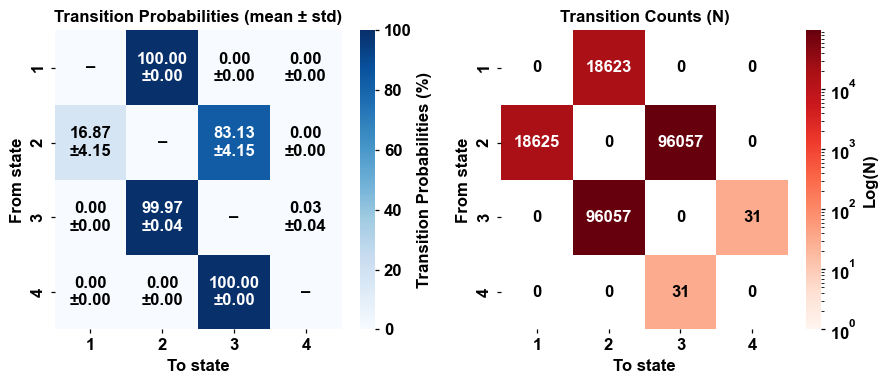


=== Per-trace occupancies (fractions) ===
           state_1  state_2  state_3  state_4
trace_001   0.0121   0.8448   0.1431   0.0000
trace_002   0.0086   0.8650   0.1264   0.0000
trace_003   0.0084   0.8682   0.1235   0.0000
trace_004   0.0326   0.7777   0.1883   0.0014
trace_005   0.0275   0.7888   0.1837   0.0000
trace_006   0.0257   0.7944   0.1798   0.0001
trace_007   0.0206   0.8110   0.1683   0.0001
trace_008   0.0150   0.8351   0.1494   0.0005
trace_009   0.0197   0.8180   0.1623   0.0000

=== Occupancy (per state) ===
state  mean(frac)  SD_across_traces  boot_SD_of_mean  CI_lo  CI_hi
    1      0.0189             0.0081           0.0027  0.0137  0.0243
    2      0.8226             0.0310           0.0103  0.8023  0.8428
    3      0.1583             0.0228           0.0076  0.1434  0.1732
    4      0.0002             0.0004           0.0001  0.0000  0.0006


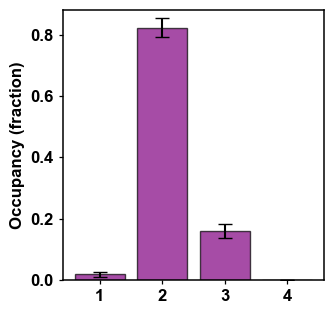


Mean fraction of time in each state: [1.89065154e-02 8.22552681e-01 1.58306084e-01 2.34719189e-04]
SD across traces:                    [0.00808314 0.0309644  0.02276543 0.00044131]
Bootstrap SD of the mean:            [0.00269781 0.01032738 0.00759031 0.00014884]
95% CI (percentile):               lo=[1.37280827e-02 8.02333353e-01 1.43423695e-01 2.09726070e-05], hi=[2.42912705e-02 8.42769127e-01 1.73150339e-01 5.66883926e-04]


/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_23386/837132.py:50: RuntimeWarning: invalid value encountered in divide
  normalized_cumulative_time = cumulative_time_in_state / max(cumulative_time_in_state)


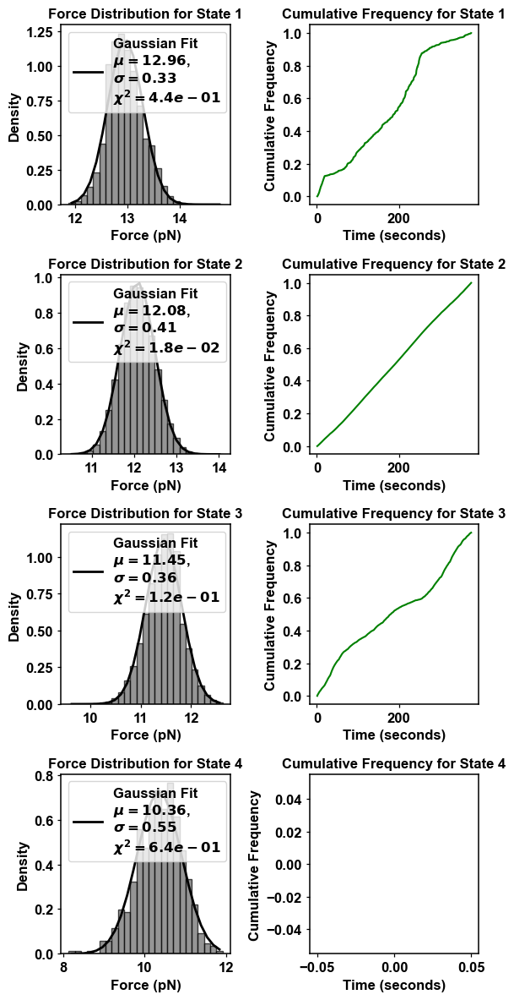

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_23386/1647836657.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


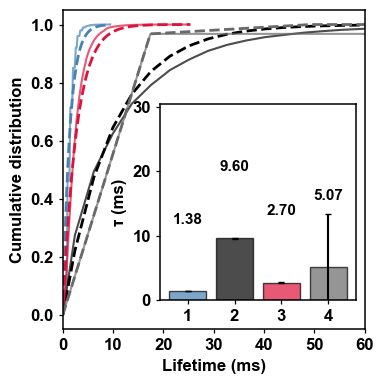

taus =  [1.3814321174202995, 9.604669104319996, 2.7017216873473346, 5.066343863255899]
tau errors =  [0.03058113532457515, 0.1027518544483937, 0.02815272756124444, 8.350203545188718]


In [ ]:
c_traces = [c1, c2, c3, c5, c7, c8, c9, c10, c11]
c_traces = c_traces
c_hmm_result = HMM_predict_force(c_traces, 'consensus_nterm_ctcfwt_4_model.pkl')
c_sorted_hs = plot_transition_and_HMM_force(c_hmm_result, c_traces, 4, '/publication.pdf')
plot_force_statistics(4, c_sorted_hs[0], c_hmm_result)
c_results = plot_cdf_lifetime(4, c_sorted_hs[0], c_hmm_result, 0, 60,  '/publication.pdf')
c_tp_results = compute_transition_probabilities_stats(c_hmm_result, c_traces, n_components=4, as_percent=False)

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/2041128995.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_obj = copy(cm.get_cmap(cmap))


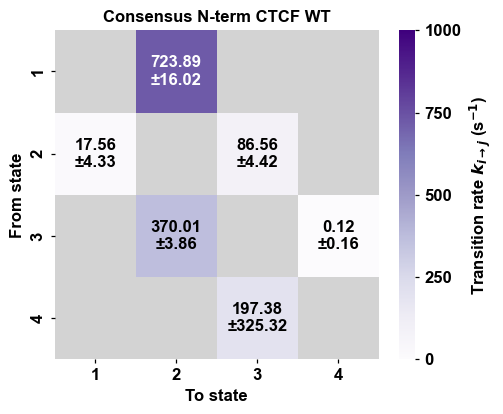

In [ ]:
# If all 4 states fit in the CDF step (taus for all states), just call:
k_mean, k_std = plot_transition_rates_with_errors(
    tp_stats=c_tp_results,
    cdf_results=c_results,
    n_components=4,
    state_indices=None,  # or omit
    savepath='/publication.pdf',
    title = 'Consensus N-term CTCF WT',
    cmap="Purples"
)


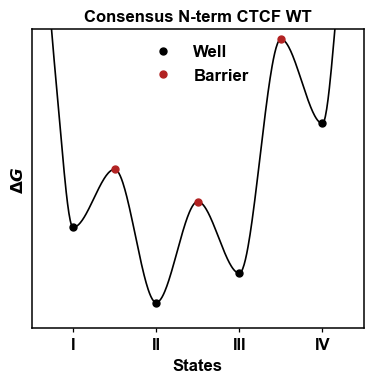

Using fixed Eyring ν = kBT/h = 6.212e+12 s^-1 at T=298.15 K
(Visualization only) constant barrier display shift applied: 20.000 kBT


In [ ]:
# lifetimes from HMM (uses self-transitions)
taus_ms = np.array(c_results['taus'])

# exit-conditioned branching
P_exit = c_tp_results[0]

# rates
rate_matrix = build_rate_matrix(P_exit, taus_ms)

# plot with automatic prefactor (keeps barriers above wells)
plot_energy_landscape_from_rates(
    rate_matrix,
    title='Consensus N-term CTCF WT',
    savepath='/publication.pdf',
    kBT=1,
    color='black',
    linestyle='-',
    label=None,
    csvpath='/publication.csv',
)


### Comparison

In [80]:
import numpy as np
from scipy.stats import mannwhitneyu, ttest_ind

# --- Data by state ---
states = {
    "state_1": {
        "PDGFRA WT": [0.1077,0.1438,0.0636,0.0628,0.1024,0.1034,0.1322,0.1158,0.0968,0.1001],
        "PDGFRA ΔN": [0.2172,0.0920,0.0885,0.0890,0.1097],
        "Consensus WT": [0.0121,0.0086,0.0084,0.0326,0.0275,0.0257,0.0206,0.0150,0.0197],
        "PDGFRA methylated": [0.0057,0.0025,0.0024,0.0042,0.0100,0.0095,0.0097],
        "Cohesin": [0.1163,0.1217,0.0979,0.1083,0.1230,0.1214,0.1137,0.0899,0.0972,0.0957,
                    0.1070,0.1099,0.1085,0.1071,0.0970,0.1023,0.0760,0.0979,0.0710],
        "Cohesin+PDS5A": [0.0966,0.0969,0.1589,0.0959,0.0978,0.0951,0.1084,0.1031,0.1055],
        "PDS5A": [0.0336,0.0416,0.0323,0.0280,0.0280,0.0278],
    },
    "state_2": {
        "PDGFRA WT": [0.7677,0.7089,0.8392,0.8383,0.7489,0.7444,0.6955,0.7197,0.7593,0.7540],
        "PDGFRA ΔN": [0.5893,0.7514,0.7581,0.7557,0.7297],
        "Consensus WT": [0.8448,0.8650,0.8682,0.7777,0.7888,0.7944,0.8110,0.8351,0.8180],
        "PDGFRA methylated": [0.5662,0.5170,0.5180,0.5118,0.5048,0.5047,0.5043],
        "Cohesin": [0.7535,0.7465,0.7938,0.7716,0.7334,0.7460,0.7624,0.8098,0.7992,0.7941,
                    0.7752,0.7640,0.7750,0.7701,0.7943,0.7897,0.8340,0.7974,0.8463],
        "Cohesin+PDS5A": [0.7344,0.7295,0.6496,0.7364,0.7311,0.7365,0.7116,0.7195,0.7129],
        "PDS5A": [0.8312,0.8002,0.8247,0.8444,0.8453,0.8410],
    },
    "state_3": {
        "PDGFRA WT": [0.0874,0.0981,0.0778,0.0854,0.1442,0.1520,0.1601,0.1622,0.1423,0.1456],
        "PDGFRA ΔN": [0.0761,0.1555,0.1533,0.1543,0.1443],
        "Consensus WT": [0.1431,0.1264,0.1235,0.1883,0.1837,0.1798,0.1683,0.1494,0.1623],
        "PDGFRA methylated": [0.3984,0.4785,0.4777,0.4777,0.4771,0.4781,0.4746],
        "Cohesin": [0.1301,0.1267,0.0964,0.1175,0.1431,0.1322,0.1199,0.0976,0.0881,0.1101,
                    0.1144,0.1259,0.1091,0.1228,0.1061,0.0985,0.0901,0.0894,0.0828],
        "Cohesin+PDS5A": [0.1690,0.1734,0.1271,0.1677,0.1710,0.1682,0.1739,0.1773,0.1814],
        "PDS5A": [0.1265,0.1578,0.1428,0.1259,0.1252,0.1311],
    },
    "state_4": {
        "PDGFRA WT": [0.0373,0.0492,0.0194,0.0136,0.0045,0.0002,0.0122,0.0023,0.0016,0.0003],
        "PDGFRA ΔN": [0.1174,0.0010,0.0001,0.0010,0.0164],
        "Consensus WT": [0.0000,0.0000,0.0000,0.0014,0.0000,0.0001,0.0001,0.0005,0.0000],
        "PDGFRA methylated": [0.0298,0.0020,0.0019,0.0063,0.0081,0.0077,0.0114],
        "Cohesin": [0.0001,0.0052,0.0119,0.0027,0.0005,0.0003,0.0041,0.0028,0.0155,0.0001,
                    0.0034,0.0002,0.0074,0.0000,0.0026,0.0095,0.0000,0.0153,0.0000],
        "Cohesin+PDS5A": [0.0000,0.0002,0.0644,0.0001,0.0001,0.0001,0.0061,0.0001,0.0002],
        "PDS5A": [0.0087,0.0003,0.0002,0.0016,0.0015,0.0002],
    },
}

def p_to_stars(p):
    if p < 0.0001: return "****"
    elif p < 0.001: return "***"
    elif p < 0.01: return "**"
    elif p < 0.05: return "*"
    else: return "ns"

for state, conds in states.items():
    ref = np.array(conds["PDGFRA WT"])
    print(f"\n=== {state} :: Mann–Whitney U (non-parametric) ===")
    for name, vals in conds.items():
        if name == "PDGFRA WT":
            continue
        _, p = mannwhitneyu(ref, vals, alternative="two-sided")
        print(f"{name} vs PDGFRA WT: p={p:.3e}, {p_to_stars(p)}")

    print(f"\n=== {state} :: Welch’s t-test ===")
    for name, vals in conds.items():
        if name == "PDGFRA WT":
            continue
        _, p = ttest_ind(ref, vals, equal_var=False)
        print(f"{name} vs PDGFRA WT: p={p:.3e}, {p_to_stars(p)}")



=== state_1 :: Mann–Whitney U (non-parametric) ===
PDGFRA ΔN vs PDGFRA WT: p=8.591e-01, ns
Consensus WT vs PDGFRA WT: p=2.797e-04, ***
PDGFRA methylated vs PDGFRA WT: p=1.028e-04, ***
Cohesin vs PDGFRA WT: p=9.817e-01, ns
Cohesin+PDS5A vs PDGFRA WT: p=7.133e-01, ns
PDS5A vs PDGFRA WT: p=1.364e-03, **

=== state_1 :: Welch’s t-test ===
PDGFRA ΔN vs PDGFRA WT: p=5.573e-01, ns
Consensus WT vs PDGFRA WT: p=8.227e-07, ****
PDGFRA methylated vs PDGFRA WT: p=5.906e-07, ****
Cohesin vs PDGFRA WT: p=9.649e-01, ns
Cohesin+PDS5A vs PDGFRA WT: p=7.366e-01, ns
PDS5A vs PDGFRA WT: p=6.129e-06, ****

=== state_2 :: Mann–Whitney U (non-parametric) ===
PDGFRA ΔN vs PDGFRA WT: p=5.941e-01, ns
Consensus WT vs PDGFRA WT: p=7.963e-03, **
PDGFRA methylated vs PDGFRA WT: p=1.028e-04, ***
Cohesin vs PDGFRA WT: p=6.313e-02, ns
Cohesin+PDS5A vs PDGFRA WT: p=5.501e-02, ns
PDS5A vs PDGFRA WT: p=7.493e-03, **

=== state_2 :: Welch’s t-test ===
PDGFRA ΔN vs PDGFRA WT: p=2.985e-01, ns
Consensus WT vs PDGFRA WT: p=3

In [2]:
import numpy as np
from scipy.stats import mannwhitneyu, ttest_ind

# ---- Input data ----
# Condition 1: C-term PDGFRA WT
cond1 = {
    "state_1": np.array([0.3766, 0.0134, 0.0862, 0.0007, 0.0336]),
    "state_2": np.array([0.2090, 0.3298, 0.7378, 0.4472, 0.6007]),
    "state_3": np.array([0.1372, 0.4711, 0.0905, 0.3980, 0.2140]),
    "state_4": np.array([0.2772, 0.1858, 0.0854, 0.1541, 0.1516]),
}

# Condition 2: C-term PDGFRA nucleosome WT
cond2 = {
    "state_1": np.array([0.1504, 0.0897, 0.1446, 0.2432, 0.1525, 0.1271, 0.4311, 0.0563, 0.1110]),
    "state_2": np.array([0.6986, 0.7878, 0.6950, 0.5918, 0.6985, 0.7995, 0.3674, 0.8843, 0.7195]),
    "state_3": np.array([0.1104, 0.1055, 0.1059, 0.0426, 0.1197, 0.0286, 0.0367, 0.0592, 0.1542]),
    "state_4": np.array([0.0406, 0.0170, 0.0545, 0.1224, 0.0293, 0.0448, 0.1648, 0.0002, 0.0153]),
}

def p_to_stars(p):
    if p < 1e-4: return "****"
    elif p < 1e-3: return "***"
    elif p < 1e-2: return "**"
    elif p < 5e-2: return "*"
    else: return "ns"

out_lines = []

for state in ["state_1", "state_2", "state_3", "state_4"]:
    a, b = cond1[state], cond2[state]
    # Mann–Whitney
    _, p_mw = mannwhitneyu(a, b, alternative="two-sided")
    # Welch’s t-test
    _, p_t = ttest_ind(a, b, equal_var=False)
    out_lines.append((state, p_mw, p_to_stars(p_mw), p_t, p_to_stars(p_t)))

formatted = []
for state, p_mw, s_mw, p_t, s_t in out_lines:
    formatted.append(f"=== {state} ===")
    formatted.append(f"Mann–Whitney U: C-term nucleosome vs C-term WT: p={p_mw:.3e}, {s_mw}")
    formatted.append(f"Welch’s t-test: C-term nucleosome vs C-term WT: p={p_t:.3e}, {s_t}")
    
"\n".join(formatted)


'=== state_1 ===\nMann–Whitney U: C-term nucleosome vs C-term WT: p=8.292e-02, ns\nWelch’s t-test: C-term nucleosome vs C-term WT: p=4.413e-01, ns\n=== state_2 ===\nMann–Whitney U: C-term nucleosome vs C-term WT: p=8.292e-02, ns\nWelch’s t-test: C-term nucleosome vs C-term WT: p=7.279e-02, ns\n=== state_3 ===\nMann–Whitney U: C-term nucleosome vs C-term WT: p=2.897e-02, *\nWelch’s t-test: C-term nucleosome vs C-term WT: p=7.359e-02, ns\n=== state_4 ===\nMann–Whitney U: C-term nucleosome vs C-term WT: p=1.199e-02, *\nWelch’s t-test: C-term nucleosome vs C-term WT: p=1.519e-02, *'

##### Representative traces

In [120]:
total_time_sec = total_recorded_time([n1])
print(f"Total recorded time: {total_time_sec:.2f} seconds")

total_time_sec = total_recorded_time([n2])
print(f"Total recorded time: {total_time_sec:.2f} seconds")

total_time_sec = total_recorded_time([n3])
print(f"Total recorded time: {total_time_sec:.2f} seconds")

total_time_sec = total_recorded_time([n4])
print(f"Total recorded time: {total_time_sec:.2f} seconds")

total_time_sec = total_recorded_time([n5])
print(f"Total recorded time: {total_time_sec:.2f} seconds")

total_time_sec = total_recorded_time([n6])
print(f"Total recorded time: {total_time_sec:.2f} seconds")

total_time_sec = total_recorded_time([n7])
print(f"Total recorded time: {total_time_sec:.2f} seconds")


Total recorded time: 19.00 seconds
Total recorded time: 35.00 seconds
Total recorded time: 55.00 seconds
Total recorded time: 5.50 seconds
Total recorded time: 32.80 seconds
Total recorded time: 129.10 seconds
Total recorded time: 115.00 seconds


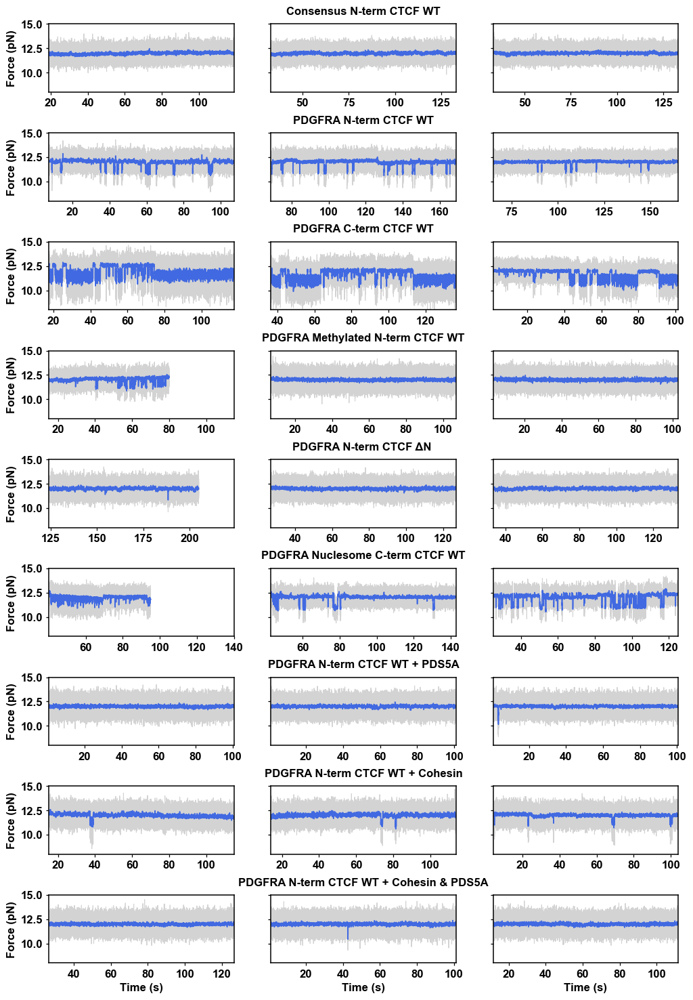

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def _roll_avg(arr, window):
    n = len(arr)
    use_n = (n // window) * window
    if use_n == 0:
        return np.array([])
    return arr[:use_n].reshape(-1, window).mean(axis=1)

def plot_traces_conditions_rows_reps_cols(
    traces_by_condition,
    condition_labels=None,
    col_titles=("Trace 1", "Trace 2", "Trace 3"),
    window=50,
    seconds_span=100,
    ylim=(8, 15),
    figsize=(12, 18),
    row_title_pad=10,
    savepath=None
):
    """
    Plot conditions as rows, replicates (traces) as columns.
    Row titles (condition names) are placed above the middle subplot in each row.
    """
    if isinstance(traces_by_condition, dict):
        labels = list(traces_by_condition.keys())
        conds = [traces_by_condition[k] for k in labels]
    else:
        conds = traces_by_condition
        labels = condition_labels if condition_labels is not None else [f"Condition {i+1}" for i in range(len(conds))]

    n_conditions = len(conds)
    fig, axes = plt.subplots(n_conditions, 3, figsize=figsize,
                             sharey=True, constrained_layout=False)

    if n_conditions == 1:
        axes = np.expand_dims(axes, 0)

    for row, (cond_label, reps) in enumerate(zip(labels, conds)):
        for col in range(3):
            ax = axes[row, col]
            df = reps[col]

            t = df['time (seconds)'].values
            f = df['force_corrected (pN)'].values

            ax.plot(t, f, color='lightgrey', linewidth=0.8, label='Raw (500 µs)')

            t_avg = _roll_avg(t, window)
            f_avg = _roll_avg(f, window)
            if len(t_avg) and len(f_avg):
                ax.plot(t_avg, f_avg, color='royalblue', linewidth=1.2,
                        label=f'Rolling window ({window})')

            tmin = np.nanmin(t)
            ax.set_xlim(tmin, tmin + seconds_span)
            ax.set_ylim(*ylim)

            if row == n_conditions - 1:
                ax.set_xlabel("Time (s)")
            if col == 0:
                ax.set_ylabel("Force (pN)")

            # Column headers once at the top row
            if row == 0:
                ax.set_title(col_titles[col], fontsize=11, pad=5)

        # Put condition label as a suptitle above the middle subplot in row
        axes[row, 1].set_title(cond_label, fontsize=12, fontweight='bold',
                               pad=row_title_pad)

    # Add spacing between rows so titles don’t overlap plots
    plt.subplots_adjust(hspace=0.6)

    # handles, labels_ = axes[0,0].get_legend_handles_labels()
    # if handles:
    #     fig.legend(handles, labels_, loc='upper center', ncol=2, frameon=False, fontsize=10)

    if savepath:
        fig.savefig(savepath, format=savepath.split('.')[-1], dpi=300)
    plt.show()


# ---- Example usage ----
traces = {
    "Consensus N-term CTCF WT":     [c1, c2, c3],
    "PDGFRA N-term CTCF WT":        [p1, p2, p3],
    "PDGFRA C-term CTCF WT":        [pc1, pc2, pc4],
    "PDGFRA Methylated N-term CTCF WT":    [m1, m5, m6],
    "PDGFRA N-term CTCF ΔN ":     [pdn2, pdn3, pdn4],
    "PDGFRA Nuclesome C-term CTCF WT":         [n3, n6, n7],
    "PDGFRA N-term CTCF WT + PDS5A":         [p5_4, p5_5, p5_6],
    "PDGFRA N-term CTCF WT + Cohesin":         [oc_15, oc_13, oc_9],
    "PDGFRA N-term CTCF WT + Cohesin & PDS5A":         [pc_1, pc_2, pc_3],
}

plot_traces_conditions_rows_reps_cols(
    traces_by_condition=traces,
    window=50,
    seconds_span=100,
    ylim=(8, 15),
    col_titles=("", "", ""),
    savepath='/publication.pdf'
)



##### Transition types

In [87]:
def plot_transition_and_HMM_force_with_stats(hmm_result, traces, n_components, trans_savepath):
    """
    Plot transition matrices, HMM force traces, and calculate statistics for non-sequential transitions.

    Parameters:
        hmm_result: tuple
            HMM result containing hidden states and related data.
        traces: list of DataFrames
            List of corresponding traces for each HMM result.
        n_components: int
            Number of hidden states in the HMM model.
        trans_savepath: str
            Path to save the transition matrix plots.

    Returns:
        sorted_hidden_states: np.ndarray
            Sorted hidden states for the HMM result.
        mean_fraction_time: np.ndarray
            Mean fraction of time spent in each state.
        std_fraction_time: np.ndarray
            Standard deviation of time spent in each state.
        all_fraction_times: np.ndarray
            Fraction of time spent in each state for each trace.
        mean_non_sequential_transitions: float
            Mean number of non-sequential transitions normalized to time.
        std_non_sequential_transitions: float
            Standard deviation of non-sequential transitions normalized to time.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import seaborn as sns
    from matplotlib.colors import LogNorm

    X, hidden_states, all_time_data, all_force_data, combined_time = (
        hmm_result[0], hmm_result[1], hmm_result[2], hmm_result[3], hmm_result[4]
    )

    # Calculate mean force for each hidden state
    state_means = np.array([X[hidden_states == i].mean() for i in range(n_components)])

    # Sort states in order of decreasing mean force
    sorted_indices = np.argsort(-state_means)
    sorted_hidden_states = np.zeros_like(hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[hidden_states == old_label] = new_label

    state_means_sorted = state_means[sorted_indices]

    # Initialize metrics for non-sequential transitions
    non_sequential_transitions_per_trace = []

    # Plot original force data and HMM states for each trace separately
    start_idx = 0
    all_fraction_times = []

    for trace_index, trace in enumerate(traces):
        trace_length = len(trace)
        trace_time = all_time_data[trace_index]
        trace_force = trace['force_corrected (pN)'].values
        trace_hidden_states = sorted_hidden_states[start_idx:start_idx + trace_length]
        start_idx += trace_length

        # Calculate non-sequential transitions
        non_sequential_count = 0
        total_transitions = 0
        for i in range(1, len(trace_hidden_states)):
            prev_state = trace_hidden_states[i - 1]
            curr_state = trace_hidden_states[i]
            if prev_state != curr_state:
                total_transitions += 1
                if abs(prev_state - curr_state) > 1:
                    non_sequential_count += 1

        # Calculate trace duration
        trace_duration = np.max(trace['time (seconds)']) - np.min(trace['time (seconds)'])
        non_sequential_transitions_per_trace.append(non_sequential_count / trace_duration if trace_duration > 0 else 0)

        # Calculate total lifetimes for each state for this trace
        total_lifetimes = np.zeros(n_components)
        for i in range(n_components):
            in_state = (trace_hidden_states == i)
            total_lifetimes[i] = np.sum(np.diff(trace_time) * in_state[:-1])

        total_time = np.sum(total_lifetimes)
        fraction_time_in_states = total_lifetimes / total_time
        all_fraction_times.append(fraction_time_in_states)

    # Convert fraction times to numpy array for easy computation
    all_fraction_times = np.array(all_fraction_times)

    # Calculate mean and standard deviation for fraction of time spent in each state
    mean_fraction_time = np.mean(all_fraction_times, axis=0)
    std_fraction_time = np.std(all_fraction_times, axis=0)

    # Calculate mean and std for non-sequential transitions
    mean_non_sequential_transitions = np.mean(non_sequential_transitions_per_trace)
    std_non_sequential_transitions = np.std(non_sequential_transitions_per_trace)

    print(f"Mean non-sequential transitions per second: {mean_non_sequential_transitions}")
    print(f"Standard deviation of non-sequential transitions per second: {std_non_sequential_transitions}")

    return (
        sorted_hidden_states,
        mean_fraction_time,
        std_fraction_time,
        all_fraction_times,
        mean_non_sequential_transitions,
        std_non_sequential_transitions
    )


Mean non-sequential transitions per second: 1.2376312396349225
Standard deviation of non-sequential transitions per second: 2.1288384297668523
Mean non-sequential transitions per second: 0.8198523273447448
Standard deviation of non-sequential transitions per second: 0.47459766667429876
Mean non-sequential transitions per second: 0.0
Standard deviation of non-sequential transitions per second: 0.0
Mean non-sequential transitions per second: 0.0
Standard deviation of non-sequential transitions per second: 0.0
Mean non-sequential transitions per second: 0.0013616613980610255
Standard deviation of non-sequential transitions per second: 0.0030447674484018533
Mean non-sequential transitions per second: 0.002285274965481149
Standard deviation of non-sequential transitions per second: 0.0047568773150510075
Mean non-sequential transitions per second: 0.30473481866857477
Standard deviation of non-sequential transitions per second: 0.23497509073936845


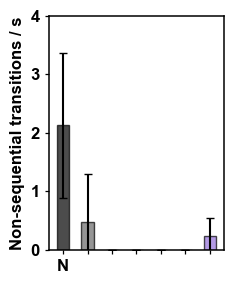

[2.1288384297668523, 0.47459766667429876, 0.0, 0.0, 0.0030447674484018533, 0.0047568773150510075, 0.23497509073936845]
Mean non-sequential transitions per second: 21.739605267973406
Standard deviation of non-sequential transitions per second: 31.103012925851285
Mean non-sequential transitions per second: 0.0
Standard deviation of non-sequential transitions per second: 0.0


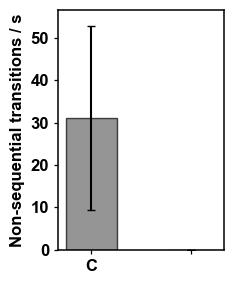

[31.103012925851285, 0.0]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

n_components = 4

def get_val_err(hmm_result, traces, n_components):
    out = plot_transition_and_HMM_force_with_stats(hmm_result, traces, n_components, '/publication.pdf')
    return out[-1], out[-2]  # value, error

# --- First figure: 7 conditions ---
pairs_7 = [
    (pdn_hmm_result, [pdn1, pdn2, pdn3, pdn4, pdn5]),
    (p_hmm_result,   [p1, p2, p3, p4, p5, p6, p7, p8, p9, p10]),
    (m_hmm_result,   [m1, m2, m3, m4, m5, m6]),
    (c_hmm_result,   [c1, c2, c3, c5, c7, c8, c9, c10, c11]),
    (p5_hmm_result,  p5_traces),
    (oc_hmm_result,  oc_traces),
    (pc_hmm_result,  pc_traces),
]

values_7, errors_7 = zip(*(get_val_err(hmm, tr, n_components) for hmm, tr in pairs_7))
values_7, errors_7 = list(values_7), list(errors_7)

labels_7 = ['N', '', '', '', '', '', '']
colors_7 = ['black', 'dimgrey', 'royalblue', 'orchid', 'indigo', 'darkorchid', 'mediumpurple']

assert len(values_7) == len(errors_7) == len(labels_7) == len(colors_7)

plt.figure(figsize=(2.5, 3))  # small plot, many bars -> minimal labels
x = np.arange(len(values_7))
plt.bar(x, values_7, width=0.5, yerr=errors_7, color=colors_7,
        alpha=0.7, edgecolor='black', capsize=3)
plt.ylabel('Non-sequential transitions / s', fontsize=12)
plt.xticks(x, labels_7, rotation=0)
plt.ylim(0, 4)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()
print(values_7)

# --- Second figure: 2 conditions ---
pairs_2 = [
    (ct_hmm_result, [pc1, pc2, pc3, pc4, pc5]),
    (n_hmm_result,  [n1c, n2c, n3c, n4c, n5c, n6c, n7c, n8c, n9c]),
]
values_2, errors_2 = zip(*(get_val_err(hmm, tr, n_components) for hmm, tr in pairs_2))
values_2, errors_2 = list(values_2), list(errors_2)

labels_2 = ['C', '']
colors_2 = ['dimgrey', 'navy']

plt.figure(figsize=(2.5, 3))
x2 = np.arange(len(values_2))
plt.bar(x2, values_2, width=0.51, yerr=errors_2, color=colors_2,
        alpha=0.7, edgecolor='black', capsize=3)
plt.ylabel('Non-sequential transitions / s', fontsize=12)
plt.xticks(x2, labels_2, rotation=0)
plt.ylim(0, 56.5)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()
print(values_2)


In [147]:
def run_hmm_on_traces(traces, model_path):
    results = []
    for trace in traces:
        results.append(HMM_predict_force([trace], model_path))
    return results

In [98]:
p_hmm_results = run_hmm_on_traces(
    p_traces,
    "final_models/pdgfra_nterm_ctcfwt_4_model.pkl")

Model loaded from final_models/pdgfra_nterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.03725506072343159, 'State 1': 0.08738874699097558, 'State 2': 0.7676828327169879, 'State 3': 0.10767335956860485}
Model loaded from final_models/pdgfra_nterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.04923817626246954, 'State 1': 0.09808334049901962, 'State 2': 0.708921684902548, 'State 3': 0.1437567983359628}
Model loaded from final_models/pdgfra_nterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.01935931294034197, 'State 1': 0.07783194075914666, 'State 2': 0.8392067295146073, 'State 3': 0.06360201678590413}
Model loaded from final_models/pdgfra_nterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.013565714317455117, 'State 1': 0.08542101111062658, 'State 2': 0.8382541551188852, 'State 3': 0.06275911945303309}
Model loaded from final_models/pdgfra_nterm_ctcfwt_4_model.pkl
Fraction of time spent

In [99]:
ct_hmm_results = run_hmm_on_traces(
    ct_traces,
    "final_models/pdgfra_cterm_ctcfwt_4_model.pkl")

Model loaded from final_models/pdgfra_cterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.27721844257888, 'State 1': 0.13719403403854674, 'State 2': 0.2090760422559421, 'State 3': 0.3765114811266311}
Model loaded from final_models/pdgfra_cterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.1857670723575217, 'State 1': 0.47108719072002236, 'State 2': 0.32977937173785554, 'State 3': 0.013366365184600418}
Model loaded from final_models/pdgfra_cterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.08542502314991239, 'State 1': 0.09054869978397681, 'State 2': 0.7377818258429198, 'State 3': 0.08624445122319097}
Model loaded from final_models/pdgfra_cterm_ctcfwt_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.15413179746782785, 'State 1': 0.3979587031257373, 'State 2': 0.44718933309847525, 'State 3': 0.0007201663079595556}
Model loaded from final_models/pdgfra_cterm_ctcfwt_4_model.pkl
Fraction of time spent

In [ ]:
m_hmm_results = run_hmm_on_traces(
    m_traces,
    "final_models/pdgfra_met_nterm_ctcfwt_4_model.pkl")

Model loaded from models/met_nterm_hmm_model_test.pkl
Fraction of time spent in each state: {'State 0': 0.029760723800331804, 'State 1': 0.3983797633970714, 'State 2': 0.5661913333282632, 'State 3': 0.005668179474333609}
Model loaded from models/met_nterm_hmm_model_test.pkl
Fraction of time spent in each state: {'State 0': 0.0019881283384026024, 'State 1': 0.478461833597526, 'State 2': 0.5170490825645045, 'State 3': 0.002500955499566951}
Model loaded from models/met_nterm_hmm_model_test.pkl
Fraction of time spent in each state: {'State 0': 0.0019360759796355998, 'State 1': 0.47768596214586423, 'State 2': 0.5180234384118274, 'State 3': 0.0023545234626727147}
Model loaded from models/met_nterm_hmm_model_test.pkl
Fraction of time spent in each state: {'State 0': 0.006328901814282643, 'State 1': 0.4777045500880131, 'State 2': 0.5117859912362657, 'State 3': 0.004180556861438621}
Model loaded from models/met_nterm_hmm_model_test.pkl
Fraction of time spent in each state: {'State 0': 0.0081272

In [101]:
pdn_hmm_results = run_hmm_on_traces(
    pdn_traces,
    "final_models/pdgfra_nterm_ctcfdn_4_model.pkl")

Model loaded from final_models/pdgfra_nterm_ctcfdn_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.1173774507773054, 'State 1': 0.07607684771345019, 'State 2': 0.5893019950793781, 'State 3': 0.2172437064298663}
Model loaded from final_models/pdgfra_nterm_ctcfdn_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.0010491324745844815, 'State 1': 0.15553234860686455, 'State 2': 0.7514020630726163, 'State 3': 0.09201645584593472}
Model loaded from final_models/pdgfra_nterm_ctcfdn_4_model.pkl
Fraction of time spent in each state: {'State 0': 6.356637406056813e-05, 'State 1': 0.1533477485815553, 'State 2': 0.7581060821901134, 'State 3': 0.08848260285427063}
Model loaded from final_models/pdgfra_nterm_ctcfdn_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.0009527584720389517, 'State 1': 0.15434677278155542, 'State 2': 0.7557185030699666, 'State 3': 0.08898196567643896}
Model loaded from final_models/pdgfra_nterm_ctcfdn_4_model.pkl
Fraction of time s

In [ ]:
p5_hmm_results = run_hmm_on_traces(
    p5_traces,
    "final_models/pdgfra_nterm_ctcfwt_pds5a_4_model.pkl")

Model loaded from final_models/pdgfra_nterm_ctcfwt_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.008702187271935351, 'State 1': 0.1265265162354837, 'State 2': 0.8312136920983776, 'State 3': 0.03355760439420342}
Model loaded from final_models/pdgfra_nterm_ctcfwt_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.000348327601855957, 'State 1': 0.15777532677121836, 'State 2': 0.8002331575446093, 'State 3': 0.0416431880823164}
Model loaded from final_models/pdgfra_nterm_ctcfwt_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.00023023111862697794, 'State 1': 0.14278010787276882, 'State 2': 0.8246633995558783, 'State 3': 0.03232626145272582}
Model loaded from final_models/pdgfra_nterm_ctcfwt_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.0016219674842056393, 'State 1': 0.12592365741013972, 'State 2': 0.8444307299360866, 'State 3': 0.028023645169568002}
Model loaded from final_models/pdgfra_nterm_ctcfwt_pds

In [103]:
oc_hmm_results = run_hmm_on_traces(
    oc_traces,
    "final_models/pdgfra_nterm_ctcfwt_cohesin_4_model.pkl")

Model loaded from final_models/pdgfra_nterm_ctcfwt_cohesin_4_model.pkl
Fraction of time spent in each state: {'State 0': 8.312520521531208e-05, 'State 1': 0.13013010250869553, 'State 2': 0.7534622351098836, 'State 3': 0.11632453717620564}
Model loaded from final_models/pdgfra_nterm_ctcfwt_cohesin_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.005207135186172901, 'State 1': 0.12665285451525002, 'State 2': 0.7464813397866132, 'State 3': 0.12165867051196397}
Model loaded from final_models/pdgfra_nterm_ctcfwt_cohesin_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.01187750073835993, 'State 1': 0.09642515378617658, 'State 2': 0.7937977487199435, 'State 3': 0.09789959675552018}
Model loaded from final_models/pdgfra_nterm_ctcfwt_cohesin_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.0026568172278031376, 'State 1': 0.11748897215146302, 'State 2': 0.7715609002128356, 'State 3': 0.10829331040789833}
Model loaded from final_models/pdgfra_nterm_ctc

In [104]:
pc_hmm_results = run_hmm_on_traces(
    pc_traces,
    "final_models/pdgfra_nterm_ctcfwt_cohesin_pds5a_4_model.pkl")

Model loaded from final_models/pdgfra_nterm_ctcfwt_cohesin_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.0, 'State 1': 0.16899897639216624, 'State 2': 0.7343611795341591, 'State 3': 0.09663984407367462}
Model loaded from final_models/pdgfra_nterm_ctcfwt_cohesin_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.00017674433698887016, 'State 1': 0.17343642514603086, 'State 2': 0.7294538748674567, 'State 3': 0.09693295564952335}
Model loaded from final_models/pdgfra_nterm_ctcfwt_cohesin_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 0.06438381716163544, 'State 1': 0.1271192438236141, 'State 2': 0.6496375442354716, 'State 3': 0.15885939477927893}
Model loaded from final_models/pdgfra_nterm_ctcfwt_cohesin_pds5a_4_model.pkl
Fraction of time spent in each state: {'State 0': 6.546939510349352e-05, 'State 1': 0.16770573101668257, 'State 2': 0.7363591525112718, 'State 3': 0.0958696470769421}
Model loaded from final_models/pdgfra_nte

In [ ]:
n_hmm_results = run_hmm_on_traces(
    n_traces,
    "final_models/pdgfra_nuc_cterm_ctcfwt_4_model.pkl")

Model loaded from models/ic_nuc_4model.pkl
Fraction of time spent in each state: {'State 0': 0.0405797745860015, 'State 1': 0.110399569369594, 'State 2': 0.6986213696297092, 'State 3': 0.15039928641469524}
Model loaded from models/ic_nuc_4model.pkl
Fraction of time spent in each state: {'State 0': 0.017030463160061952, 'State 1': 0.1054859581057255, 'State 2': 0.787813529100583, 'State 3': 0.08967004963362947}
Model loaded from models/ic_nuc_4model.pkl
Fraction of time spent in each state: {'State 0': 0.05452210120680726, 'State 1': 0.10594331572618992, 'State 2': 0.6949481775599656, 'State 3': 0.1445864055070372}
Model loaded from models/ic_nuc_4model.pkl
Fraction of time spent in each state: {'State 0': 0.12210460656165159, 'State 1': 0.042722181879119775, 'State 2': 0.591888010650578, 'State 3': 0.24328520090865072}
Model loaded from models/ic_nuc_4model.pkl
Fraction of time spent in each state: {'State 0': 0.02920747461277982, 'State 1': 0.11971267459537392, 'State 2': 0.6985358408

In [ ]:
c_hmm_results = run_hmm_on_traces(
    c_traces,
    "final_models/consensus_nterm_ctcfwt_4_model.pkl")

Model loaded from models/con2_hmm_model.pkl)
Fraction of time spent in each state: {'State 0': 0.0, 'State 1': 0.1430702874578286, 'State 2': 0.8448002121326822, 'State 3': 0.012129500409489244}
Model loaded from models/con2_hmm_model.pkl)
Fraction of time spent in each state: {'State 0': 0.0, 'State 1': 0.126387068717251, 'State 2': 0.8649856436746904, 'State 3': 0.008627287608058547}
Model loaded from models/con2_hmm_model.pkl)
Fraction of time spent in each state: {'State 0': 0.0, 'State 1': 0.12347488217882602, 'State 2': 0.8681657867903003, 'State 3': 0.008359331030873505}
Model loaded from models/con2_hmm_model.pkl)
Fraction of time spent in each state: {'State 0': 0.001421087004399977, 'State 1': 0.18830337549286705, 'State 2': 0.7776662700707545, 'State 3': 0.03260926743197835}
Model loaded from models/con2_hmm_model.pkl)
Fraction of time spent in each state: {'State 0': 2.0974879032829107e-05, 'State 1': 0.18365356685078385, 'State 2': 0.7888434725988228, 'State 3': 0.02748198

In [111]:
def calculate_fraction_transitions_with_error(hmm_results, n_components):
    """
    Calculate the fraction of transitions to each state with standard error across multiple traces.

    Parameters:
        hmm_results: list of tuples
            A list of HMM results, one for each trace. Each tuple contains hidden states and related data.
        n_components: int
            Number of hidden states in the HMM model.

    Returns:
        mean_fractions: dict
            Mean fraction of transitions to each state across traces.
        std_error_fractions: dict
            Standard error of the fraction of transitions to each state across traces.
    """
    # Initialize storage for transition counts and fractions
    fractions_per_trace = {state: [] for state in range(n_components)}

    # Process each HMM result (one per trace)
    for hmm_result in hmm_results:
        hidden_states = hmm_result[1]

        # Sort hidden states by mean force or other criteria if needed
        state_means = np.array([hmm_result[0][hidden_states == i].mean() for i in range(n_components)])
        sorted_indices = np.argsort(-state_means)
        sorted_hidden_states = np.zeros_like(hidden_states)
        for new_label, old_label in enumerate(sorted_indices):
            sorted_hidden_states[hidden_states == old_label] = new_label

        # Count transitions to each state
        total_transitions = 0
        transitions_to = {state: 0 for state in range(n_components)}
        for i in range(1, len(sorted_hidden_states)):
            prev_state = sorted_hidden_states[i - 1]
            curr_state = sorted_hidden_states[i]
            if prev_state != curr_state:
                total_transitions += 1
                transitions_to[curr_state] += 1

        # Calculate fractions for this trace
        for state in range(n_components):
            if total_transitions > 0:
                fractions_per_trace[state].append(transitions_to[state] / total_transitions)
            else:
                fractions_per_trace[state].append(0)

    # Calculate mean fractions and standard error across traces
    mean_fractions = {state: np.mean(fractions_per_trace[state]) for state in range(n_components)}
    std_error_fractions = {
        state: np.std(fractions_per_trace[state]) / np.sqrt(len(fractions_per_trace[state]))
        for state in range(n_components)
    }

    # Print results
    print("Mean fraction of transitions to each state with standard error:")
    for state in range(n_components):
        print(f"State {state + 1}: Mean = {mean_fractions[state]:.3f}, Std Error = {std_error_fractions[state]:.3f}")

    return mean_fractions, std_error_fractions


In [112]:
trans_pdg = calculate_fraction_transitions_with_error(p_hmm_results, 4)
trans_pdgc = calculate_fraction_transitions_with_error(ct_hmm_results, 4)
trans_con = calculate_fraction_transitions_with_error(c_hmm_results, 4)
trans_pdn = calculate_fraction_transitions_with_error(pdn_hmm_results, 4)
trans_nuc = calculate_fraction_transitions_with_error(n_hmm_results, 4)
trans_met = calculate_fraction_transitions_with_error(m_hmm_results, 4)
trans_p5 = calculate_fraction_transitions_with_error(p5_hmm_results, 4)
trans_oc = calculate_fraction_transitions_with_error(oc_hmm_results, 4)
trans_pc = calculate_fraction_transitions_with_error(pc_hmm_results, 4)

Mean fraction of transitions to each state with standard error:
State 1: Mean = 0.223, Std Error = 0.006
State 2: Mean = 0.493, Std Error = 0.001
State 3: Mean = 0.278, Std Error = 0.006
State 4: Mean = 0.006, Std Error = 0.002
Mean fraction of transitions to each state with standard error:
State 1: Mean = 0.091, Std Error = 0.036
State 2: Mean = 0.140, Std Error = 0.051
State 3: Mean = 0.361, Std Error = 0.052
State 4: Mean = 0.408, Std Error = 0.024


/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/3855029047.py:25: RuntimeWarning: Mean of empty slice.
  state_means = np.array([hmm_result[0][hidden_states == i].mean() for i in range(n_components)])
/Users/emily/anaconda3/envs/gpu_tracking/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Mean fraction of transitions to each state with standard error:
State 1: Mean = 0.084, Std Error = 0.007
State 2: Mean = 0.500, Std Error = 0.000
State 3: Mean = 0.416, Std Error = 0.007
State 4: Mean = 0.000, Std Error = 0.000
Mean fraction of transitions to each state with standard error:
State 1: Mean = 0.221, Std Error = 0.020
State 2: Mean = 0.496, Std Error = 0.003
State 3: Mean = 0.278, Std Error = 0.022
State 4: Mean = 0.005, Std Error = 0.004
Mean fraction of transitions to each state with standard error:
State 1: Mean = 0.377, Std Error = 0.015
State 2: Mean = 0.461, Std Error = 0.010
State 3: Mean = 0.122, Std Error = 0.015
State 4: Mean = 0.040, Std Error = 0.010
Mean fraction of transitions to each state with standard error:
State 1: Mean = 0.023, Std Error = 0.004
State 2: Mean = 0.471, Std Error = 0.007
State 3: Mean = 0.477, Std Error = 0.004
State 4: Mean = 0.029, Std Error = 0.007
Mean fraction of transitions to each state with standard error:
State 1: Mean = 0.144, S

##### Fraction of transitions

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_fraction_of_transitions_with_errors(
    conditions,                # list of (fractions, errors)
    labels=None,               # list of str, same length as conditions
    n_components=None,         # int; if None, inferred
    colors=None,               # list of colors; if None, matplotlib default
    ylim=(0, 0.015),
    savepath=None,
    state_superscript=r"$^N$"  # set to "" if you don't want the superscript
):
    """
    Plot grouped bar charts of fraction of transitions with error bars for multiple conditions.

    Parameters
    ----------
    conditions : list of tuples
        Each element is (fractions, errors).
        - fractions can be list/np.array of length n_components, or dict {state_index: value}
        - errors can be list/np.array or dict; use None or 0 if no errors.
    labels : list of str
        Labels for each condition (len(labels) == len(conditions)). If None, auto-names.
    n_components : int
        Number of states. If None, inferred from the longest fractions/errors found.
    colors : list
        Colors for each condition. If None, matplotlib chooses defaults.
    ylim : tuple
        y-axis limits.
    savepath : str or None
        If provided, saves the figure to this path.
    state_superscript : str
        Superscript appended to Roman numerals in xticklabels. Use "" to disable.
    """

    def to_vec(x, K):
        """Normalize fractions/errors (list/array/dict/None) to np.array of length K."""
        if x is None:
            return np.zeros(K, dtype=float)
        if isinstance(x, dict):
            v = np.zeros(K, dtype=float)
            for k, val in x.items():
                if 0 <= int(k) < K:
                    v[int(k)] = float(val)
            return v
        x = np.asarray(x, dtype=float).ravel()
        if x.size == K:
            return x
        # If size mismatches but is smaller, pad; if larger, truncate.
        out = np.zeros(K, dtype=float)
        m = min(K, x.size)
        out[:m] = x[:m]
        return out

    # --- infer n_components if needed ---
    if n_components is None:
        max_len = 0
        for fr, er in conditions:
            # try lengths from list/array
            for item in (fr, er):
                if item is None:
                    continue
                if isinstance(item, dict):
                    if item:
                        max_len = max(max_len, max(map(int, item.keys())) + 1)
                else:
                    max_len = max(max_len, np.asarray(item).size)
        if max_len == 0:
            raise ValueError("Could not infer n_components; please provide it explicitly.")
        n_components = int(max_len)

    # --- sanitize labels/colors ---
    n_cond = len(conditions)
    if labels is None:
        labels = [f"Condition {i+1}" for i in range(n_cond)]
    if len(labels) != n_cond:
        raise ValueError("len(labels) must match len(conditions).")

    if colors is not None and len(colors) != n_cond:
        raise ValueError("len(colors) must match len(conditions) when colors is provided.")

    # --- normalize data ---
    fracs = []
    errs  = []
    for i, pair in enumerate(conditions):
        if not (isinstance(pair, (list, tuple)) and len(pair) == 2):
            raise ValueError(f"conditions[{i}] must be a (fractions, errors) tuple.")
        f_vec = to_vec(pair[0], n_components)
        e_vec = to_vec(pair[1], n_components)
        fracs.append(f_vec)
        errs.append(e_vec)
    fracs = np.vstack(fracs)   # shape: (n_cond, n_components)
    errs  = np.vstack(errs)

    # --- plotting ---
    plt.figure(figsize=(5, 3))
    bar_width = min(0.8 / max(n_cond, 1), 0.25)  # keep groups tidy
    indices = np.arange(n_components)
    offset = -bar_width * (n_cond - 1) / 2

    for i in range(n_cond):
        plt.bar(
            indices + offset + i * bar_width,
            fracs[i],
            width=bar_width,
            yerr=errs[i],
            label=labels[i],
            alpha=0.7,
            color=None if colors is None else colors[i],
            edgecolor='black',
            capsize=5
        )

    # x tick labels (Roman numerals)
    romans = ["I","II","III","IV","V","VI","VII","VIII","IX","X"][:n_components]
    xticklabels = [r + state_superscript for r in romans]

    plt.ylabel('Fraction of transitions', fontsize=12)
    plt.xticks(ticks=indices, labels=xticklabels)
    plt.ylim(*ylim)
    plt.legend(fontsize=10, frameon=False)
    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, format=savepath.split('.')[-1])
    plt.show()


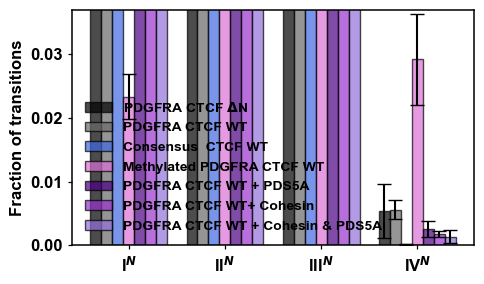

In [ ]:
conditions = [
    (trans_pdn[0], trans_pdn[1]),
    (trans_pdg[0], trans_pdg[1]),
    (trans_con[0], trans_con[1]),
    (trans_met[0], trans_met[1]),
    (trans_p5[0],  trans_p5[1]),   # fixed: use both fractions and errors
    (trans_oc[0],  trans_oc[1]),
    (trans_pc[0],  trans_pc[1]),
]

labels = [
    r'PDGFRA CTCF $\Delta$N', r'PDGFRA CTCF WT', r'Consensus  CTCF WT', r'Methylated PDGFRA CTCF WT',
    r'PDGFRA CTCF WT + PDS5A', r'PDGFRA CTCF WT+ Cohesin', r'PDGFRA CTCF WT + Cohesin & PDS5A'
]

# Either provide enough colors or omit `colors=` to let matplotlib choose:
plot_fraction_of_transitions_with_errors(conditions, labels=labels, n_components=4, ylim=(0, 0.037),
                                         colors=['black', 'dimgrey', 'royalblue', 'orchid', 'indigo', 'darkorchid', 'mediumpurple'],
                                         savepath='/publication.pdf')


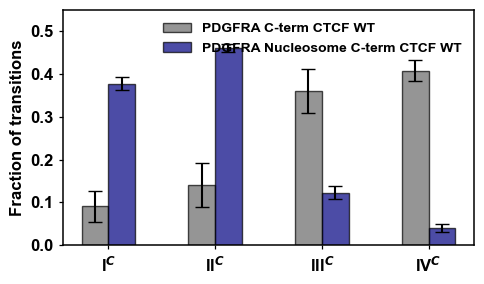

In [ ]:
conditions = [
    (trans_pdgc[0], trans_pdgc[1]),
    (trans_nuc[0], trans_nuc[1]),
]

labels = [
    'PDGFRA C-term CTCF WT',
    'PDGFRA Nucleosome C-term CTCF WT'
]

# Either provide enough colors or omit `colors=` to let matplotlib choose:
plot_fraction_of_transitions_with_errors(conditions, labels=labels, n_components=4, ylim=(0, 0.55), colors=['dimgrey', 'navy'], state_superscript=r"$^C$",
                                         savepath='/publication.pdf')


In [152]:
def calculate_transitions_per_duration_with_stats(hmm_results, traces, n_components):
    """
    Calculate the number of transitions per second for each trace and compute mean and standard error.

    Parameters:
        hmm_results: list of tuples
            List of HMM results, one for each trace.
        traces: list of DataFrames
            List of corresponding traces, each containing a 'time (seconds)' column.
        n_components: int
            Number of hidden states in the HMM model.

    Returns:
        transitions_per_duration: list
            A list of transitions per second for each trace.
        transitions_per_trace: list
            A list of total transitions for each trace.
        mean_transitions_per_duration: float
            Mean number of transitions per second across traces.
        std_error_transitions_per_duration: float
            Standard error of transitions per second across traces.
    """
    transitions_per_duration = []
    transitions_per_trace = []

    for hmm_result, trace in zip(hmm_results, traces):
        # Extract the hidden states from the HMM result
        hidden_states = hmm_result[1]

        # Sort hidden states by mean force or other criteria if needed
        state_means = np.array([hmm_result[0][hidden_states == i].mean() for i in range(n_components)])
        sorted_indices = np.argsort(-state_means)
        sorted_hidden_states = np.zeros_like(hidden_states)
        for new_label, old_label in enumerate(sorted_indices):
            sorted_hidden_states[hidden_states == old_label] = new_label

        # Count transitions
        total_transitions = 0
        for i in range(1, len(sorted_hidden_states)):
            prev_state = sorted_hidden_states[i - 1]
            curr_state = sorted_hidden_states[i]
            if prev_state != curr_state:
                total_transitions += 1

        # Calculate trace duration
        trace_duration = np.max(trace['time (seconds)']) - np.min(trace['time (seconds)'])

        # Calculate transitions per second
        transitions_per_sec = total_transitions / trace_duration if trace_duration > 0 else 0

        # Append results
        transitions_per_trace.append(total_transitions)
        transitions_per_duration.append(transitions_per_sec)

    # Calculate mean and standard error
    mean_transitions_per_duration = np.mean(transitions_per_duration)
    std_error_transitions_per_duration = np.std(transitions_per_duration)

    return (
        transitions_per_duration,
        transitions_per_trace,
        mean_transitions_per_duration,
        std_error_transitions_per_duration,
    )

/var/folders/bx/bnn_g7856qsd3h0xm1_28v5c0000gn/T/ipykernel_94369/3195911856.py:31: RuntimeWarning: Mean of empty slice.
  state_means = np.array([hmm_result[0][hidden_states == i].mean() for i in range(n_components)])
/Users/emily/anaconda3/envs/gpu_tracking/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


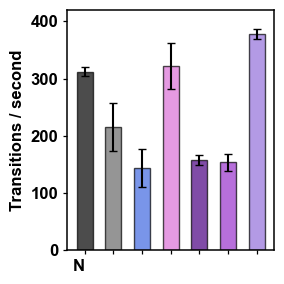

[311.99145399737, 215.04574469440095, 142.95992491830896, 321.6113331151063, 157.0920199680329, 153.47670104215825, 378.26631777880834]
[7.548711187297474, 42.22548622536345, 33.592673757341274, 40.204756238493346, 8.968772872071463, 15.36894429991964, 8.544891085430644]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

K = 4  # n_components

# Collect (hmm_results, traces, pretty_label) in the desired order
groups = [
    (pdn_hmm_results, [pdn1, pdn2, pdn3, pdn4, pdn5],                r'N'),
    (p_hmm_results, [p1, p2, p3, p4, p5, p6, p7, p8, p9, p10],     r''),
    (c_hmm_results, [c1, c2, c3, c5, c7, c8, c9, c10, c11],        r''),
    (m_hmm_results, [m1, m2, m3, m4, m5, m6, m7],                  r''),
    (p5_hmm_results,  p5_traces,                                     r''),
    (oc_hmm_results,  oc_traces,                                     r''),
    (pc_hmm_results,  pc_traces,                                     r''),
]

# Compute once
vals = []
errs = []
labs = []
for hmm_res, traces, lab in groups:
    out = calculate_transitions_per_duration_with_stats(hmm_res, traces, K)
    vals.append(out[2])  # mean
    errs.append(out[3])  # error (SE/SD per your function)
    labs.append(lab)

# Colors for each bar (7 entries, left→right)
colors = ['black', 'dimgrey', 'royalblue', 'orchid', 'indigo', 'darkorchid', 'mediumpurple']

# Plot
plt.figure(figsize=(3, 3))
x = np.arange(len(vals))
plt.bar(x, vals, width=0.55, yerr=errs, color=colors, alpha=0.7,
        edgecolor='black', capsize=3)

plt.ylabel('Transitions / second', fontsize=12)
plt.xticks(x, labs, rotation=0, ha='right')
plt.ylim(0, 420)
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()

print(vals)
print(errs)


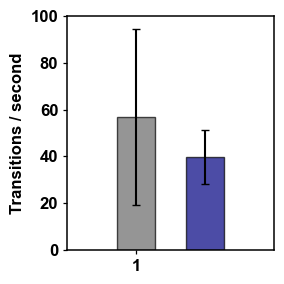

[56.74899137192584, 39.72259406878998]
[37.714307912966994, 11.58730817770406]


In [ ]:
import matplotlib.pyplot as plt

# Data for the bar plot
values = [calculate_transitions_per_duration_with_stats(ct_hmm_results, [pc1, pc2, pc3, pc4, pc5], 4)[2],
        calculate_transitions_per_duration_with_stats(n_hmm_results, [n1, n2, n3, n4, n5, n6, n7, n8, n9], 4)[2]]  # Replace with your numbers

errors = [calculate_transitions_per_duration_with_stats(ct_hmm_results, [pc1, pc2, pc3, pc4, pc5], 4)[3],
          calculate_transitions_per_duration_with_stats(n_hmm_results, [n1, n2, n3, n4, n5, n6, n7, n8, n9], 4)[3]]

labels = ['1', '2']  # Labels for each bar

# Create the bar plot
plt.figure(figsize=(3, 3))  # Small plot size
plt.bar(labels, values, width = 0.55, yerr = errors, color=['dimgrey', 'navy'], alpha=0.7, edgecolor='black', capsize=3)

# Add labels and title
plt.ylabel('Transitions / second', fontsize=12)
#plt.title('Small Bar Plot', fontsize=14)
plt.xlim(-1,2)
plt.ylim(0,100)
plt.xticks(['1'])
# Show the plot
plt.tight_layout()
plt.savefig('/publication.pdf', format='pdf')
plt.show()
print(values)
print(errors)


##### Transition matrices

In [72]:
n_components = 4

# Calculate transition matrix
transition_matrix1 = calculate_transition_probabilities(c_hmm_result, n_components)
transition_matrix2 = calculate_transition_probabilities(p_hmm_result, n_components)
transition_matrix3 = calculate_transition_probabilities(ct_hmm_result, n_components)
transition_matrix4 = calculate_transition_probabilities(m_hmm_result, n_components)
transition_matrix5 = calculate_transition_probabilities(pdn_hmm_result, n_components)
transition_matrix6 = calculate_transition_probabilities(n_hmm_result, n_components)
transition_matrix7 = calculate_transition_probabilities(p5_hmm_result, n_components)
transition_matrix8 = calculate_transition_probabilities(oc_hmm_result, n_components)
transition_matrix9 = calculate_transition_probabilities(pc_hmm_result, n_components)

# Transition matrices and titles
transition_matrices = [transition_matrix1, transition_matrix2, transition_matrix3, 
                       transition_matrix4, transition_matrix5, transition_matrix6,
                       transition_matrix7, transition_matrix8, transition_matrix9]

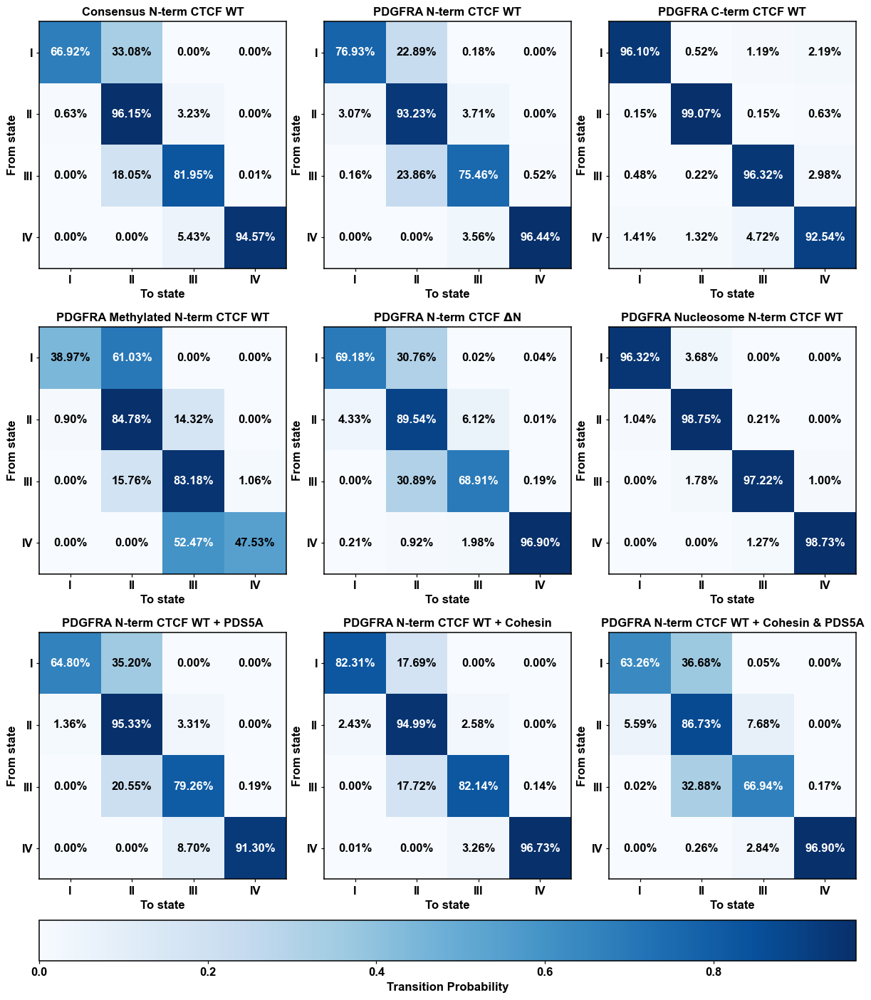

In [ ]:
titles = [
    'Consensus N-term CTCF WT',
    'PDGFRA N-term CTCF WT',
    'PDGFRA C-term CTCF WT',
    'PDGFRA Methylated N-term CTCF WT',
    r'PDGFRA N-term CTCF $\Delta$N',
    'PDGFRA Nucleosome N-term CTCF WT',
    'PDGFRA N-term CTCF WT + PDS5A',
    'PDGFRA N-term CTCF WT + Cohesin',
    'PDGFRA N-term CTCF WT + Cohesin & PDS5A',
]

# Create subplot grid
fig, axes = plt.subplots(3, 3, figsize=(12, 14), constrained_layout=True)
axes = axes.flatten()  # Flatten to 1D array

for i, (matrix, title) in enumerate(zip(transition_matrices, titles)):
    ax = axes[i]
    im = ax.imshow(matrix, cmap='Blues', interpolation='nearest')
    ax.set_title(title)
    ax.set_xlabel('To state')
    ax.set_ylabel('From state')
    ax.set_xticks(np.arange(n_components))
    ax.set_yticks(np.arange(n_components))
    ax.set_xticklabels(['I', 'II', 'III', 'IV'])
    ax.set_yticklabels(['I', 'II', 'III', 'IV'])
    
    # Annotate each square with the percentage
    for row in range(n_components):
        for col in range(n_components):
            value = matrix[row, col] * 100  # Convert to percentage
            ax.text(col, row, f'{value:.2f}%', ha='center', va='center',
                    color='black' if matrix[row, col] < 0.5 else 'white')

# Add a single colorbar
cbar = fig.colorbar(im, ax=axes, orientation='horizontal', fraction=0.05, pad=0.01)
cbar.set_label('Transition Probability')

plt.savefig('/publication.pdf', format='pdf')
plt.show()

##### Trace and mapping comparison

In [36]:
# ctcf = pd.concat([p1_bp, p2_bp, p3_bp, p4_bp])
# pds5a = pd.concat([p5_1_bp, p5_4_bp, p5_5_bp, p5_6_bp, p5_7_bp, p5_8_bp])
# cohesin = pd.concat([oc1_bp, oc3_bp, oc4_bp, oc5_bp, oc6_bp])
# pandc = pd.concat([pc_4_bp, pc_6_bp, pc_11_bp, pc_13_bp, pc_14_bp])

ctcf = pd.concat([p1,p2,p3,p4,p5,p6,p7,p8,p9,p10])
pds5a = pd.concat([p5_1,p5_2,p5_3,p5_4,p5_5,p5_6,p5_7,p5_8])
cohesin = pd.concat([oc_1,oc_2,oc_3,oc_4,oc_5,oc_6,oc_7,oc_8,oc_9,oc_10,oc_11,oc_12,oc_13,oc_14,oc_15,oc_16,oc_17,oc_18,oc_19,oc_20])
pandc = pd.concat([pc_1,pc_2,pc_3,pc_4,pc_5,pc_6,pc_7,pc_8,pc_9,pc_10,pc_11,pc_12,pc_13,pc_14,pc_15,pc_16,pc_17,pc_18])

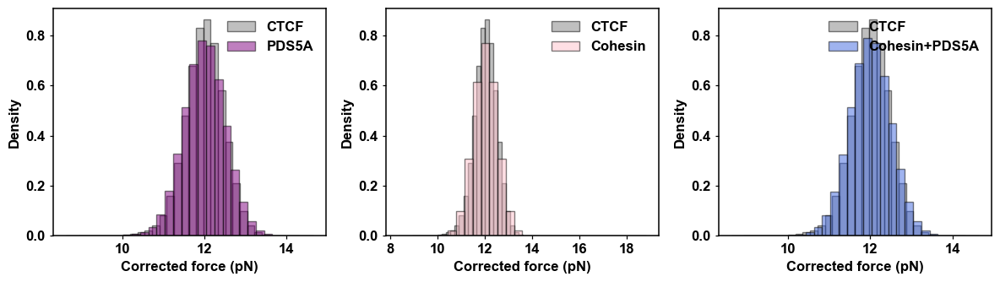

In [38]:
fig, ax = plt.subplots(1,3, figsize=(12, 3.5))
ax[0].hist(ctcf['force_corrected (pN)'], bins=30, edgecolor='black', color='grey', alpha=0.5, label='CTCF', density=True)
ax[0].hist(pds5a['force_corrected (pN)'], bins=30, edgecolor='black', color='purple', alpha=0.5, label='PDS5A', density=True)
ax[0].set_xlabel('Corrected force (pN)')
ax[0].set_ylabel('Density')
ax[0].legend(frameon=False)

ax[1].hist(ctcf['force_corrected (pN)'], bins=30, edgecolor='black', color='grey', alpha=0.5, label='CTCF', density=True)
ax[1].hist(cohesin['force_corrected (pN)'], bins=30, edgecolor='black', color='pink', alpha=0.5, label='Cohesin', density=True)
ax[1].set_xlabel('Corrected force (pN)')
ax[1].set_ylabel('Density')
ax[1].legend(frameon=False)

ax[2].hist(ctcf['force_corrected (pN)'], bins=30, edgecolor='black', color='grey', alpha=0.5, label='CTCF', density=True)
ax[2].hist(pandc['force_corrected (pN)'], bins=30, edgecolor='black', color='royalblue', alpha=0.5, label='Cohesin+PDS5A', density=True)
ax[2].set_xlabel('Corrected force (pN)')
ax[2].set_ylabel('Density')
ax[2].legend(frameon=False)
plt.tight_layout()
plt.show()

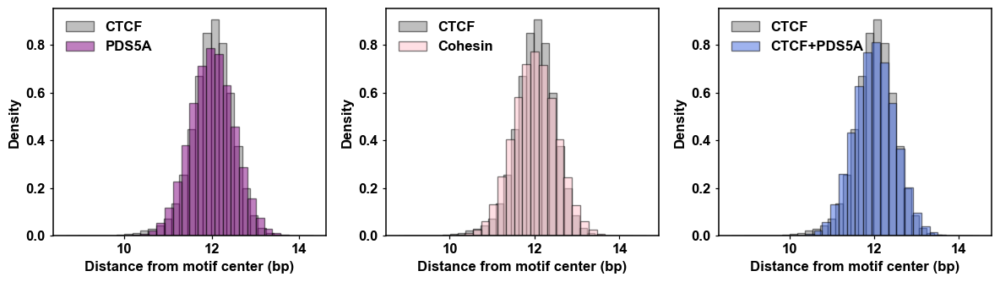

In [86]:
fig, ax = plt.subplots(1,3, figsize=(12, 3.5))
ax[0].hist(ctcf['force_corrected (pN)'], bins=30, edgecolor='black', color='grey', alpha=0.5, label='CTCF', density=True)
ax[0].hist(pds5a['force_corrected (pN)'], bins=30, edgecolor='black', color='purple', alpha=0.5, label='PDS5A', density=True)
ax[0].set_xlabel('Distance from motif center (bp)')
ax[0].set_ylabel('Density')
ax[0].legend(frameon=False)

ax[1].hist(ctcf['force_corrected (pN)'], bins=30, edgecolor='black', color='grey', alpha=0.5, label='CTCF', density=True)
ax[1].hist(cohesin['force_corrected (pN)'], bins=30, edgecolor='black', color='pink', alpha=0.5, label='Cohesin', density=True)
ax[1].set_xlabel('Distance from motif center (bp)')
ax[1].set_ylabel('Density')
ax[1].legend(frameon=False)

ax[2].hist(ctcf['force_corrected (pN)'], bins=30, edgecolor='black', color='grey', alpha=0.5, label='CTCF', density=True)
ax[2].hist(pandc['force_corrected (pN)'], bins=30, edgecolor='black', color='royalblue', alpha=0.5, label='CTCF+PDS5A', density=True)
ax[2].set_xlabel('Distance from motif center (bp)')
ax[2].set_ylabel('Density')
ax[2].legend(frameon=False)
plt.tight_layout()
plt.show()

(65.0, 77.0)

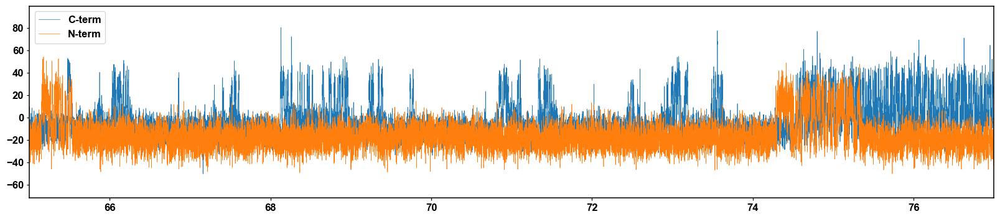

In [ ]:
fig, ax = plt.subplots(figsize=(20,4))
plt.plot(pc1_bp['time'], pc1_bp['bp_corrected'], lw=0.5, label='C-term')
plt.plot(p1_bp['time'], p1_bp['bp_corrected'], lw=0.5, label='N-term')

plt.legend()
plt.xlim(65, 77)

In [139]:
def compute_rolling_force_histogram_data(hmm_result, traces, n_components, window_size=5, bins=35):
    """
    Compute histogram data and Gaussian fit parameters for each hidden state
    after applying a rolling average to the force data.
    """
    # Safely unpack only first five elements
    X, hidden_states, all_time_data, all_force_data, combined_time = hmm_result[:5]

    combined_forces = []
    combined_hidden_states = []

    # Track start index
    start_idx = 0
    for trace_index, trace in enumerate(traces):
        trace_length = len(trace)
        trace_time = all_time_data[trace_index]
        trace_force = trace['bp_corrected'].values
        trace_hidden_states = hidden_states[start_idx:start_idx + trace_length]

        # Create dataframe and apply rolling average
        df_trace = pd.DataFrame({
            'time': trace_time,
            'bp_corrected': trace_force,
            'hidden_states': trace_hidden_states
        })
        df_trace = apply_rolling_average_bp(df_trace, window_size)

        # Append to combined lists
        combined_forces.extend(df_trace['bp_corrected'].values)
        combined_hidden_states.extend(df_trace['hidden_states'].values)

        start_idx += trace_length

    combined_forces = np.array(combined_forces)
    combined_hidden_states = np.array(combined_hidden_states)

    # Sort states by mean force
    state_means = np.array([combined_forces[combined_hidden_states == i].mean() for i in range(n_components)])
    sorted_indices = np.argsort(state_means)
    sorted_hidden_states = np.zeros_like(combined_hidden_states)
    for new_label, old_label in enumerate(sorted_indices):
        sorted_hidden_states[combined_hidden_states == old_label] = new_label

    # Compute histogram and fit data per state
    state_hist_data = []
    fit_params = []
    for i in range(n_components):
        state_forces = combined_forces[sorted_hidden_states == i]
        if len(state_forces) == 0:
            continue

        # Histogram data
        hist, bin_edges = np.histogram(state_forces, bins=bins, density=True)

        # Gaussian fit
        mu, std = norm.fit(state_forces)
        fit_params.append((mu, std, len(state_forces)))

        state_hist_data.append({
            "state": i + 1,
            "forces": state_forces,
            "hist": hist,
            "bin_edges": bin_edges,
            "mu": mu,
            "std": std,
            "count": len(state_forces)
        })

    return {
        "state_hist_data": state_hist_data,
        "combined_forces": combined_forces,
        "sorted_hidden_states": sorted_hidden_states,
        "fit_params": fit_params
    }


In [ ]:
nr = compute_rolling_force_histogram_data(p_hmm_result, [p1_bp, p2_bp, p3_bp, p4_bp], 4, window_size=1)
cr = compute_rolling_force_histogram_data(pc_hmm_result, [pc1_bp, pc2_bp, pc3_bp, pc4_bp], 4, window_size=1)

In [176]:
def plot_combined_trace_with_edge_histograms_flipped(hist_data_N, trace_N,
                                                     hist_data_C, trace_C,
                                                     colors=None, bins=35,
                                                     left_anchor=65, right_anchor=77,
                                                     histogram_width=1.0):
    """
    Plot two traces with mirrored histograms at edges.
    C-term histogram is flipped around 0 and state colors are reversed
    (1<->4, 2<->3).
    """
    # Default colors
    if colors is None:
        colors = ['steelblue', 'black', 'crimson', 'dimgrey']

    # Reverse colors for flipping states (1<->4, 2<->3)
    flipped_colors = colors[::-1]

    # Extract per-state forces
    state_forces_N = [s["forces"] for s in hist_data_N["state_hist_data"]]

    # Flip C-term forces around 0
    state_forces_C = [-s["forces"] for s in hist_data_C["state_hist_data"]]

    # --- Main figure ---
    fig, ax = plt.subplots(figsize=(20, 4))

    # Plot traces
    ax.plot(trace_N['time'], trace_N['bp_corrected'], lw=0.5, color='steelblue', label='N-term', zorder=1)
    ax.plot(trace_C['time'], trace_C['bp_corrected'], lw=0.5, color='orange', label='C-term', zorder=1)

    # Set x limits
    ax.set_xlim(left_anchor, right_anchor)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('bp corrected')
    ax.legend()

    # Get y-limits (bp) for histogram alignment
    y_min, y_max = ax.get_ylim()
    hist_range = (y_min, y_max)

    # --- Left histogram (N-term) ---
    for i, forces in enumerate(state_forces_N):
        hist, bin_edges = np.histogram(forces, bins=bins, range=hist_range, density=True)
        bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
        hist_scaled = hist / hist.max() * histogram_width

        ax.barh(bin_centers, hist_scaled, left=left_anchor,
                height=(bin_edges[1] - bin_edges[0]),
                color=colors[i % len(colors)], alpha=0.6, edgecolor='black', zorder=2)

    # --- Right histogram (C-term, flipped forces and colors) ---
    for i, forces in enumerate(state_forces_C):
        hist, bin_edges = np.histogram(forces, bins=bins, range=hist_range, density=True)
        bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
        hist_scaled = hist / hist.max() * histogram_width

        # Use flipped color order
        ax.barh(bin_centers, -hist_scaled, left=right_anchor,
                height=(bin_edges[1] - bin_edges[0]),
                color=flipped_colors[i % len(flipped_colors)], alpha=0.6, edgecolor='black', zorder=2)

    plt.tight_layout()
    plt.show()


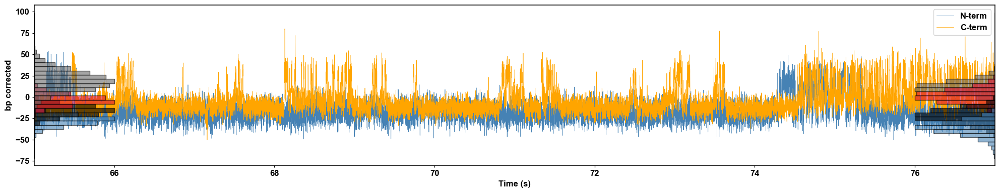

In [178]:
# Get histogram data for N-term and C-term
hist_data_N = compute_rolling_force_histogram_data(p_hmm_result, [p1_bp, p2_bp, p3_bp, p4_bp], 4, window_size=1)
hist_data_C = compute_rolling_force_histogram_data(pc_hmm_result, [pc1_bp, pc2_bp, pc3_bp, pc4_bp], 4, window_size=1)

# Select trace to plot (e.g., first trace)
trace_N = p1_bp
trace_C = pc1_bp

# Plot combined figure
plot_combined_trace_with_edge_histograms_flipped(
    hist_data_N, trace_N,
    hist_data_C, trace_C,
    left_anchor=65,
    right_anchor=77,
    histogram_width=1.  # adjust for visual balance
)
